# OpenCV
opencv is a library of programming functions mainly aimed at real-time computer vision. We will use it to process images and videos. OpenCV was originally developed by Intel and is now maintained by Willow Garage and ItSeez. opencv-python is the Python API of OpenCV. It combines the best qualities of OpenCV C++ API and Python language.

## Installation

In [2]:
%pip install opencv-python

  Obtaining dependency information for opencv-python from https://files.pythonhosted.org/packages/8a/6f/8aa049b66bcba8b5a4dc872ecfdbcd8603a96704b070fde22222e479c3d7/opencv_python-4.8.0.76-cp37-abi3-macosx_10_16_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.7/54.7 MB 11.0 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


## Mat - the basic image container
### Goal
We have multiple ways to aquire digital images from the real world: digital cameras, scanners, computed tomography, etc. In every case what we see are images. However, when transferred to a computer, the images are represented as a matrix of numbers. In this section we will learn how to use the Mat class to represent images in OpenCV.

### Basics
The Mat class represents a matrix. It is a 2D array, with each element of the array corresponding to a pixel in the image. The Mat class is defined in the Core module of OpenCV. The Mat class is a template class that can take any number of channels. The Mat class is defined as follows:

Mat< _Tp > class cv::Mat

The Mat class can be used to store photo in python as follows:

In [6]:
# import opencv
import cv2

# create a Mat object to store an image
img1 = cv2.imread('images/cat.webp')

# use the copy method to create a new image
img2 = img1

# modify the img1
img1[0, 0] = [255, 255, 255]

# what is the difference between the four images?
print(img1[0, 0])
print(img2[0, 0])
# img1 and img2 are the same object


[255 255 255]
[255 255 255]


What we can see that img1 and img4 are the same image, but the header is different. The real interesting is that you can headers which refer to subsection of the fall data.


In [7]:
# subsection of an image
img3 = img1[100:200, 200:300]
img3[0, 0] = [0, 0, 0]
print(img1[100, 200])
print(img3[0, 0])


[0 0 0]
[0 0 0]


Now we may wonder - if the matrix itself may belong to multiple Mat objects, how do we know when to deallocate the matrix? The answer is simple - the matrix will be deallocated when the last Mat object referencing it is gone. In other words, the matrix will be deallocated when the header is gone. For example, the following code will deallocate the matrix pointed by img1:

In [8]:
# delocate the memory
del img1, img2, img3

Sometimes we may want to copy the data of a matrix to another matrix. In this case, we can use the copy() method of the Mat class. For example, the following code will copy the data of img1 to img2:

In [12]:
# clone and copy
img1 = cv2.imread('images/cat.webp')
img2 = img1.copy()

# modify the img1
img1[0, 0] = [255, 255, 255]

# what is the difference between the four images?
print(img1[0, 0])
print(img2[0, 0])
# img1 and img2 are different objects
del img1, img2

[255 255 255]
[244 243 241]


### Storing methods
This is about how the pixel value is stored. We can select the color space and the data type of the pixel value. The color space refers to how we combine color components to create colors. The simplest color space is the grayscale color space. In this color space, each pixel is represented by a single number. The number represents the intensity of the pixel. The higher the number, the brighter the pixel. The grayscale color space is also called the intensity color space.

The RGB color space is the most common color space. In this color space, each pixel is represented by three numbers. The three numbers represent the intensity of the red, green and blue components of the pixel. The higher the number, the brighter the component. To code the transparency of a color a fourth component is added. This color space is called RGBA.

There are, however, many other color systems, each with their own advantages:
        RGB - Red, Green, Blue (default) : however OpenCV stores them in BGR order
        HSV - Hue, Saturation, Value and HLS - Hue, Lightness, Saturation : are more natural way to think about colors, we may discard the value or last component to make more robust to lighting changes
        YUV - Luminance, Chrominance : is used in video systems, where Y is the luminance component and U and V are the chrominance components
        YCrCb - Luminance, Red Chrominance, Blue Chrominance  : used for JPEG and MPEG images
        CIE - L*a*b* - Lightness, Red-Green, Blue-Yellow : is designed to approximate human vision, is perceptually uniform color space, meaning that the difference between two colors is perceptually uniform, which come handy if we need to measure distance given two colors

The data type of the pixel value can be unsigned char, signed char, unsigned short, signed short, int, float, double, etc. The data type of the pixel value is specified by the template parameter of the Mat class. Note that increasing the data type will increase the memory required to store the pixel value. 

Examples of how to create a Mat object with different color spaces and data types are shown below:


In [16]:
# images with different color spaces (BGR, GRAY, HSV) and different data types (uint8, float32 , char)
img = cv2.imread('images/cat.webp')
print(img.shape)
print(img.dtype)

# convert the image to gray scale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print(img_gray.shape)
print(img_gray.dtype)

# convert the image to HSV
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
print(img_hsv.shape)
print(img_hsv.dtype)

# convert the image to float32
img_float32 = img.astype(np.float32)
print(img_float32.shape)
print(img_float32.dtype)

# convert the image to uint8
img_uint8 = img.astype(np.uint8)
print(img_uint8.shape)
print(img_uint8.dtype)

# convert the image to char
img_char = img.astype(np.int8)
print(img_char.shape)
print(img_char.dtype)


# delocate the memory
del img, img_gray, img_hsv, img_float32, img_uint8, img_char

(900, 600, 3)
uint8
(900, 600)
uint8
(900, 600, 3)
uint8
(900, 600, 3)
float32
(900, 600, 3)
uint8
(900, 600, 3)
int8


### Creating Mat objects explicitly
We can use cv::imwrite() to write a matrix to an image file. The first parameter is the name of the file. The second parameter is the matrix to be written. The third parameter is an optional parameter specifying the compression method. The default value is 0, which means that the image is not compressed. The following code writes the matrix img1 to the file img1.png:

In [17]:
# imwrite method
img = cv2.imread('images/cat.webp')
cv2.imwrite('images/cat.png', img)

# delocate the memory
del img

However, for debugging purposes, it is convenient to see actual values of the matrix. 

In [30]:
# import numpy
import numpy as np

# 2 by 2 image with 0,0,255 color on all pixels
img = np.full((2, 2, 3), (0, 0, 255), dtype=np.uint8)
print("img shape with 0,0,255 color on all pixels")
print(img)
# 2x2 image with 2 channels
print("2x2 image with 2 channels")
img = np.full((2, 2, 2), 255, dtype=np.uint8)
print(img)
# zeros ones and eye
## 2x2 image with 3 channels and all pixels are 0
print("2x2 image with 3 channels and all pixels are 0")
img = np.zeros((2, 2, 3), dtype=np.uint8)
print(img)
## 2x2 image with 3 channels and all pixels are 1
print("2x2 image with 3 channels and all pixels are 1")
img = np.ones((2, 2, 3), dtype=np.uint8)
print(img)
## eye matrix with 2x2 and 1 channel and all pixels are 1 on the diagonal
print("eye matrix with 2x2 and 1 channel and all pixels are 1 on the diagonal")
img = np.eye(2, dtype=np.uint8)
print(img)

del img



img shape with 0,0,255 color on all pixels
[[[  0   0 255]
  [  0   0 255]]

 [[  0   0 255]
  [  0   0 255]]]
2x2 image with 2 channels
[[[255 255]
  [255 255]]

 [[255 255]
  [255 255]]]
2x2 image with 3 channels and all pixels are 0
[[[0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]]]
2x2 image with 3 channels and all pixels are 1
[[[1 1 1]
  [1 1 1]]

 [[1 1 1]
  [1 1 1]]]
eye matrix with 2x2 and 1 channel and all pixels are 1 on the diagonal
[[1 0]
 [0 1]]


In [29]:
# clone a row
img = cv2.imread('images/cat.webp')
img_clone = img[0].copy()
img_clone[0] = [255, 255, 255]
print('row')
print(img[0, 0])
print(img_clone[0])

# clone a column
img_clone = img[:, 0].copy()
img_clone[0] = [255, 255, 255]
print('column')
print(img[0, 0])
print(img_clone[0])

del img, img_clone



row
[244 243 241]
[255 255 255]
column
[244 243 241]
[255 255 255]


### Output format
In python we can use the print() function to print the matrix. However, the output is not very readable. We can use the format() method of the Mat class to print the matrix in a more readable format. The format() method takes a format specifier as a parameter. The format specifier is a string that specifies how the matrix should be formatted. The format specifier is similar to the format specifier used in the printf() function of the C language.


## Getting Started with Image

### Goal
In this section we will learn how to use OpenCV to read an image from a file and display the image on the screen. We will also learn how to save an image to a file.

### Source code
This code reads an image from a file and displays the image on the screen. The parameters of imread() function is 
- the name of the file to be read
- the format of the file to be read. The default value is IMREAD_COLOR, which means that the image is read in the BGR format. Other possible values are IMREAD_GRAYSCALE and IMREAD_UNCHANGED.

namedWindow() function is used to create a window in which the image is to be displayed. The parameters of the namedWindow() function are:
- the name of the window
- the flags of the window. The default value is WINDOW_AUTOSIZE, which means that the window is automatically resized to fit the image. Other possible values are WINDOW_NORMAL, which means that the window is not automatically resized, and WINDOW_OPENGL, which means that the window is created for OpenGL support.

imshow() function is used to display the image on the screen. The parameters of the imshow() function are:
- the name of the window in which the image is to be displayed
- the image to be displayed


waitKey() function is used to wait for a key to be pressed, has the following parameter:
- the number of milliseconds to wait for a key to be pressed. The default value is 0, which means that the program waits indefinitely for a key to be pressed.

imwrite() function is used to write the image to a file. The parameters of the imwrite() function are:
- the name of the file to be written
- the image to be written to the file

destroyAllWindows() function is used to destroy all the windows created by the program.

In [1]:
import cv2 as cv
import sys

# read the image
img = cv.imread('images/cat.webp')

# check if the image is loaded
if img is None:
    sys.exit("Could not read the image.")

# create a window
cv.namedWindow('image', cv.WINDOW_NORMAL)

# display the image
cv.imshow('image', img)

# wait for a key
k = cv.waitKey(0)

# if the key pressed is 's'
if k == ord('s'):
    # save the image
    cv.imwrite('images/cat.png', img)
    # destroy all windows
    cv.destroyAllWindows()


2023-09-19 17:16:31.900 Python[7700:471979] WARNING: Secure coding is not enabled for restorable state! Enable secure coding by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState: and returning YES.


: 

## Getting Started with Video

### Goal
In this section we will learn how to use OpenCV to read a video from a file and display the video on the screen. We will also learn how to save a video to a file.

### Capture video from camera
To capture a video from a camera, we first need to create a VideoCapture object. The VideoCapture object is created as follows:

In [3]:
# capture video from camera
import cv2 as cv
import numpy as np

# create a VideoCapture object
cap = cv.VideoCapture(0)

# check if the camera is opened
if not cap.isOpened():
    print("Cannot open camera")
    exit()

# read the frame
while True:
    # capture frame by frame
    ret, frame = cap.read()

    # if frame is read correctly ret is True
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break

    # our operations on the frame come here
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    mirror = cv.flip(gray, 1)
    
    cv.imshow('mirror', mirror)
    # wait for a key
    if cv.waitKey(1) == ord('q'):
        break

# release the capture
cap.release()

# destroy all windows
cv.destroyAllWindows()



cap.read() function is used to read a frame from the video. The parameters of the cap.read() function are:
- the frame to be read from the video

cap.isOpened() function is used to check if the video is opened successfully. The parameters of the cap.isOpened() function are:
- the frame to be read from the video

cap.release() function is used to release the video. The parameters of the cap.release() function are:

cap.get() function is used to get the properties of the video. The parameters of the cap.get() function are:
- the property to be retrieved

cap.set() function is used to set the properties of the video. The parameters of the cap.set() function are:
- the property to be set
- the value of the property to be set

### Play video from file
To play a video from a file, we first need to create a VideoCapture object. The VideoCapture object is created as follows:


In [5]:
# play video from file
import cv2 as cv
import numpy as np

# create a VideoCapture object
cap = cv.VideoCapture('videos/cute.mp4')

while cap.isOpened():
    # read the frame
    ret, frame = cap.read()

    # if frame is read correctly ret is True
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break

    # our operations on the frame come here
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    mirror = cv.flip(gray, 1)
    
    cv.imshow('mirror', mirror)
    # wait for a key
    if cv.waitKey(1) == ord('q'):
        break



### Save video to file
To save a video to a file, we first need to create a VideoWriter object. The VideoWriter object is created as follows:


In [10]:
# Save video
import cv2 as cv
import numpy as np

# create a VideoCapture object
cap = cv.VideoCapture(0)

# define the codec and create VideoWriter object
fourcc = cv.VideoWriter_fourcc(*'MJPG')
out = cv.VideoWriter('videos/output.mp4', fourcc, 20.0, (640, 480))

while cap.isOpened():
    # read the frame
    ret, frame = cap.read()

    # if frame is read correctly ret is True
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break

    # our operations on the frame come here
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    mirror = cv.flip(gray, 1)
    # make it look cartoonish
    mirror = cv.medianBlur(mirror, 5)
    # add edge detection
    mirror = cv.Canny(mirror, 100, 200)
    
    # write the flipped frame
    out.write(mirror)
    
    cv.imshow('mirror', mirror)
    # wait for a key
    if cv.waitKey(1) == ord('q'):
        break

# release the capture
cap.release()

# release the output
out.release()

# destroy all windows
cv.destroyAllWindows()


OpenCV: FFMPEG: tag 0x47504a4d/'MJPG' is not supported with codec id 7 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


video.write() function is used to write a frame to the video. The parameters of the video.write() function are:
- the frame to be written to the video

VideoWriter_fourcc() function is used to create a four character code (FOURCC) for the video codec.
FourCC is a 4-byte code used to specify the video codec. The list of available codes can be found in fourcc.org. It is platform dependent. The following codecs work fine for me.

In Fedora: DIVX, XVID, MJPG, X264, WMV1, WMV2. (XVID is more preferable. MJPG results in high size video. X264 gives very small size video)
In Windows: DIVX (More to be tested and added)
In OSX: MJPG (.mp4), DIVX (.avi), X264 (.mkv).
FourCC code is passed as `cv.VideoWriter_fourcc('M','J','P','G')or cv.VideoWriter_fourcc(*'MJPG')` for MJPG.


## Getting Started with Drawing

### Goal
In this section we will learn how to use OpenCV to draw lines, rectangles, circles, ellipses, polygons, text and put images on an image.

### Drawing lines
line() function is used to draw a line on an image. The parameters of the line() function are:
- the image on which the line is to be drawn
- the starting point of the line
- the ending point of the line
- the color of the line
- the thickness of the line

In [13]:
# draw a line
import cv2 as cv
import numpy as np

# create a black image
img = np.zeros((512, 512, 3), np.uint8)

# draw a diagonal blue line with thickness of 5 px
img = cv.line(img, (0, 0), (511, 511), (255, 0, 0), 5)

# display the image
cv.imshow('image', img)

# wait for a key
cv.waitKey(0)

# destroy all windows
cv.destroyAllWindows()


### Drawing rectangles
rectangle() function is used to draw a rectangle on an image. The parameters of the rectangle() function are:
- the image on which the rectangle is to be drawn
- the top-left corner of the rectangle
- the bottom-right corner of the rectangle
- the color of the rectangle
- the thickness of the rectangle

In [14]:
# draw a rectangle with thickness of 3 px and green color
img = cv.rectangle(img, (384, 0), (510, 128), (0, 255, 0), 3)

# display the image
cv.imshow('image', img)

# wait for a key
cv.waitKey(0)

# destroy all windows
cv.destroyAllWindows()

### Drawing circles
circle() function is used to draw a circle on an image. The parameters of the circle() function are:
- the image on which the circle is to be drawn
- the center of the circle
- the radius of the circle
- the color of the circle
- the thickness of the circle


In [15]:
# draw a circle with thickness of -1 px and red color
img = cv.circle(img, (447, 63), 63, (0, 0, 255), -1)

# display the image
cv.imshow('image', img)

# wait for a key
cv.waitKey(0)

# destroy all windows
cv.destroyAllWindows()

### Drawing ellipses
ellipse() function is used to draw an ellipse on an image. The parameters of the ellipse() function are:
- the image on which the ellipse is to be drawn
- the center of the ellipse
- the axes of the ellipse
- the angle of rotation of the ellipse
- the starting angle of the ellipse
- the ending angle of the ellipse
- the color of the ellipse
- the thickness of the ellipse

In [17]:
# draw an ellipse with thickness of -1 px of angle 0 and 180 degrees and blue color
img = cv.ellipse(img, (256, 256), (100, 50), 0, 0, 180, 255, -1)

# display the image
cv.imshow('image', img)

# wait for a key
cv.waitKey(0)

# destroy all windows
cv.destroyAllWindows()


### Drawing polygons
polylines() function is used to draw a polygon on an image. The parameters of the polylines() function are:
- the image on which the polygon is to be drawn
- the points of the polygon
- the color of the polygon
- the thickness of the polygon

Note that the points of the polygon are passed as a list of points. Each point is a tuple of two integers. The first integer is the x-coordinate of the point. The second integer is the y-coordinate of the point. The points are connected by straight lines. The last point is connected to the first point. Can be used to draw multiple lines. Better and faster way to draw a group of lines than calling cv2.line() for each line.


In [19]:
# draw a polygon with thickness of -1 px and yellow color
pts = np.array([[10,5],[20,30],[70,20],[50,10]], np.int32)
pts = pts.reshape((-1,1,2))
cv.polylines(img,[pts],True,(0,255,255))

# display the image
cv.imshow('image', img)

# wait for a key
cv.waitKey(0)

# destroy all windows
cv.destroyAllWindows()

### Drawing text
putText() function is used to draw text on an image. The parameters of the putText() function are:
- the image on which the text is to be drawn
- the text to be drawn
- the position of the text
- the font of the text
- the size of the text
- the color of the text
- the thickness of the text

In [20]:
# add text to the image
font = cv.FONT_HERSHEY_SIMPLEX

cv.putText(img,'OpenCV',(10,500), font, 4,(255,255,255),2,cv.LINE_AA)

# display the image
cv.imshow('image', img)

# wait for a key
cv.waitKey(0)

# destroy all windows
cv.destroyAllWindows()

#### OpenCV logo

In [88]:
## OpenCv logo
# create a black image
img = np.zeros((512, 512, 3), np.uint8)

# draw the red C on top center
img = cv.circle(img, (256, 128), 100, (0, 0, 255), -1)
img = cv.circle(img, (256, 128), 50, (0, 0, 0), -1)
# draw a filled triangle
pts = np.array([[256, 128], [190, 256], [320, 256]], np.int32)
pts = pts.reshape((-1, 1, 2))
img = cv.fillPoly(img, [pts], (0, 0, 0))

# draw the green C on bottom left
img = cv.circle(img, (128, 384), 100, (0, 255, 0), -1)
img = cv.circle(img, (128, 384), 50, (0, 0, 0), -1)
# draw a filled triangle for the green C
pts = np.array([[128, 384], [190, 256], [256, 356]], np.int32)
pts = pts.reshape((-1, 1, 2))
img = cv.fillPoly(img, [pts], (0, 0, 0))

# draw the blue C on bottom right
img = cv.circle(img, (384, 384), 100, (255, 0, 0), -1)
img = cv.circle(img, (384, 384), 50, (0, 0, 0), -1)
# draw a filled triangle to open the blue C from the top
pts = np.array([[384, 384], [448, 256], [320, 256]], np.int32)
pts = pts.reshape((-1, 1, 2))
img = cv.fillPoly(img, [pts], (0, 0, 0))

# display the image
cv.imshow('image', img)

# wait for a key
cv.waitKey(0)

# destroy all windows
cv.destroyAllWindows()

: 

![opencv](images/opencv_logo.png)

## Mouse as a Paint-Brush

### Goal
Learn to handle mouse events in OpenCV and OpenCV callbacks

### Simple Demo
We will create a simple application which draws a circle when we left-click on the image, and a rectangle when we right-click on it.

First we create a mouse callback function which is executed when a mouse event take place. Mouse event can be anything related to mouse like left-button down, left-button up, left-button double-click etc. It gives us the coordinates (x,y) for every mouse event. With this event and location, we can do whatever we like. To list all available events available, run the following code in Python terminal:

In [1]:
import cv2 as cv
events = [i for i in dir(cv) if 'EVENT' in i]
print(events)


['EVENT_FLAG_ALTKEY', 'EVENT_FLAG_CTRLKEY', 'EVENT_FLAG_LBUTTON', 'EVENT_FLAG_MBUTTON', 'EVENT_FLAG_RBUTTON', 'EVENT_FLAG_SHIFTKEY', 'EVENT_LBUTTONDBLCLK', 'EVENT_LBUTTONDOWN', 'EVENT_LBUTTONUP', 'EVENT_MBUTTONDBLCLK', 'EVENT_MBUTTONDOWN', 'EVENT_MBUTTONUP', 'EVENT_MOUSEHWHEEL', 'EVENT_MOUSEMOVE', 'EVENT_MOUSEWHEEL', 'EVENT_RBUTTONDBLCLK', 'EVENT_RBUTTONDOWN', 'EVENT_RBUTTONUP']


Creating mouse callback function has a specific format which is same everywhere. It differs only in what the function does. So our mouse callback function does two things, it draws either rectangles or circles (depending on the mode we select) and it also tracks the position where we click. So see the code below. Code is self-explanatory from comments :

In [2]:
import numpy as np
import cv2 as cv

# mouse callback function
def draw_circle(event,x,y,flags,param):
    # if left button is pressed
    if event == cv.EVENT_LBUTTONDOWN:
        # draw a circle
        cv.circle(img,(x,y),100,(255,0,0),-1)
    # if right button is pressed
    elif event == cv.EVENT_RBUTTONDOWN:
        # draw a rectangle
        cv.rectangle(img,(x,y),(x+100,y+100),(0,255,0),-1)

# create a black image
img = np.zeros((512,512,3), np.uint8)
# create a window
cv.namedWindow('image')
# bind the function to window
cv.setMouseCallback('image',draw_circle)

while(1):
    # display the image
    cv.imshow('image',img)
    # wait for a key 27 is the ESC key
    if cv.waitKey(20) & 0xFF == 27:
        break
# destroy all windows
cv.destroyAllWindows()

2023-09-20 20:06:55.129 Python[9435:650931] WARNING: Secure coding is not enabled for restorable state! Enable secure coding by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState: and returning YES.


### More Advanced Demo
Now we go for much more better application. In this, we draw either rectangles or circles (depending on the mode we select) by dragging the mouse like we do in Paint application. So our mouse callback function has two parts, one to draw rectangle and other to draw the circles. This specific example will be really helpful in creating and understanding some interactive applications like object tracking, image segmentation etc.

Here we draw either rectangles or circles (depending on the mode we select) by dragging the mouse like we do in Paint application. So our mouse callback function has two parts, one to draw rectangle and other to draw the circles. This specific example will be really helpful in creating and understanding some interactive applications like object tracking, image segmentation etc.

In [4]:
import numpy as np
import cv2 as cv

drawing = False # true if mouse is pressed
mode = True # if True, draw rectangle. Press 'm' to toggle to curve
ix,iy = -1,-1

# mouse callback function
def draw_circle(event,x,y,flags,param):
    global ix,iy,drawing,mode

    # if left button is pressed
    if event == cv.EVENT_LBUTTONDOWN:
        drawing = True
        ix,iy = x,y

    # if mouse is moving
    elif event == cv.EVENT_MOUSEMOVE:
        if drawing == True:
            if mode == True:
                # draw a rectangle
                cv.rectangle(img,(ix,iy),(x,y),(0,255,0),3)
            else:
                # draw a circle
                cv.circle(img,(x,y),5,(0,0,255),-1)

    # if left button is released
    elif event == cv.EVENT_LBUTTONUP:
        drawing = False
        if mode == True:
            # draw a rectangle
            cv.rectangle(img,(ix,iy),(x,y),(0,255,0),3)
        else:
            # draw a circle
            cv.circle(img,(x,y),5,(0,0,255),-1)

# create a black image
img = np.zeros((512,512,3), np.uint8)
# create a window
cv.namedWindow('image')
# bind the function to window
cv.setMouseCallback('image',draw_circle)

while(1):
    # display the image
    cv.imshow('image',img)
    # wait for a key 27 is the ESC key
    k = cv.waitKey(1) & 0xFF
    if k == ord('m'):
        mode = not mode
    elif k == 27:
        break
# destroy all windows
cv.destroyAllWindows()


## Trackbar as the Color Palette

### Goal
Learn to bind trackbar to OpenCV windows, get trackbar events, get trackbar values, trackbar as the Color Palette

### Code Demo

Here we will create a simple application which shows the color you specify. You have a window which shows the color and three trackbars to specify each of B,G,R colors. You slide the trackbar and correspondingly window color changes. By default, initial color will be set to Black.

There are two important things to be noted:

    For cv2.getTrackbarPos() function, first argument is the trackbar name, second one is the window name to which it is attached, third argument is the default value, fourth one is the maximum value and fifth one is the callback function which is executed everytime trackbar value changes. The callback function always has a default argument which is the trackbar position. In our case, function does nothing, so we simply pass.

    Another important application of trackbar is to use it as a button or switch. OpenCV, by default, doesn’t have button functionality. So you can use trackbar to get such functionality. In our application, we have created one switch in which application works only if switch is ON, otherwise screen is always black.

In [2]:
import numpy as np
import cv2 as cv

def nothing(x):
    pass

# create a black image, a window
img = np.zeros((300,512,3), np.uint8)
cv.namedWindow('image')

# create trackbars for color change
cv.createTrackbar('R','image',0,255,nothing)
cv.createTrackbar('G','image',0,255,nothing)
cv.createTrackbar('B','image',0,255,nothing)

# create switch for ON/OFF functionality
switch = '0 : OFF \n1 : ON'
cv.createTrackbar(switch, 'image',0,1,nothing)

while(1):
    # display the image
    cv.imshow('image',img)
    # wait for a key 27 is the ESC key
    k = cv.waitKey(1) & 0xFF
    if k == 27:
        break

    # get current positions of four trackbars
    r = cv.getTrackbarPos('R','image')
    g = cv.getTrackbarPos('G','image')
    b = cv.getTrackbarPos('B','image')
    s = cv.getTrackbarPos(switch,'image')

    # if switch is ON
    if s == 0:
        img[:] = 0
    else:
        img[:] = [b,g,r]

# destroy all windows
cv.destroyAllWindows()



### More Advanced Demo
Here we will create a paint application which lets us draw circles in different colors. So you have a window which shows the color palette along with some radio button to choose color, a window where you can draw anything and trackbars to specify the size of the brush.

In [ ]:
import numpy as np
import cv2 as cv

drawing = False # true if mouse is pressed
mode = True # if True, draw rectangle. Press 'm' to toggle to curve
ix,iy = -1,-1

# mouse callback function
def draw_circle(event,x,y,flags,param):
    global ix,iy,drawing,mode
    # get color and thickness from trackbar
    r = cv.getTrackbarPos('R','image')
    g = cv.getTrackbarPos('G','image')
    b = cv.getTrackbarPos('B','image')
    t = cv.getTrackbarPos('T','image')
    color = (b,g,r)
    # if left button is pressed
    if event == cv.EVENT_LBUTTONDOWN:
        drawing = True
        ix,iy = x,y
    # if mouse is moving
    elif event == cv.EVENT_MOUSEMOVE:
        if drawing == True:
            if mode == True:
                # draw a circle
                cv.circle(img,(x,y),t,color,-1)
            else:
                # draw a rectangle
                cv.rectangle(img,(ix,iy),(x,y),color,-1)
    # if left button is released
    elif event == cv.EVENT_LBUTTONUP:
        drawing = False
        if mode == True:
            # draw a circle
            cv.circle(img,(x,y),t,color,-1)
        else:
            # draw a rectangle
            cv.rectangle(img,(ix,iy),(x,y),color,-1)

# create a black image
img = np.zeros((512,512,3), np.uint8)
# create a window
cv.namedWindow('image')
# bind the function to window
cv.setMouseCallback('image',draw_circle)

# create trackbars for color change
cv.createTrackbar('R','image',0,255,lambda x: x)
cv.createTrackbar('G','image',0,255,lambda x: x)
cv.createTrackbar('B','image',0,255,lambda x: x)
# create trackbar for thickness
cv.createTrackbar('T','image',1,100,lambda x: x)

while(1):
    # display the image
    cv.imshow('image',img)
    # wait for a key 27 is the ESC key
    k = cv.waitKey(1) & 0xFF
    if k == ord('m'):
        mode = not mode
    elif k == 27:
        break
# destroy all windows
cv.destroyAllWindows()

: 

## Basic Operations on Images\
### Goal
Learn to:

    Access pixel values and modify them
    Access image properties
    Setting Region of Image (ROI)
    Splitting and Merging images

### Accessing and Modifying pixel values
Let’s load a color image first:


In [1]:
import numpy as np
import cv2 as cv

img = cv.imread('images/cat.webp')
assert img is not None, "Could not read the image."

Now you can access the pixel value by row and column coordinates. For BGR image, it returns an array of Blue, Green, Red values. For grayscale image, just corresponding intensity is returned.

In [2]:
px = img[100, 100]
print(px)

# accessing only blue pixel
blue = img[100, 100, 0]
print(blue)

# modify the pixel values
img[100, 100] = [255, 255, 255]
print(img[100, 100])


[235 234 238]
235
[255 255 255]


#### Warning
Numpy is a optimized library for fast array calculations. So simply accessing each and every pixel values and modifying it will be very slow and it is discouraged.

#### Note
Above mentioned method is normally used for selecting a region of array, say first 5 rows and last 3 columns like that. For individual pixel access, Numpy array methods, array.item() and array.itemset() is considered to be better. But it always returns a scalar. So if you want to access all B,G,R values, you need to call array.item() separately for all.

Better pixel accessing and editing method :

In [3]:
# accessing RED value
print(img.item(10, 10, 2))

# modifying RED value
img.itemset((10, 10, 2), 100)
print(img.item(10, 10, 2))


241
100


### Accessing Image Properties
Image properties include number of rows, columns and channels, type of image data, number of pixels etc.

Shape of image is accessed by img.shape. It returns a tuple of number of rows, columns and channels (if image is color):

In [5]:
img.shape

(900, 600, 3)

#### Note
If image is grayscale, tuple returned contains only number of rows and columns. So it is a good method to check if loaded image is grayscale or color image.

Total number of pixels is accessed by img.size and it returns a number of pixels. Image datatype is obtained by img.dtype.


In [6]:
print(img.size)
print(img.dtype)

1620000
uint8


### Image ROI

Sometimes, you will have to play with certain region of images. For eye detection in images, first perform face detection over the image until the face is found, then search within the face region for eyes. This approach improves accuracy (because eyes are always on faces :D ) and performance (because we search for a small area).

ROI is again obtained using Numpy indexing. Here I am selecting the ball and copying it to another region in the image:

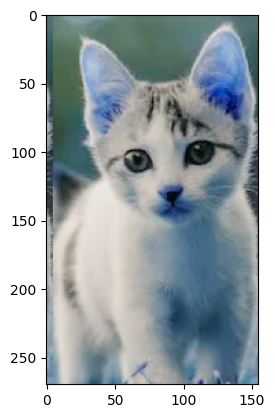

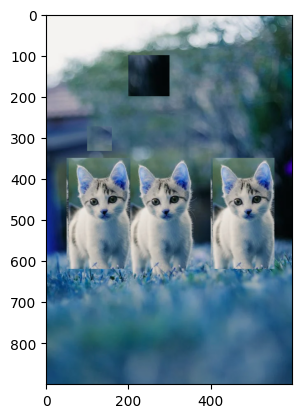

In [16]:
import matplotlib.pyplot as plt

cat = img[350:620, 200:355]
plt.imshow(cat)
plt.show()

img[350:620, 50:205] = cat
img[350:620, 400:555] = cat
plt.imshow(img)
plt.show()



### Splitting and Merging Image Channels
The B,G,R channels of an image can be split into their individual planes when needed. Then, the individual channels can be merged back together to form a BGR image again. This can be performed by:

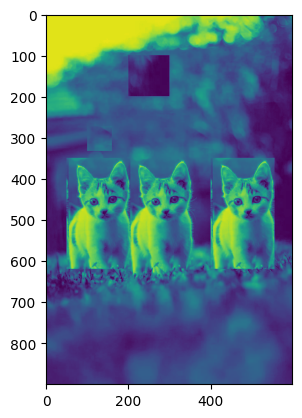

In [20]:
b, g, r = cv.split(img)
img = cv.merge((b, g, r))
# or
b = img[:, :, 0]
plt.imshow(b)

suppose we want to set all the red pixels to zero, we do not need to split the channels first. Numpy indexing is faster.

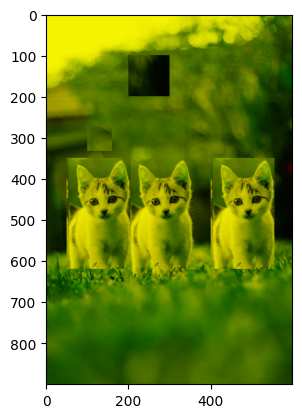

In [22]:
img[:, :, 2] = 0
plt.imshow(img)

#### Warning
cv.split() is a costly operation (in terms of time), so only use it if necessary. Numpy indexing is much more efficient and should be used if possible.

### Making Borders for Images (Padding)

If you want to create a border around the image, something like a photo frame, you can use cv.copyMakeBorder() function. But it has more applications for convolution operation, zero padding etc. This function takes following arguments:

    src - input image
    top, bottom, left, right - border width in number of pixels in corresponding directions
    borderType - Flag defining what kind of border to be added. It can be following types:
        cv.BORDER_CONSTANT - Adds a constant colored border. The value should be given as next argument.
        cv.BORDER_REFLECT - Border will be mirror reflection of the border elements, like this : fedcba|abcdefgh|hgfedcb
        cv.BORDER_REFLECT_101 or cv.BORDER_DEFAULT - Same as above, but with a slight change, like this : gfedcb|abcdefgh|gfedcba
        cv.BORDER_REPLICATE - Last element is replicated throughout, like this: aaaaaa|abcdefgh|hhhhhhh
        cv.BORDER_WRAP - Can’t explain, it will look like this : cdefgh|abcdefgh|abcdefg
    value - Color of border if border type is cv.BORDER_CONSTANT

Below is a sample code demonstrating all these border types for better understanding:


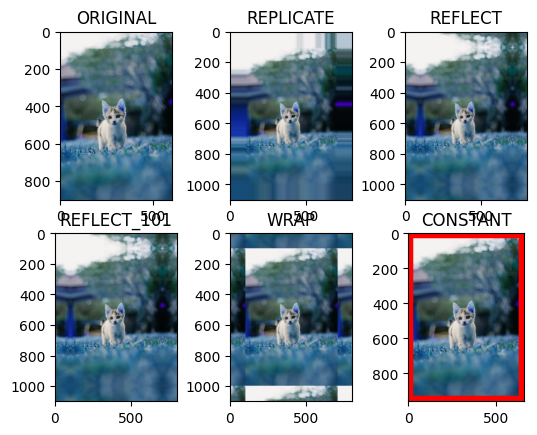

: 

In [28]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

BLUE = [255, 0, 0]

img1 = cv.imread('images/cat.webp')
assert img1 is not None, "Could not read the image."

replicate = cv.copyMakeBorder(img1, 100, 100, 100, 100, cv.BORDER_REPLICATE)
reflect = cv.copyMakeBorder(img1, 100, 100, 100, 100, cv.BORDER_REFLECT)
reflect101 = cv.copyMakeBorder(img1, 100, 100, 100, 100, cv.BORDER_REFLECT_101)
wrap = cv.copyMakeBorder(img1, 100, 100, 100, 100, cv.BORDER_WRAP)
constant = cv.copyMakeBorder(img1, 30, 30, 30, 30, cv.BORDER_CONSTANT, value=BLUE)

plt.subplot(231), plt.imshow(img1, 'gray'), plt.title('ORIGINAL')
plt.subplot(232), plt.imshow(replicate, 'gray'), plt.title('REPLICATE')
plt.subplot(233), plt.imshow(reflect, 'gray'), plt.title('REFLECT')
plt.subplot(234), plt.imshow(reflect101, 'gray'), plt.title('REFLECT_101')
plt.subplot(235), plt.imshow(wrap, 'gray'), plt.title('WRAP')
plt.subplot(236), plt.imshow(constant, 'gray'), plt.title('CONSTANT')

plt.show()

## Arithmetic Operations on Images

### Goal
Learn several arithmetic operations on images like addition, subtraction, bitwise operations etc.

### Image Addition
You can add two images by OpenCV function, cv.add() or simply by numpy operation, res = img1 + img2. Both images should be of same depth and type, or second image can just be a scalar value.

#### Note
There is a difference between OpenCV addition and Numpy addition. OpenCV addition is a saturated operation while Numpy addition is a modulo operation.

For example, consider below sample:

In [1]:
import cv2 as cv
import numpy as np
x = np.uint8([250])
y = np.uint8([10])

print(cv.add(x, y)) # 250+10 = 260 => 255

print(x + y) # 250+10 = 260 % 256 = 4

[[255]]
[4]


This result will be more visible when you add two images. OpenCV function will provide a better result. So always better stick to OpenCV functions.

### Image Blending
This is also image addition, but different weights are given to images so that it gives a feeling of blending or transparency. Images are added as per the equation below:
$$
g(x) = (1 - \alpha)f_0(x) + \alpha f_1(x)
$$
By varying $\alpha$ from 0 $\rightarrow$ 1, you can perform a cool transition between one image to another.

Here I took two images to blend them together. First image is given a weight of 0.7 and second image is given 0.3. cv.addWeighted() applies following equation on the image.

$$
dst = \alpha \cdot img1 + \beta \cdot img2 + \gamma
$$

Here $\gamma$ is taken as zero.

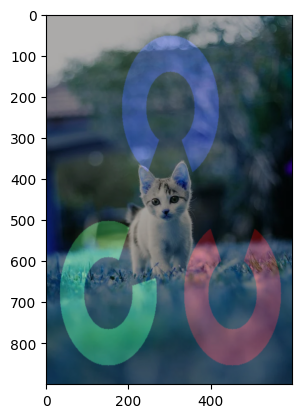

In [13]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
img1 = cv.imread('images/cat.webp')
assert img1 is not None, "Could not read the image."

img2 = cv.imread('images/opencv_logo.png')
assert img2 is not None, "Could not read the image."

# ajust size of the logo to be the same as the cat
img2 = cv.resize(img2, (img1.shape[1], img1.shape[0]))

# add the images
dst = cv.addWeighted(img1, 0.7, img2, 0.3, 0)
plt.imshow(dst)
plt.show()



### Bitwise Operations

This includes bitwise AND, OR, NOT and XOR operations. They will be highly useful while extracting any part of the image (as we will see in coming chapters), defining and working with non-rectangular ROI etc. Below we will see an example on how to change a particular region of an image.

I want to put OpenCV logo above an image. If I add two images, it will change color. If I blend it, I get an transparent effect. But I want it to be opaque. If it was a rectangular region, I could use ROI as we did in last chapter. But OpenCV logo is a not a rectangular shape. So you can do it with bitwise operations as below:


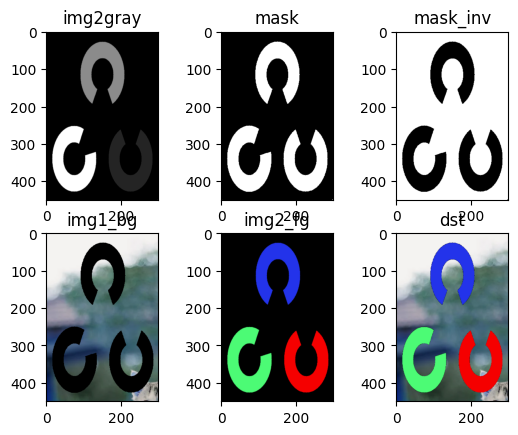

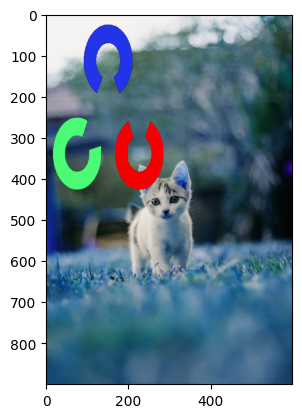

In [21]:
# Load two images
img1 = cv.imread('images/cat.webp')
assert img1 is not None, "Could not read the image."

img2 = cv.imread('images/opencv_logo.png')
assert img2 is not None, "Could not read the image."
# make the size of the logo half of the cat
img2 = cv.resize(img2, (int(img1.shape[1]/2), int(img1.shape[0]/2)))

# I want to put logo on top-left corner, So I create a ROI
rows, cols, channels = img2.shape
roi = img1[0:rows, 0:cols]

# Now create a mask of logo and create its inverse mask also
img2gray = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)
ret, mask = cv.threshold(img2gray, 10, 255, cv.THRESH_BINARY)
mask_inv = cv.bitwise_not(mask)

# Now black-out the area of logo in ROI
img1_bg = cv.bitwise_and(roi, roi, mask=mask_inv)

# Take only region of logo from logo image.
img2_fg = cv.bitwise_and(img2, img2, mask=mask)

# Put logo in ROI and modify the main image
dst = cv.add(img1_bg, img2_fg)
img1[0:rows, 0:cols] = dst

## show the images img2gray, mask, mask_inv, img1_bg, img2_fg, dst
plt.subplot(231), plt.imshow(img2gray, 'gray'), plt.title('img2gray')
plt.subplot(232), plt.imshow(mask, 'gray'), plt.title('mask')
plt.subplot(233), plt.imshow(mask_inv, 'gray'), plt.title('mask_inv')
plt.subplot(234), plt.imshow(img1_bg, 'gray'), plt.title('img1_bg')
plt.subplot(235), plt.imshow(img2_fg, 'gray'), plt.title('img2_fg')
plt.subplot(236), plt.imshow(dst, 'gray'), plt.title('dst')
plt.show()
plt.imshow(img1)



### slide show
Creating a slideshow from images is as follows:

In [27]:
# Slide show of images in a folder with smooth transition between images using addWeighted method
import cv2 as cv
import numpy as np
import os
import time

# get the images in the folder
images = [img for img in os.listdir("images") if img.endswith(".png")]
# sort the images
images.sort()

# create a window
cv.namedWindow('image')

# create a black image
image = np.zeros((200, 200, 3), np.uint8)
# loop over the images
for img in images:
    # read the image
    image = cv.imread('images/' + img)
    # rezie the image
    image = cv.resize(image, (200, 200))
    # display the image gradually
    for alpha in np.arange(0, 1, 0.01):
        beta = 1 - alpha
        dst = cv.addWeighted(image, alpha, image, beta, 0.0)
        cv.imshow('image', dst)
        cv.waitKey(1)
        time.sleep(0.01)
    # destroy all windows
    cv.destroyAllWindows()

# destroy all windows
cv.destroyAllWindows()


KeyboardInterrupt: 

: 

## Performance Measurement and Improvement Techniques

### Goal
Learn to measure the performance of your code.

### Measuring Performance with OpenCV
cv2.getTickCount function returns the number of clock-cycles after a reference event (like the moment machine was switched ON) to the moment this function is called. So if you call it before and after the function execution, you get number of clock-cycles used to execute a function.

cv2.getTickFrequency function returns the frequency of clock-cycles, or the number of clock-cycles per second. So to find the time of execution in seconds, you can do following:

In [3]:
import cv2 as cv

e1 = cv.getTickCount()
# your code execution
e2 = cv.getTickCount()
time = (e2 - e1)/cv.getTickFrequency()
time

1.8458e-05

We will see an example for that below:

In [4]:
img1 = cv.imread('images/cat.webp')
assert img1 is not None, "Could not read the image."

e1 = cv.getTickCount()
for i in range(5, 49, 2):
    img1 = cv.medianBlur(img1, i)
e2 = cv.getTickCount()
time = (e2 - e1)/cv.getTickFrequency()
print(time)


0.769393041


#### Note
You can do the same with time module. Instead of cv2.getTickCount, use time.time() function. Then take the difference of two times.

### Default Optimization in OpenCV
Many of the OpenCV functions are optimized using SSE2, AVX etc. It contains unoptimized code also. So if our system support these features, we should exploit them (almost all modern day processors support them). It is enabled by default while compiling. So OpenCV runs the optimized code if it is enabled, else it runs the unoptimized code. You can use cv2.useOptimized() to check if it is enabled/disabled and cv2.setUseOptimized() to enable/disable it. Let’s see a simple example.

In [5]:
# check if optimization is enabled
cv.useOptimized()

True

In [6]:
%timeit res = cv.medianBlur(img1, 49)

28.3 ms ± 104 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [7]:
# Disable it
cv.setUseOptimized(False)
cv.useOptimized()

False

In [8]:
%timeit res = cv.medianBlur(img1, 49)

28.2 ms ± 92.1 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


We can see in our case, optmized mean filtering is no different from unoptimized version. It's porbably because my CPU is a new arm64 CPU, and the optimized version is not available yet. It should be different on a x86 CPU.

### Measuring Performance in IPython
Sometimes you may need to compare the performance of two similar operations. IPython gives you a magic command timeit to perform this. It runs the code several times to get more accurate results. Once again, they are suitable to measure single line codes.

For example, to compare the performance of cv2.countNonZero and np.count_nonzero() functions, IPython gives following result.


In [13]:
import cv2 as cv
import numpy as np
x = 5
%timeit y = x**2

30.1 ns ± 0.132 ns per loop (mean ± std. dev. of 7 runs, 10,000,000 loops each)


In [14]:
%timeit y = x*x

20.7 ns ± 0.157 ns per loop (mean ± std. dev. of 7 runs, 10,000,000 loops each)


In [16]:
z = np.uint8([5])
%timeit y = z*z

385 ns ± 1.36 ns per loop (mean ± std. dev. of 7 runs, 1,000,000 loops each)


In [17]:
%timeit y = np.square(z)

367 ns ± 1.57 ns per loop (mean ± std. dev. of 7 runs, 1,000,000 loops each)


You can see the speed of diffrent operations, x = 5 ; x*x is fastest and around 20 times faster compared to numpy.

#### Note
Python scalar operations are faster than Numpy scalar operations. So for operations including one or two elements, Python scalar is better than Numpy arrays. Numpy takes advantage when size of array is a little bit bigger.

we will see one more example:

In [22]:
img = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
%timeit z = cv.countNonZero(img)

36.5 µs ± 233 ns per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [23]:
%timeit z = np.count_nonzero(img)

18.4 µs ± 50.8 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)


In this, numpy is faster than cv2 function.

#### Note
Normally, OpenCV functions are faster than Numpy functions. So for same operation, OpenCV functions are preferred. But, there can be exceptions, especially when Numpy works with views instead of copies.

### More IPython magic commands
There are several other magic commands to measure performance with more accuracy. But since they are not much used, I am not going to explain them here. You can see Python documentation if you want to explore more about them.

### Performance Optimization Techniques
Now we will see some tips to improve the performance of our code.

- Avoid using loops in Python as far as possible, especially double/triple loops etc. They are inherently slow.

- Vectorize the algorithm/code to the maximum possible extent because Numpy and OpenCV are optimized for vector operations.

- Exploit the cache coherence.

- Never make copies of array unless it is needed. Try to use views instead. Array copying is a costly operation.

## Changing Colorspaces

### Goal
Learn to change images between different color spaces. Plus learn to track different colored objects, like we find a red ball in an image.

### Changing Color-space
There are more than 150 color-space conversion methods available in OpenCV. But we will look into only two which are most widely used ones, BGR $\leftrightarrow$ Gray and BGR $\leftrightarrow$ HSV.

For color conversion, we use the function cv2.cvtColor(input_image, flag) where flag determines the type of conversion.

For BGR $\leftrightarrow$ Gray conversion we use the flags cv2.COLOR_BGR2GRAY and cv2.COLOR_GRAY2BGR

For BGR $\leftrightarrow$ HSV conversion we use the flags cv2.COLOR_BGR2HSV and cv2.COLOR_HSV2BGR

To get other flags, just run following commands in your Python terminal :

In [24]:
import cv2 as cv
flags = [i for i in dir(cv) if i.startswith('COLOR_')]
print(flags)

['COLOR_BAYER_BG2BGR', 'COLOR_BAYER_BG2BGRA', 'COLOR_BAYER_BG2BGR_EA', 'COLOR_BAYER_BG2BGR_VNG', 'COLOR_BAYER_BG2GRAY', 'COLOR_BAYER_BG2RGB', 'COLOR_BAYER_BG2RGBA', 'COLOR_BAYER_BG2RGB_EA', 'COLOR_BAYER_BG2RGB_VNG', 'COLOR_BAYER_BGGR2BGR', 'COLOR_BAYER_BGGR2BGRA', 'COLOR_BAYER_BGGR2BGR_EA', 'COLOR_BAYER_BGGR2BGR_VNG', 'COLOR_BAYER_BGGR2GRAY', 'COLOR_BAYER_BGGR2RGB', 'COLOR_BAYER_BGGR2RGBA', 'COLOR_BAYER_BGGR2RGB_EA', 'COLOR_BAYER_BGGR2RGB_VNG', 'COLOR_BAYER_GB2BGR', 'COLOR_BAYER_GB2BGRA', 'COLOR_BAYER_GB2BGR_EA', 'COLOR_BAYER_GB2BGR_VNG', 'COLOR_BAYER_GB2GRAY', 'COLOR_BAYER_GB2RGB', 'COLOR_BAYER_GB2RGBA', 'COLOR_BAYER_GB2RGB_EA', 'COLOR_BAYER_GB2RGB_VNG', 'COLOR_BAYER_GBRG2BGR', 'COLOR_BAYER_GBRG2BGRA', 'COLOR_BAYER_GBRG2BGR_EA', 'COLOR_BAYER_GBRG2BGR_VNG', 'COLOR_BAYER_GBRG2GRAY', 'COLOR_BAYER_GBRG2RGB', 'COLOR_BAYER_GBRG2RGBA', 'COLOR_BAYER_GBRG2RGB_EA', 'COLOR_BAYER_GBRG2RGB_VNG', 'COLOR_BAYER_GR2BGR', 'COLOR_BAYER_GR2BGRA', 'COLOR_BAYER_GR2BGR_EA', 'COLOR_BAYER_GR2BGR_VNG', 'COLOR_

#### Note
For HSV, Hue range is [0,179], Saturation range is [0,255] and Value range is [0,255]. Different softwares use different scales. So if you are comparing OpenCV values with them, you need to normalize these ranges.

### Object Tracking
Now we know how to convert BGR image to HSV, we can use this to extract a colored object. In HSV, it is more easier to represent a color than RGB color-space. In our application, we will try to extract an object. So here is the method:

    Take each frame of the video
    Convert from BGR to HSV color-space
    We threshold the HSV image for a range of BGR values we want to detect
    Now extract the the object alone, we can do whatever on that image we want.

Below is the code which are commented in detail :

In [25]:
import cv2 as cv
import numpy as np

cap = cv.VideoCapture(0)

while(1):
    # Take each frame
    _, frame = cap.read()
    # Convert BGR to HSV
    hsv = cv.cvtColor(frame, cv.COLOR_BGR2HSV)
    # define range of blue color in HSV
    lower_blue = np.array([110, 50, 50])
    upper_blue = np.array([130, 255, 255])
    # define range of green color in HSV
    lower_green = np.array([50, 50, 50])
    upper_green = np.array([70, 255, 255])
    # define range of red color in HSV
    lower_red = np.array([0, 50, 50])
    upper_red = np.array([10, 255, 255])
    # Threshold the HSV image to get only blue colors
    mask_blue = cv.inRange(hsv, lower_blue, upper_blue)
    # Threshold the HSV image to get only green colors
    mask_green = cv.inRange(hsv, lower_green, upper_green)
    # Threshold the HSV image to get only red colors
    mask_red = cv.inRange(hsv, lower_red, upper_red)
    # Bitwise-AND mask and original image
    res_blue = cv.bitwise_and(frame, frame, mask=mask_blue)
    res_green = cv.bitwise_and(frame, frame, mask=mask_green)
    res_red = cv.bitwise_and(frame, frame, mask=mask_red)
    # show the images
    cv.imshow('frame', frame)
    cv.imshow('mask_blue', mask_blue)
    cv.imshow('res_blue', res_blue)
    cv.imshow('mask_green', mask_green)
    cv.imshow('res_green', res_green)
    cv.imshow('mask_red', mask_red)
    cv.imshow('res_red', res_red)
    # wait for a key 27 is the ESC key
    k = cv.waitKey(5) & 0xFF
    if k == 27:
        break
# destroy all windows
cv.destroyAllWindows()

2023-09-25 20:34:16.805 Python[18388:1164248] WARNING: Secure coding is not enabled for restorable state! Enable secure coding by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState: and returning YES.


#### Note
There are some noises in the image. We have to remove them. We can do it using morphological operations. Erosion and dilation. We have already seen them in previous chapters.

### How to find HSV values to track?
This is a common question found in stackoverflow.com. It is very simple and you can use the same function, cv2.cvtColor(). Instead of passing an image, you just pass the BGR values you want. For example, to find the HSV value of Green, try following commands in Python terminal:

In [26]:
green = np.uint8([[[0, 255, 0]]])
hsv_green = cv.cvtColor(green, cv.COLOR_BGR2HSV)
print(hsv_green)

[[[ 60 255 255]]]


: 

Now you take [H-10, 100,100] and [H+10, 255, 255] as lower bound and upper bound respectively. Apart from this method, you can use any image editing tools like GIMP or any online converters to find these values, but don’t forget to adjust the HSV ranges.

## Geometric Transformations of Images

### Goal
Learn to apply different geometric transformation to images like translation, rotation, affine transformation etc.

### Transformations

OpenCV provides two transformation functions, cv2.warpAffine and cv2.warpPerspective, with which you can have all kinds of transformations. cv2.warpAffine takes a 2x3 transformation matrix while cv2.warpPerspective takes a 3x3 transformation matrix as input.

#### Scaling
Scaling is just resizing of the image. OpenCV comes with a function cv2.resize() for this purpose. The size of the image can be specified manually, or you can specify the scaling factor. Different interpolation methods are used. Preferable interpolation methods are cv2.INTER_AREA for shrinking and cv2.INTER_CUBIC (slow) & cv2.INTER_LINEAR for zooming. By default, interpolation method used is cv2.INTER_LINEAR for all resizing purposes. You can resize an input image either of following methods:


(<Axes: title={'center': '(2*width, 2*height)'}>,
 Text(0.5, 1.0, '(2*width, 2*height)'))

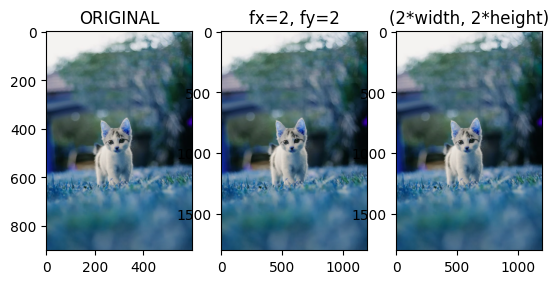

In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/cat.webp')
assert img is not None, "Could not read the image."

res1 = cv.resize(img, None, fx=2, fy=2, interpolation=cv.INTER_CUBIC)
# OR
height, width = img.shape[:2]
res2 = cv.resize(img, (2*width, 2*height), interpolation=cv.INTER_CUBIC)

plt.subplot(131), plt.imshow(img), plt.title('ORIGINAL')
plt.subplot(132), plt.imshow(res1), plt.title('fx=2, fy=2')
plt.subplot(133), plt.imshow(res2), plt.title('(2*width, 2*height)')

#### Translation
Translation is the shifting of object’s location. If you know the shift in (x,y) direction, let it be (t_x,t_y), you can create the transformation matrix M as follows:

$$
M = \begin{bmatrix} 1 & 0 & t_x \\ 0 & 1 & t_y \end{bmatrix}
$$

You can take make it into a Numpy array of type np.float32 and pass it into cv2.warpAffine() function. See below example for a shift of (100,50):

(<Axes: title={'center': 'TRANSLATION'}>,
 Text(0.5, 1.0, 'TRANSLATION'))

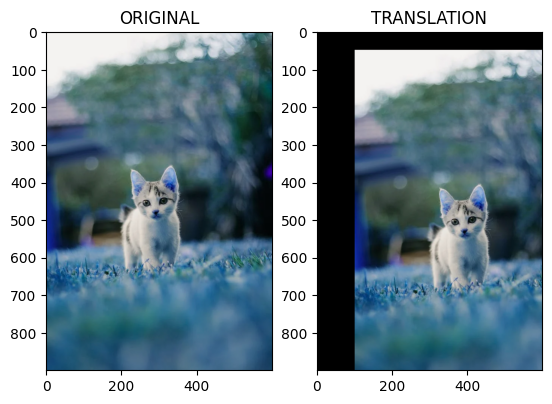

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

img = cv.imread('images/cat.webp')
assert img is not None, "Could not read the image."
rows, cols, ch = img.shape

M = np.float32([[1, 0, 100], [0, 1, 50]])
dst = cv.warpAffine(img, M, (cols, rows))

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.subplot(122), plt.imshow(dst), plt.title('TRANSLATION')

##### Warning
Third argument of the cv2.warpAffine() function is the size of the output image, which should be in the form of **(width, height)**. Remember width = number of columns, and height = number of rows.

#### Rotation
Rotation of an image for an angle $\theta$ is achieved by the transformation matrix of the form

$$
M = \begin{bmatrix} cos\theta & -sin\theta \\ sin\theta & cos\theta \end{bmatrix}
$$

But OpenCV provides scaled rotation with adjustable center of rotation so that you can rotate at any location you prefer. Modified transformation matrix is given by

$$
\begin{bmatrix} \alpha & \beta & (1- \alpha ) \cdot center.x - \beta \cdot center.y \\ -\beta & \alpha & \beta \cdot center.x + (1 - \alpha ) \cdot center.y \end{bmatrix}
$$

where

$$
\begin{array}{l} \alpha = scale \cdot \cos \theta , \\ \beta = scale \cdot \sin \theta \end{array}
$$

To find this transformation matrix, OpenCV provides a function, cv2.getRotationMatrix2D. Check below example which rotates the image by 90 degree with respect to center without any scaling.

(<Axes: title={'center': 'ROTATION'}>,
 Text(0.5, 1.0, 'ROTATION'))

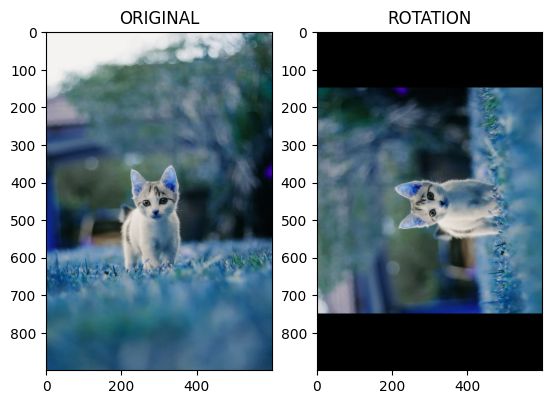

In [2]:
img = cv.imread('images/cat.webp')
assert img is not None, "Could not read the image."

rows, cols, ch = img.shape

# cols-1 and rows-1 are the coordinate limits.
M = cv.getRotationMatrix2D(((cols-1)/2.0, (rows-1)/2.0), 90, 1)
dst = cv.warpAffine(img, M, (cols, rows))

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.subplot(122), plt.imshow(dst), plt.title('ROTATION')


#### Affine Transformation
In affine transformation, all parallel lines in the original image will still be parallel in the output image. To find the transformation matrix, we need three points from input image and their corresponding locations in output image. Then cv2.getAffineTransform will create a 2x3 matrix which is to be passed to cv2.warpAffine.

Check below example, and also look at the points I selected (which are marked in Green color):

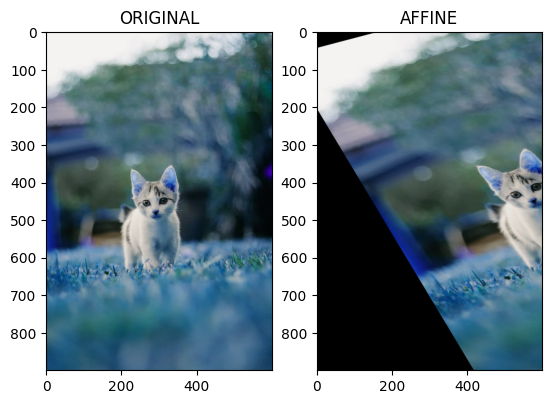

In [3]:
img = cv.imread('images/cat.webp')
assert img is not None, "Could not read the image."
rows, cols, ch = img.shape

pts1 = np.float32([[50, 50], [200, 50], [50, 200]])
pts2 = np.float32([[10, 100], [200, 50], [100, 250]])

M = cv.getAffineTransform(pts1, pts2)

dst = cv.warpAffine(img, M, (cols, rows))

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.subplot(122), plt.imshow(dst), plt.title('AFFINE')
plt.show()

#### Perspective Transformation
For perspective transformation, you need a 3x3 transformation matrix. Straight lines will remain straight even after the transformation. To find this transformation matrix, you need 4 points on the input image and corresponding points on the output image. Among these 4 points, 3 of them should not be collinear. Then transformation matrix can be found by the function cv2.getPerspectiveTransform. Then apply cv2.warpPerspective with this 3x3 transformation matrix.

See the code below:

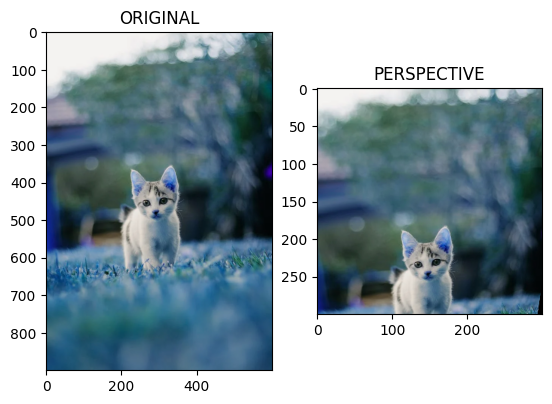

In [4]:
img = cv.imread('images/cat.webp')
assert img is not None, "Could not read the image."
rows, cols, ch = img.shape

pts1 = np.float32([[56, 65], [368, 52], [28, 387], [389, 390]])
pts2 = np.float32([[0, 0], [200, 0], [0, 200], [200, 200]])

M = cv.getPerspectiveTransform(pts1, pts2)

dst = cv.warpPerspective(img, M, (300, 300))

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.subplot(122), plt.imshow(dst), plt.title('PERSPECTIVE')
plt.show()


## Image Thresholding

### Goal
In this chapter,

    We will learn about Simple thresholding, Adaptive thresholding, Otsu’s thresholding etc.

### Simple Thresholding
Here, the matter is straight forward. If pixel value is greater than a threshold value, it is assigned one value (may be white), else it is assigned another value (may be black). The function used is cv2.threshold. First argument is the source image, which should be a grayscale image. Second argument is the threshold value which is used to classify the pixel values. Third argument is the maxVal which represents the value to be given if pixel value is more than (sometimes less than) the threshold value. OpenCV provides different styles of thresholding and it is decided by the fourth parameter of the function. Different types are:

    cv2.THRESH_BINARY
    cv2.THRESH_BINARY_INV
    cv2.THRESH_TRUNC
    cv2.THRESH_TOZERO
    cv2.THRESH_TOZERO_INV

Documentation clearly explain what each type is meant for. Please check out the documentation.

Two outputs are obtained. First one is a retval which will be explained later. Second output is our thresholded image.


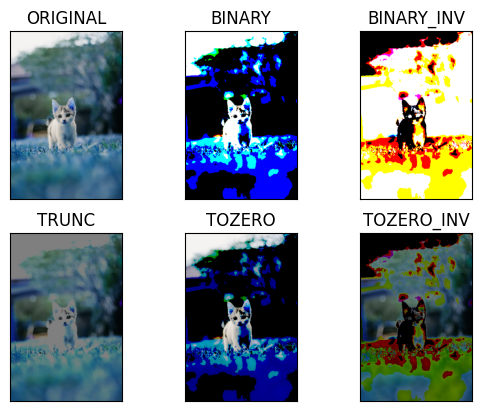

In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/cat.webp')
assert img is not None, "Could not read the image."
retval, threshold1 = cv.threshold(img, 127, 255, cv.THRESH_BINARY)
retval, threshold2 = cv.threshold(img, 127, 255, cv.THRESH_BINARY_INV)
retval, threshold3 = cv.threshold(img, 127, 255, cv.THRESH_TRUNC)
retval, threshold4 = cv.threshold(img, 127, 255, cv.THRESH_TOZERO)
retval, threshold5 = cv.threshold(img, 127, 255, cv.THRESH_TOZERO_INV)

titles = ['ORIGINAL', 'BINARY', 'BINARY_INV', 'TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, threshold1, threshold2, threshold3, threshold4, threshold5]

for i in range(6):
    plt.subplot(2, 3, i+1), plt.imshow(images[i]), plt.title(titles[i])
    plt.xticks([]), plt.yticks([])
plt.show()


### Adaptive Thresholding

In the previous section, we used a global value as threshold value. But it may not be good in all the conditions where image has different lighting conditions in different areas. In that case, we go for adaptive thresholding. In this, the algorithm calculate the threshold for a small regions of the image. So we get different thresholds for different regions of the same image and it gives us better results for images with varying illumination.

It has three ‘special’ input params and only one output argument.

Adaptive Method - It decides how thresholding value is calculated.

    cv2.ADAPTIVE_THRESH_MEAN_C : threshold value is the mean of neighbourhood area.
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C : threshold value is the weighted sum of neighbourhood values where weights are a gaussian window.

Block Size - It decides the size of neighbourhood area.

C - It is just a constant which is subtracted from the mean or weighted mean calculated.

Below piece of code compares global thresholding and adaptive thresholding for an image with varying illumination:

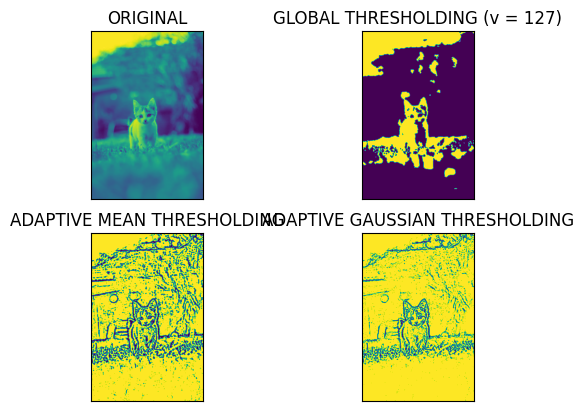

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/cat.webp', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."
img = cv.medianBlur(img, 5)

ret, th1 = cv.threshold(img, 127, 255, cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(img, 255, cv.ADAPTIVE_THRESH_MEAN_C,
                           cv.THRESH_BINARY, 11, 2)
th3 = cv.adaptiveThreshold(img, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C,
                            cv.THRESH_BINARY, 11, 2)

titles = ['ORIGINAL', 'GLOBAL THRESHOLDING (v = 127)', 'ADAPTIVE MEAN THRESHOLDING', 'ADAPTIVE GAUSSIAN THRESHOLDING']
images = [img, th1, th2, th3]

for i in range(4):
    plt.subplot(2, 2, i+1), plt.imshow(images[i]), plt.title(titles[i])
    plt.xticks([]), plt.yticks([])
plt.show()


### Otsu’s Binarization
In the first section, I told you there is a second parameter retVal. Its use comes when we go for Otsu’s Binarization. So what is it?

In global thresholding, we used an arbitrary chosen value as a threshold. In contrast, Otsu’s method avoids having to choose a value and determines it automatically. Sounds great! So how do we do it? The answer is simple, Otsu’s method assumes there are two peaks in the grayscale histogram of the image and then tries to find an optimal value to separate these two peaks to find T (threshold value). If our image has only one peak or if the two peaks are not well separated then this method fails.

For this, our cv2.threshold() function is used, but pass an extra flag, cv2.THRESH_OTSU. For threshold value, simply pass zero. Then the algorithm finds the optimal threshold value and returns you as the second output, retVal. If Otsu thresholding is not used, retVal is same as the threshold value you used.

Check out below example. Input image is a noisy image. In first case, I applied global thresholding for a value of 127. In second case, I applied Otsu’s thresholding directly. In third case, I filtered image with a 5x5 gaussian kernel to remove the noise, then applied Otsu thresholding. See how noise filtering improves the result.

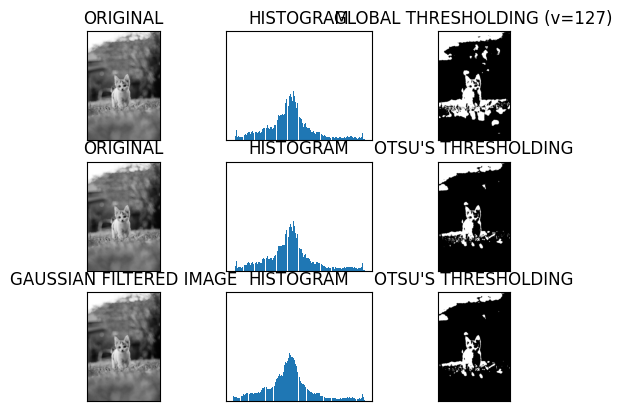

In [7]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/cat.webp', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."

# global thresholding
ret1, th1 = cv.threshold(img, 127, 255, cv.THRESH_BINARY)

# Otsu's thresholding
ret2, th2 = cv.threshold(img, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)

# Otsu's thresholding after Gaussian filtering
blur = cv.GaussianBlur(img, (5, 5), 0)
ret3, th3 = cv.threshold(blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)

# plot all the images and their histograms
images = [img, 0, th1, img, 0, th2, blur, 0, th3]
titles = ['ORIGINAL', 'HISTOGRAM', 'GLOBAL THRESHOLDING (v=127)',
          'ORIGINAL', 'HISTOGRAM', "OTSU'S THRESHOLDING",
          'GAUSSIAN FILTERED IMAGE', 'HISTOGRAM', "OTSU'S THRESHOLDING"]

for i in range(3):
    plt.subplot(3, 3, i*3+1), plt.imshow(images[i*3], 'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3, 3, i*3+2), plt.hist(images[i*3].ravel(), 256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3, 3, i*3+3), plt.imshow(images[i*3+2], 'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

### How Otsu’s Binarization Works?

Here we will see how to implement Otsu’s binarization using Python. Below piece of code shows how to find the threshold value using Otsu’s algorithm. But actually how did we find it?

Since we are working with bimodal images, Otsu’s algorithm tries to find a threshold value (t) which minimizes the weighted within-class variance given by the relation :

$$
\sigma_w^2(t) = q_1(t)\sigma_1^2(t) + q_2(t)\sigma_2^2(t)
$$

where $q_1$ and $q_2$ are the probabilities of each class separated by t, and $\sigma_1^2$ and $\sigma_2^2$ are variances of each class.

The algorithm gives us t value. But in some cases, you may need to do some operations on thresholded image depending on the application. In that case, Otsu’s value may not be a good threshold value. So we will use Otsu’s thresholding directly on the grayscale image.

In [8]:
img = cv.imread('images/cat.webp', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."
blur = cv.GaussianBlur(img, (5, 5), 0)

# find normalized_histogram, and its cumulative distribution function
hist = cv.calcHist([blur], [0], None, [256], [0, 256])
hist_norm = hist.ravel()/hist.max()
Q = hist_norm.cumsum()

bins = np.arange(256)

fn_min = np.inf
thresh = -1

for i in range(1, 256):
    p1, p2 = np.hsplit(hist_norm, [i]) # probabilities
    q1, q2 = Q[i], Q[255]-Q[i] # cum sum of classes
    b1, b2 = np.hsplit(bins, [i]) # weights

    # finding means and variances
    m1, m2 = np.sum(p1*b1)/q1, np.sum(p2*b2)/q2
    v1, v2 = np.sum(((b1-m1)**2)*p1)/q1, np.sum(((b2-m2)**2)*p2)/q2

    # calculates the minimization function
    fn = v1*q1 + v2*q2
    if fn < fn_min:
        fn_min = fn
        thresh = i

# find otsu's threshold value with OpenCV function
ret, otsu = cv.threshold(blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
print("{} {}".format(thresh, ret))

147 146.0


/var/folders/2x/b5gtx1gx5rb7q6n60wjbv_s00000gn/T/ipykernel_21198/1350846032.py:21: RuntimeWarning: invalid value encountered in scalar divide
  m1, m2 = np.sum(p1*b1)/q1, np.sum(p2*b2)/q2
/var/folders/2x/b5gtx1gx5rb7q6n60wjbv_s00000gn/T/ipykernel_21198/1350846032.py:21: RuntimeWarning: divide by zero encountered in scalar divide
  m1, m2 = np.sum(p1*b1)/q1, np.sum(p2*b2)/q2
/var/folders/2x/b5gtx1gx5rb7q6n60wjbv_s00000gn/T/ipykernel_21198/1350846032.py:22: RuntimeWarning: invalid value encountered in multiply
  v1, v2 = np.sum(((b1-m1)**2)*p1)/q1, np.sum(((b2-m2)**2)*p2)/q2


## Smoothing Images

### Goal
In this chapter,

    We will see different functions like : cv2.blur(), cv2.blur() , cv2.GaussianBlur() , cv2.medianBlur() etc.

### 2D Convolution ( Image Filtering )

As for one-dimensional signals, images also can be filtered with various low-pass filters(LPF), high-pass filters(HPF) etc. LPF helps in removing noises, blurring the images etc. HPF filters helps in finding edges in the images.

OpenCV provides a function cv2.filter2D() to convolve a kernel with an image. As an example, we will try an averaging filter on an image. A 5x5 averaging filter kernel can be defined as follows:

$$
K = \frac{1}{25} \begin{bmatrix}
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1
\end{bmatrix}
$$

Filtering with the above kernel results in the following being performed: for each pixel, a 5x5 window is centered on this pixel, all pixels falling within this window are summed up, and the result is then divided by 25. This equates to computing the average of the pixel values inside that window. This operation is performed for all the pixels in the image to produce the output filtered image. Try this code and check the result:


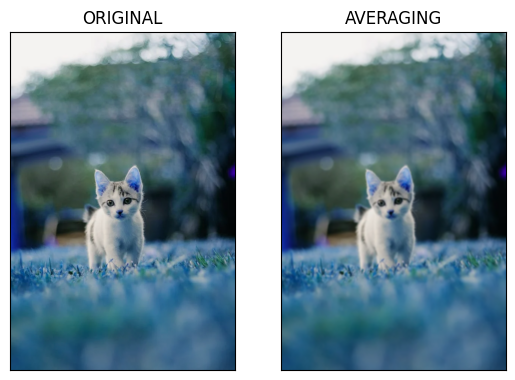

In [11]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/cat.webp')
assert img is not None, "Could not read the image."

# convoluve kernel
kernel = np.ones((5, 5), np.float32)/25
dst = cv.filter2D(img, -1, kernel)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(dst), plt.title('AVERAGING')
plt.xticks([]), plt.yticks([])
plt.show()


### Image Blurring (Image Smoothing)
Image blurring is achieved by convolving the image with a low-pass filter kernel. It is useful for removing noises. It actually removes high frequency content (eg: noise, edges) from the image resulting in edges being blurred when this is filter is applied. (Well, there are blurring techniques which do not blur edges). OpenCV provides mainly four types of blurring techniques.

#### 1. Averaging
This is done by convolving image with a normalized box filter. It simply takes the average of all the pixels under kernel area and replaces the central element. This is done by the function cv2.blur() or cv2.boxFilter(). Check the docs for more details about the kernel. We should specify the width and height of kernel. A 3x3 normalized box filter would look like this:

$$
K = \frac{1}{9} \begin{bmatrix}
1 & 1 & 1 \\
1 & 1 & 1 \\
1 & 1 & 1
\end{bmatrix}
$$

##### Note
If you don’t want to use a normalized box filter, use cv2.boxFilter() and pass the argument normalize=False to the function.

check the example below:


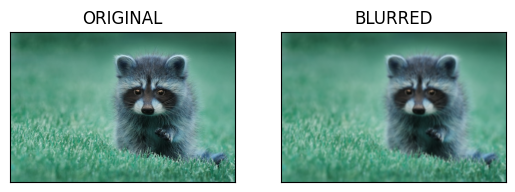

In [20]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."

blur = cv.blur(img, (5, 5))

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur), plt.title('BLURRED')
plt.xticks([]), plt.yticks([])
plt.show()


#### 2. Gaussian Filtering

In this approach, instead of a box filter consisting of equal filter coefficients, a Gaussian kernel is used. It is done with the function, cv2.GaussianBlur(). We should specify the width and height of kernel which should be positive and odd. We also should specify the standard deviation in X and Y direction, sigmaX and sigmaY respectively. If only sigmaX is specified, sigmaY is taken as same as sigmaX. If both are given as zeros, they are calculated from kernel size. Gaussian filtering is highly effective in removing Gaussian noise from the image.

If you want, you can create a Gaussian kernel with the function, cv2.getGaussianKernel().

The above code can be modified for Gaussian blurring:

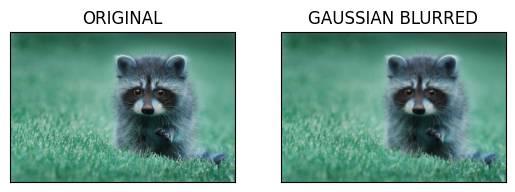

In [21]:
blur = cv.GaussianBlur(img, (5, 5), 0)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur), plt.title('GAUSSIAN BLURRED')
plt.xticks([]), plt.yticks([])
plt.show()

#### 3. Median Blurring

Here, the function cv2.medianBlur() takes median of all the pixels under kernel area and central element is replaced with this median value. This is highly effective against salt-and-pepper noise in the images. Interesting thing is that, in the above filters, central element is a newly calculated value which may be a pixel value in the image or a new value. But in median blurring, central element is always replaced by some pixel value in the image. It reduces the noise effectively. Its kernel size should be a positive odd integer.

In this demo, I added a 50% noise to our original image and applied median blurring. Check the result:

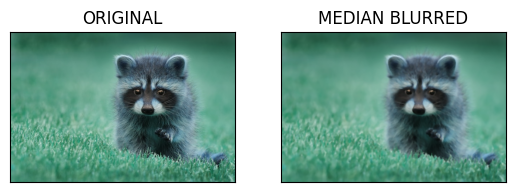

In [22]:
median = cv.medianBlur(img, 5)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(median), plt.title('MEDIAN BLURRED')
plt.xticks([]), plt.yticks([])
plt.show()


#### 4. Bilateral Filtering

cv2.bilateralFilter() is highly effective in noise removal while keeping edges sharp. But the operation is slower compared to other filters. We already saw that gaussian filter takes the a neighbourhood around the pixel and find its gaussian weighted average. This gaussian filter is a function of space alone, that is, nearby pixels are considered while filtering. It doesn’t consider whether pixels have almost same intensity. It doesn’t consider whether pixel is an edge pixel or not. So it blurs the edges also, which we don’t want to do.

Bilateral filter also takes a gaussian filter in space, but one more gaussian filter which is a function of pixel difference. Gaussian function of space make sure only nearby pixels are considered for blurring while gaussian function of intensity difference make sure only those pixels with similar intensity to central pixel is considered for blurring. So it preserves the edges since pixels at edges will have large intensity variation.

Below example is done for a 5x5 kernel. As you increase the size of kernel, it will remove more noise but at the same time it will remove more details in the image. So small kernels are preferred.

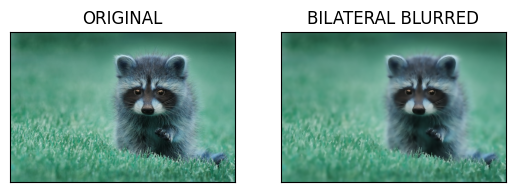

In [23]:
blur = cv.bilateralFilter(img, 9, 75, 75)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur), plt.title('BILATERAL BLURRED')
plt.xticks([]), plt.yticks([])
plt.show()

## Morphological Transformations

### Goal
In this chapter,

    We will learn different morphological operations like Erosion, Dilation, Opening, Closing etc.
    We will see different functions like : cv2.erode(), cv2.dilate(), cv2.morphologyEx() etc.

### Theory

Morphological transformations are some simple operations based on the image shape. It is normally performed on binary images. It needs two inputs, one is our original image, second one is called structuring element or kernel which decides the nature of operation. Two basic morphological operators are Erosion and Dilation. Then its variant forms like Opening, Closing, Gradient etc also comes into play. We will see them one-by-one with help of following image:

#### 1. Erosion

The basic idea of erosion is just like soil erosion only, it erodes away the boundaries of foreground object (Always try to keep foreground in white). So what it does? The kernel slides through the image (as in 2D convolution). A pixel in the original image (either 1 or 0) will be considered 1 only if all the pixels under the kernel is 1, otherwise it is eroded (made to zero).

So what happends is that, all the pixels near boundary will be discarded depending upon the size of kernel. So the thickness or size of the foreground object decreases or simply white region decreases in the image. It is useful for removing small white noises (as we have seen in colorspace chapter), detach two connected objects etc.

Here, as an example, I would use a 5x5 kernel with full of ones. Let’s see it how it works:


(([], []), ([], []))

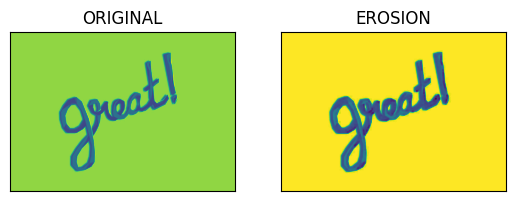

In [27]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/great.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."
kernel = np.ones((5, 5), np.uint8)
erosion = cv.erode(img, kernel, iterations=1)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(erosion), plt.title('EROSION')
plt.xticks([]), plt.yticks([])

#### 2. Dilation

It is just opposite of erosion. Here, a pixel element is ‘1’ if atleast one pixel under the kernel is ‘1’. So it increases the white region in the image or size of foreground object increases. Normally, in cases like noise removal, erosion is followed by dilation. Because, erosion removes white noises, but it also shrinks our object. So we dilate it. Since noise is gone, they won’t come back, but our object area increases. It is also useful in joining broken parts of an object.

(([], []), ([], []))

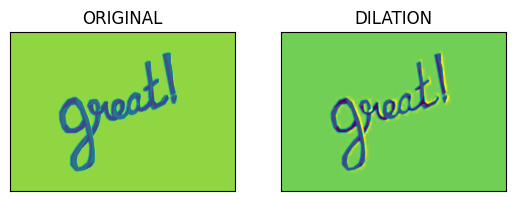

In [28]:
dilation = cv.dilate(img, kernel, iterations=1)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(dilation), plt.title('DILATION')
plt.xticks([]), plt.yticks([])

#### 3. Opening

Opening is just another name of erosion followed by dilation. It is useful in removing noise, as we explained above. Here we use the function, cv2.morphologyEx()

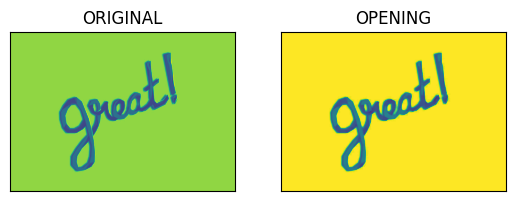

In [30]:
opening = cv.morphologyEx(img, cv.MORPH_OPEN, kernel)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(opening), plt.title('OPENING')
plt.xticks([]), plt.yticks([])
plt.show()


#### 4. Closing

Closing is reverse of Opening, Dilation followed by Erosion. It is useful in closing small holes inside the foreground objects, or small black points on the object.

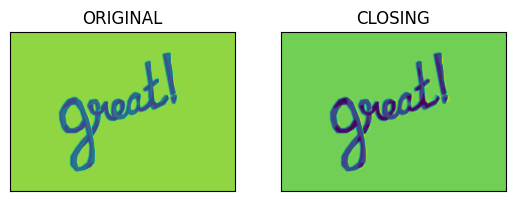

In [31]:
closing = cv.morphologyEx(img, cv.MORPH_CLOSE, kernel)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(closing), plt.title('CLOSING')
plt.xticks([]), plt.yticks([])
plt.show()

#### 5. Morphological Gradient

It is the difference between dilation and erosion of an image.

The result will look like the outline of the object.

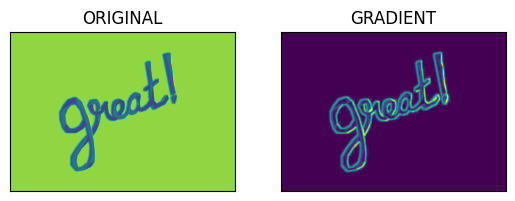

In [32]:
gradient = cv.morphologyEx(img, cv.MORPH_GRADIENT, kernel)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(gradient), plt.title('GRADIENT')
plt.xticks([]), plt.yticks([])
plt.show()

#### 6. Top Hat

It is the difference between input image and Opening of the image. Below example is done for a 9x9 kernel.

(([], []), ([], []))

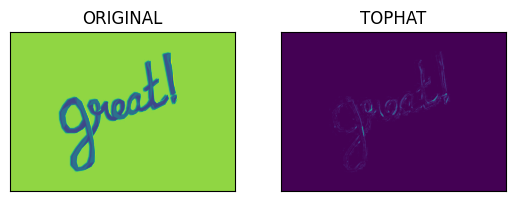

In [33]:
tophat = cv.morphologyEx(img, cv.MORPH_TOPHAT, kernel)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(tophat), plt.title('TOPHAT')
plt.xticks([]), plt.yticks([])

#### 7. Black Hat

It is the difference between the closing of the input image and input image.


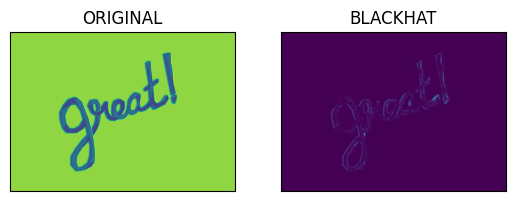

In [34]:
blackhat = cv.morphologyEx(img, cv.MORPH_BLACKHAT, kernel)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blackhat), plt.title('BLACKHAT')
plt.xticks([]), plt.yticks([])
plt.show()

### Structuring Element

We manually created a structuring elements in the previous examples with help of Numpy. It is rectangular shape. But in some cases, you may need elliptical/circular shaped kernels. So for this purpose, OpenCV has a function, cv2.getStructuringElement(). You just pass the shape and size of the kernel, you get the desired kernel.

In [36]:
# recangular kernel
kernel = cv.getStructuringElement(cv.MORPH_RECT, (5, 5))
print(kernel)

# elliptical kernel
kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (5, 5))
print(kernel)

# cross-shaped kernel
kernel = cv.getStructuringElement(cv.MORPH_CROSS, (5, 5))
print(kernel)

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]
[[0 0 1 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [0 0 1 0 0]]
[[0 0 1 0 0]
 [0 0 1 0 0]
 [1 1 1 1 1]
 [0 0 1 0 0]
 [0 0 1 0 0]]


## Image Gradients

### Goal
In this chapter,

    We will learn about Gradient-Based Edge Detection.
    We will see following functions : cv2.Sobel(), cv2.Scharr(), cv2.Laplacian() etc.

### Theory

OpenCV provides three types of gradient filters or High-pass filters, Sobel, Scharr and Laplacian. We will see each one of them.

#### 1. Sobel and Scharr Derivatives

Sobel operators is a joint Gausssian smoothing plus differentiation operation, so it is more resistant to noise. You can specify the direction of derivatives to be taken, vertical or horizontal (by the arguments, yorder and xorder respectively). You can also specify the size of kernel by the argument ksize. If ksize = -1, a 3x3 Scharr filter is used which gives better results than 3x3 Sobel filter. Please see the docs for kernels used.

#### 2. Laplacian Derivatives

It calculates the Laplacian of the image given by the relation, $\Delta src = \frac{\partial ^2 src}{\partial x^2} + \frac{\partial ^2 src}{\partial y^2}$. Where each derivative is found using Sobel derivatives. If ksize = 1, then following kernel is used for filtering:

$$
K = \begin{bmatrix}
0 & 1 & 0 \\
1 & -4 & 1 \\
0 & 1 & 0
\end{bmatrix}
$$

##### Code Demo



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


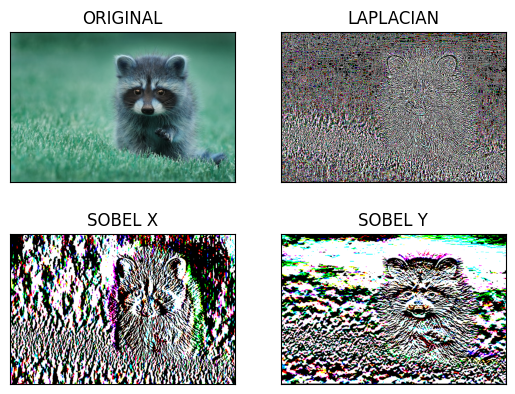

In [42]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."

laplacian = cv.Laplacian(img, cv.CV_64F)
sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=5)
sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=5)

plt.subplot(221), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(laplacian), plt.title('LAPLACIAN')
plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(sobelx), plt.title('SOBEL X')
plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(sobely), plt.title('SOBEL Y')
plt.xticks([]), plt.yticks([])
plt.show()

##### One Important Matter!

In our last example, output datatype is cv2.CV_8U or np.uint8. But there is a slight problem with that. Black-to-White transition is taken as Positive slope (it has a positive value) while White-to-Black transition is taken as a Negative slope (It has negative value). So when you convert data to np.uint8, all negative slopes are made zero. In simple words, you miss that edge.

If you want to detect both edges, better option is to keep the output datatype to some higher forms, like cv2.CV_16S, cv2.CV_64F etc, take its absolute value and then convert back to cv2.CV_8U. Below code demonstrates this procedure for a horizontal Sobel filter and difference in results.

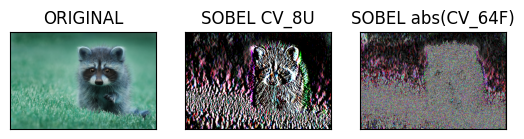

In [43]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."

# output dtype = cv.CV_8U
sobelx8u = cv.Sobel(img, cv.CV_8U, 1, 0, ksize=5)

# output dtype = cv.CV_64F. Then take its absolute and convert to cv.CV_8U
sobelx64f = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=5)
abs_sobel64f = np.absolute(sobelx64f)
sobel_8u = np.uint8(abs_sobel64f)

plt.subplot(131), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(sobelx8u), plt.title('SOBEL CV_8U')
plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(sobel_8u), plt.title('SOBEL abs(CV_64F)')
plt.xticks([]), plt.yticks([])
plt.show()


## Canny Edge Detection

### Goal
In this chapter,

    We will learn about the concepts behind Canny Edge Detection algorithm
    We will see how to use it to detect edges in an image

### Theory

Canny Edge Detection is a popular edge detection algorithm. It was developed by John F. Canny in 1986. It is a multi-stage algorithm and we will go through each stages.

#### 1. Noise Reduction

Since edge detection is susceptible to noise in the image, first step is to remove the noise in the image with a 5x5 Gaussian filter. We have already seen this in previous chapters.

#### 2. Finding Intensity Gradient of the Image

Smoothened image is then filtered with a Sobel kernel in both horizontal and vertical direction to get first derivative in horizontal direction ($G_x$) and vertical direction ($G_y$). From these two images, we can find edge gradient and direction for each pixel as follows:

$$
Edge\;Gradient\; (G) = \sqrt{G_x^2 + G_y^2} \\
Angle\;(\theta) = \tan^{-1} \left( \frac{G_y}{G_x} \right)
$$

Gradient direction is always perpendicular to edges. It is rounded to one of four angles representing vertical, horizontal and two diagonal directions.

#### 3. Non-maximum Suppression

After getting gradient magnitude and direction, a full scan of image is done to remove any unwanted pixels which may not constitute the edge. For this, at every pixel, pixel is checked if it is a local maximum in its neighborhood in the direction of gradient. 

Let's take an example. If the gradient angle is 45 degree, we check the point in the positive direction of gradient and negative direction. If it is a local maximum, consider for next stage, otherwise, suppress it (make it 0).

#### 4. Hysteresis Thresholding

This stage decides which are all edges are really edges and which are not. For this, we need two threshold values, minVal and maxVal. Any edges with intensity gradient more than maxVal are sure to be edges and those below minVal are sure to be non-edges, so discarded. Those who lie between these two thresholds are classified edges or non-edges based on their connectivity. If they are connected to “sure-edge” pixels, they are considered to be part of edges. Otherwise, they are also discarded. 

This stage also removes small pixels noises on the assumption that edges are long lines.

so what we finally get is strong edges in the image.

### Canny Edge Detection in OpenCV

OpenCV puts all the above in single function, cv2.Canny(). We will see how to use it. First argument is our input image. Second and third arguments are our minVal and maxVal respectively. Third argument is aperture_size. It is the size of Sobel kernel used for find image gradients. By default it is 3. Last argument is L2gradient which specifies the equation for finding gradient magnitude. If it is True, it uses the equation mentioned above which is more accurate, otherwise it uses this function: $Edge\;Gradient\; (G) = |G_x| + |G_y|$. By default, it is False.

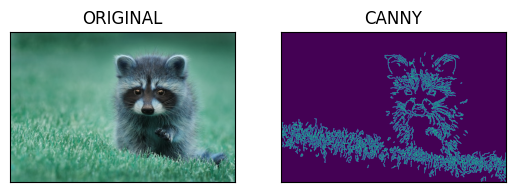

In [44]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."
edges = cv.Canny(img, 100, 200)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(edges), plt.title('CANNY')
plt.xticks([]), plt.yticks([])
plt.show()

## Image Pyramids

### Goal
In this chapter,

    We will learn about Image Pyramids
    We will use Image pyramids to create a new fruit, “Orapple”

### Theory

Normally, we used to work with an image of constant size. But in some occassions, we need to work with images of different resolution of the same image. For example, while searching for something in an image, like face, we are not sure at what size the object will be present in the image. In that case, we will need to create a set of images with different resolution and search for object in all the images. These set of images with different resolution are called Image Pyramids (because when they are kept in a stack with biggest image at bottom and smallest image at top look like a pyramid).

There are two kinds of Image Pyramids. 1) Gaussian Pyramid and 2) Laplacian Pyramids

Higher level (Low resolution) in a Gaussian Pyramid is formed by removing consecutive rows and columns in Lower level (higher resolution) image. Then each pixel in higher level is formed by the contribution from 5 pixels in underlying level with gaussian weights. By doing so, a MxN image becomes M/2xN/2 image. So area reduces to one-fourth of original area. It is called an Octave. The same pattern continues as we go upper in pyramid (ie, resolution decreases). Similarly while expanding, area becomes 4 times in each level. We can find Gaussian pyramids using cv2.pyrDown() and cv2.pyrUp() functions.


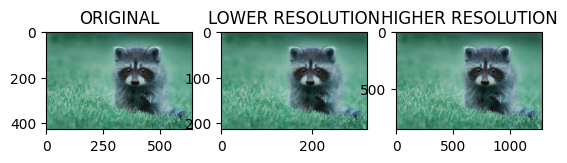

In [46]:
import cv2 as cv
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."
lower_reso = cv.pyrDown(img)
higher_reso = cv.pyrUp(img)

plt.subplot(131), plt.imshow(img), plt.title('ORIGINAL')
plt.subplot(132), plt.imshow(lower_reso), plt.title('LOWER RESOLUTION')
plt.subplot(133), plt.imshow(higher_reso), plt.title('HIGHER RESOLUTION')
plt.show()

Remember, higher layers in pyramid (Smaller images) are formed by removing contents from bigger images (lower layers in Pyramid).

Laplacian Pyramids are formed from the Gaussian Pyramids. There is no exclusive function for that. Laplacian pyramid images are like edge images only. Most of its elements are zeros. They are used in image compression. A level in Laplacian Pyramid is formed by the difference between that level in Gaussian Pyramid and expanded version of its upper level in Gaussian Pyramid.

### Image Blending using Pyramids

One application of Pyramids is Image Blending. For example, in image stitching, you will need to stack two images together, but it may not look good due to discontinuities between images. In that case, image blending with Pyramids gives you seamless blending without leaving much data in the images. 

One classical example of blending two images of same size.

#### Note
In this, the images are stacked on top of each other, but we can very well add the images. Both addition and blending gives same result.

For an example, we will take two images and try to blend them together.

1. Load the two images of apple and orange
2. Find the Gaussian Pyramids for apple and orange
3. From Gaussian Pyramids, find their Laplacian Pyramids
4. Now join the left half of apple and right half of orange in each levels of Laplacian Pyramids
5. Finally from this joint image pyramids, reconstruct the original image.

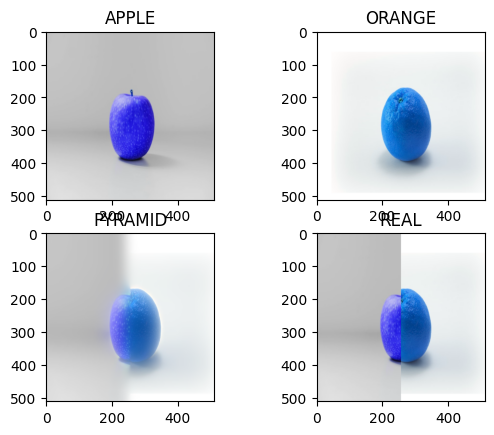

In [114]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

A = cv.imread('images/apple.jpg')
B = cv.imread('images/orange.jpg')

# add white padding to the orange image all around
B = cv.copyMakeBorder(B, 60, 22, 60, 0, cv.BORDER_CONSTANT, value=[255, 255, 255])

# matching the sizes of the images
A = cv.resize(A, (512, 512))
B = cv.resize(B, (512, 512))


# generate Gaussian pyramid for A
G = A.copy()
gpA = [G]
for i in range(6):
    G = cv.pyrDown(G)
    gpA.append(G)

# generate Gaussian pyramid for B

G = B.copy()
gpB = [G]
for i in range(6):
    G = cv.pyrDown(G)
    gpB.append(G)

# generate Laplacian Pyramid for A
lpA = [gpA[5]]
for i in range(5, 0, -1):
    GE = cv.pyrUp(gpA[i])
    L = cv.subtract(gpA[i-1], GE)
    lpA.append(L)

# generate Laplacian Pyramid for B
lpB = [gpB[5]]
for i in range(5, 0, -1):
    GE = cv.pyrUp(gpB[i])
    L = cv.subtract(gpB[i-1], GE)
    lpB.append(L)

# Now add left and right halves of images in each level
LS = []
for la, lb in zip(lpA, lpB):
    rows, cols, dpt = la.shape
    ls = np.hstack((la[:, 0:int(cols/2)], lb[:, int(cols/2):]))
    LS.append(ls)

# now reconstruct
ls_ = LS[0]
for i in range(1, 6):
    ls_ = cv.pyrUp(ls_)
    ls_ = cv.add(ls_, LS[i])

# image with direct connecting each half
real = np.hstack((A[:, :int(cols/2)], B[:, int(cols/2):]))

plt.subplot(221), plt.imshow(A), plt.title('APPLE')
plt.subplot(222), plt.imshow(B), plt.title('ORANGE')
plt.subplot(223), plt.imshow(ls_), plt.title('PYRAMID')
plt.subplot(224), plt.imshow(real), plt.title('REAL')
plt.show()

## Contours

### Goal
In this chapter,

    We will learn to find contours, draw contours etc
    We will see these functions : cv2.findContours(), cv2.drawContours()

### What are contours?

Contours can be explained simply as a curve joining all the continuous points (along the boundary), having same color or intensity. The contours are a useful tool for shape analysis and object detection and recognition.

For better accuracy, use binary images. So before finding contours, apply threshold or canny edge detection.

findContours function modifies the source image. So if you want source image even after finding contours, already store it to some other variables.

In OpenCV, finding contours is like finding white object from black background. So remember, object to be found should be white and background should be black.

Let’s see how to find contours of a binary image:

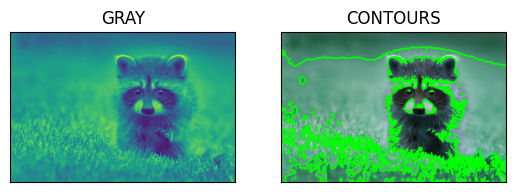

In [115]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."
imgray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(imgray, 127, 255, 0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

img = cv.drawContours(img, contours, -1, (0, 255, 0), 3)

plt.subplot(121), plt.imshow(imgray), plt.title('GRAY')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img), plt.title('CONTOURS')
plt.xticks([]), plt.yticks([])
plt.show()


See, there are three arguments in cv2.findContours() function, first one is source image, second is contour retrieval mode, third is contour approximation method. And it outputs the image, contours and hierarchy. contours is a Python list of all the contours in the image. Each individual contour is a Numpy array of (x,y) coordinates of boundary points of the object.

### How to draw the contours?

To draw the contours, cv2.drawContours function is used. It can also be used to draw any shape provided you have its boundary points. Its first argument is source image, second argument is the contours which should be passed as a Python list, third argument is index of contours (useful when drawing individual contour. To draw all contours, pass -1) and remaining arguments are color, thickness etc.

To draw all the contours in an image:

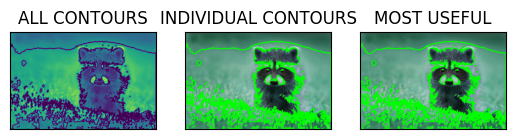

In [116]:
# all the contours
img1 = cv.drawContours(imgray, contours, -1, (0, 255, 0), 3)
# individual contours
img2 = cv.drawContours(img, contours, 3, (0, 255, 0), 3)
# most of the time, below is more useful
cnt = contours[4]
img3 = cv.drawContours(img, [cnt], 0, (0, 255, 0), 3)

plt.subplot(131), plt.imshow(img1), plt.title('ALL CONTOURS')
plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img2), plt.title('INDIVIDUAL CONTOURS')
plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(img3), plt.title('MOST USEFUL')
plt.xticks([]), plt.yticks([])
plt.show()

#### Note
Last two methods are same, but for last one, we need to specify the coordinates of contour. This is useful when you are trying to draw a rectangle around a object to count objects etc.

### Contour Approximation Method

This is the third argument in cv2.findContours function. What does it denote actually?

Above, we told that contours are the boundaries of a shape with same intensity. It stores the (x,y) coordinates of the boundary of a shape. But does it store all the coordinates ? That is specified by this contour approximation method.

If you pass cv2.CHAIN_APPROX_NONE, all the boundary points are stored. But actually do we need all the points? For eg, you found the contour of a straight line. Do you need all the points on the line to represent that line? No, we need just two end points of that line. This is what cv2.CHAIN_APPROX_SIMPLE does. It removes all redundant points and compresses the contour, thereby saving memory.

### Contour Features

#### 1. Moments

Image moments help you to calculate some features like center of mass of the object, area of the object etc. Check out the wikipedia page on Image Moments

The function cv2.moments() gives a dictionary of all moment values calculated. See below:

In [180]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/favourite.png')
assert img is not None, "Could not read the image."
ret, thresh = cv.threshold(cv.cvtColor(img, cv.COLOR_BGR2GRAY), 127, 255, 0)
contours, hierarchy = cv.findContours(thresh, 1, 2)

cnt = contours[0]
M = cv.moments(cnt)
print(M)

# centroid
cx = int(M['m10']/M['m00'])
cy = int(M['m01']/M['m00'])
print(cx, cy)

{'m00': 100131.5, 'm10': 25557980.0, 'm01': 27946844.833333332, 'm20': 7461897558.083333, 'm11': 7130598272.708333, 'm02': 8736378468.583332, 'm30': 2383822700923.3003, 'm21': 2081393676733.5, 'm12': 2228280349798.6, 'm03': 2960825282834.25, 'mu20': 938372576.6299448, 'mu11': -2670492.0004405975, 'mu02': 936374112.9269209, 'mu30': 188743141.22509766, 'mu21': 130653052.55117798, 'mu12': -138504621.37213135, 'mu03': -197148135.1279297, 'nu20': 0.09359095162041944, 'nu11': -0.00026634824358738336, 'nu02': 0.0933916298111477, 'nu30': 5.949005541674296e-05, 'nu21': 4.118060813328602e-05, 'nu12': -4.3655348466815964e-05, 'nu03': -6.21392301089271e-05}
255 279


From the above moments, you can extract useful data like area, centroid etc. Centroid is given by the relations, $C_x = \frac{M_{10}}{M_{00}}$ and $C_y = \frac{M_{01}}{M_{00}}$.

#### 2. Contour Area

Contour area is given by the function cv2.contourArea() or from moments, M['m00'].

In [181]:
area = cv.contourArea(cnt)
print(area)

100131.5


#### 3. Contour Perimeter

It is also called arc length. It can be found out using cv2.arcLength() function. Second argument specify whether shape is a closed contour (if passed True), or just a curve.

In [182]:
perimeter = cv.arcLength(cnt, True)
print(perimeter)

1766.1677346229553


#### 4. Contour Approximation

It approximates a contour shape to another shape with less number of vertices depending upon the precision we specify. It is an implementation of Douglas-Peucker algorithm. Check the wikipedia page for algorithm and demonstration.

To understand this, suppose you are trying to find a square in an image, but due to some problems in the image, you didn’t get a perfect square, but a “bad shape” (As shown in first image below). Now you can use this function to approximate the shape. In this, second argument is called epsilon, which is maximum distance from contour to approximated contour. It is an accuracy parameter. A wise selection of epsilon is needed to get the correct output.

In [183]:
epsilon = 0.1*cv.arcLength(cnt, True)
approx = cv.approxPolyDP(cnt, epsilon, True)
print(approx)


[[[252  27]]

 [[104 479]]

 [[403 484]]

 [[496 202]]]


#### 5. Convex Hull

Convex Hull will look similar to contour approximation, but it is not (Both may provide same results in some cases). Here, cv2.convexHull() function checks a curve for convexity defects and corrects it. Generally speaking, convex curves are the curves which are always bulged out, or at-least flat. And if it is bulged inside, it is called convexity defects. 

There is a little bit things to discuss about it its syntax:
    
        hull = cv2.convexHull(points[, hull[, clockwise[, returnPoints]]

Arguments details:
    
        points are the contours we pass into.
        hull is the output, normally we avoid it.
        clockwise : Orientation flag. If it is True, the output convex hull is oriented clockwise. Otherwise, it is oriented counter-clockwise.
        returnPoints : By default, True. Then it returns the coordinates of the hull points. If False, it returns the indices of contour points corresponding to the hull points.

See below example:

In [184]:
hull = cv.convexHull(cnt)
print(hull)

[[[258  27]]

 [[260  28]]

 [[493 197]]

 [[495 199]]

 [[496 202]]

 [[496 205]]

 [[407 478]]

 [[406 481]]

 [[403 484]]

 [[108 484]]

 [[105 481]]

 [[104 479]]

 [[ 15 205]]

 [[ 15 201]]

 [[ 16 199]]

 [[ 18 197]]

 [[252  27]]]


#### 6. Checking Convexity

There is a function to check if a curve is convex or not, cv2.isContourConvex(). It just return whether True or False. Not a big deal.

In [185]:
k = cv.isContourConvex(cnt)
print(k)

False


#### 7. Bounding Rectangle

There are two types of bounding rectangles.

    Straight Bounding Rectangle
    Rotated Rectangle

##### 7.a. Straight Bounding Rectangle

It is a straight rectangle, it doesn’t consider the rotation of the object. So area of the bounding rectangle won’t be minimum. It is found by the function cv2.boundingRect().
Let (x,y) be the top-left coordinate of the rectangle and (w,h) be its width and height.

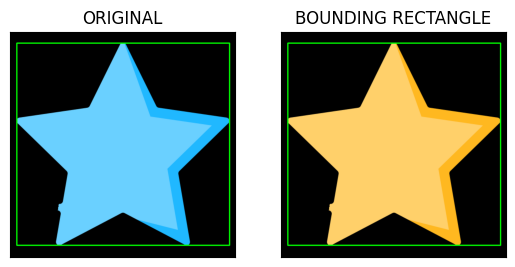

In [186]:
x, y, w, h = cv.boundingRect(cnt)
img1 = cv.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB)), plt.title('BOUNDING RECTANGLE')
plt.xticks([]), plt.yticks([])
plt.show()

##### 7.b. Rotated Rectangle

Here, bounding rectangle is drawn with minimum area, so it considers the rotation also. The function used is cv2.minAreaRect(). It returns a Box2D structure which contains following detals - ( top-left corner(x,y), (width, height), angle of rotation ). But to draw this rectangle, we need 4 corners of the rectangle. It is obtained by the function cv2.boxPoints()

/var/folders/2x/b5gtx1gx5rb7q6n60wjbv_s00000gn/T/ipykernel_27912/3588217353.py:3: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)


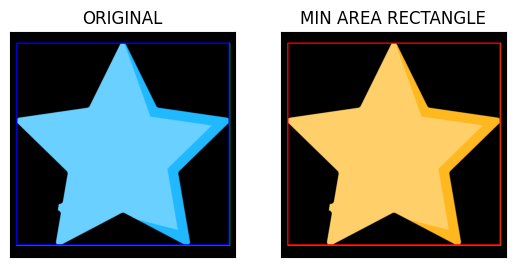

In [187]:
rect = cv.minAreaRect(cnt)
box = cv.boxPoints(rect)
box = np.int0(box)
img1 = cv.drawContours(img, [box], 0, (0, 0, 255), 2)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB)), plt.title('MIN AREA RECTANGLE')
plt.xticks([]), plt.yticks([])
plt.show()

#### 8. Minimum Enclosing Circle

Next we find the circumcircle of an object using the function cv2.minEnclosingCircle(). It is a circle which completely covers the object with minimum area.

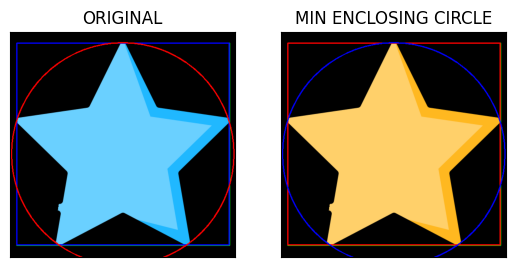

In [188]:
(x, y), radius = cv.minEnclosingCircle(cnt)
center = (int(x), int(y))
radius = int(radius)
img1 = cv.circle(img, center, radius, (255, 0, 0), 2)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB)), plt.title('MIN ENCLOSING CIRCLE')
plt.xticks([]), plt.yticks([])
plt.show()

#### 9. Fitting an Ellipse

Next one is to fit an ellipse to an object. It returns the rotated rectangle in which the ellipse is inscribed.

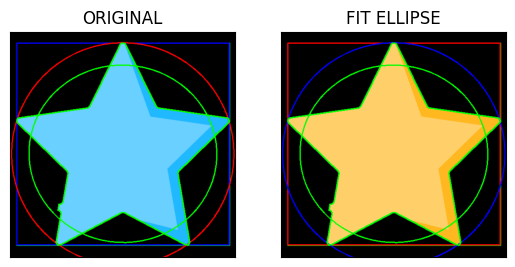

In [189]:
img = cv.drawContours(img, [cnt], 0, (0, 255, 0), 2)
ellipse = cv.fitEllipse(cnt)
img1 = cv.ellipse(img, ellipse, (0, 255, 0), 2)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB)), plt.title('FIT ELLIPSE')
plt.xticks([]), plt.yticks([])
plt.show()

#### 10. Fitting a Line

Similarly we can fit a line to a set of points. Below image contains a set of white points. We can approximate a straight line to it.

/var/folders/2x/b5gtx1gx5rb7q6n60wjbv_s00000gn/T/ipykernel_27912/2291956720.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  lefty = int((-x*vy/vx) + y)
/var/folders/2x/b5gtx1gx5rb7q6n60wjbv_s00000gn/T/ipykernel_27912/2291956720.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  righty = int(((cols-x)*vy/vx)+y)


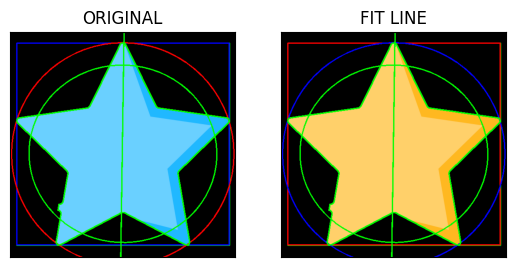

In [190]:
rows, cols = img.shape[:2]
[vx, vy, x, y] = cv.fitLine(cnt, cv.DIST_L2, 0, 0.01, 0.01)
lefty = int((-x*vy/vx) + y)
righty = int(((cols-x)*vy/vx)+y)
img1 = cv.line(img, (cols-1, righty), (0, lefty), (0, 255, 0), 2)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB)), plt.title('FIT LINE')
plt.xticks([]), plt.yticks([])
plt.show()

### Contour Properties

#### 1. Aspect Ratio

It is the ratio of width to height of bounding rect of the object.

$$
aspect\;ratio = \frac{width}{height}
$$

In [191]:
x, y, w, h = cv.boundingRect(cnt)
aspect_ratio = float(w)/h
print(aspect_ratio)

1.0524017467248907


#### 2. Extent

Extent is the ratio of contour area to bounding rectangle area.

$$
extent = \frac{object\;area}{bounding\;rectangle\;area}
$$

In [192]:
area = cv.contourArea(cnt)
x, y, w, h = cv.boundingRect(cnt)
rect_area = w*h
extent = float(area)/rect_area
print(extent)

0.4535845005345268


3. Solidity

Solidity is the ratio of contour area to its convex hull area.

$$
solidity = \frac{contour\;area}{convex\;hull\;area}
$$

In [193]:
area = cv.contourArea(cnt)
hull = cv.convexHull(cnt)
hull_area = cv.contourArea(hull)
solidity = float(area)/hull_area
print(solidity)

0.6517450337160562


#### 4. Equivalent Diameter

Equivalent Diameter is the diameter of the circle whose area is same as the contour area.

$$
equivalent\;diameter = \sqrt{\frac{4 \cdot contour\;area}{\pi}}
$$

In [194]:
area = cv.contourArea(cnt)
equi_diameter = np.sqrt(4*area/np.pi)
print(equi_diameter)

357.05935847369824


#### 5. Orientation

Orientation is the angle at which object is directed. Following method also gives the Major Axis and Minor Axis lengths.

In [195]:
(x, y), (MA, ma), angle = cv.fitEllipse(cnt)
print(MA, ma, angle)

401.89410400390625 425.7833251953125 93.16766357421875


#### 6. Mask and Pixel Points

In some cases, we may need all the points which comprises that object. It can be done as follows:

In [196]:
mask = np.zeros(imgray.shape, np.uint8)
cv.drawContours(mask, [cnt], 0, 255, -1)
pixelpoints = np.transpose(np.nonzero(mask))
print(pixelpoints)
pixelpoints = cv.findNonZero(mask)
print(pixelpoints)


[[ 27 252]
 [ 27 253]
 [ 27 254]
 ...
 [426 396]
 [426 397]
 [426 398]]
[[[252  27]]

 [[253  27]]

 [[254  27]]

 ...

 [[396 426]]

 [[397 426]]

 [[398 426]]]


Here, two methods are used, one using Numpy functions, next one using OpenCV function (last commented line) . Results are same, but with a slight difference. Numpy gives coordinates in (row, column) format, while OpenCV gives coordinates in (x,y) format. So basically the answers will be interchanged. Note that, row = x and column = y.

#### 7. Maximum Value, Minimum Value and their locations

We can find these parameters using a mask image.

In [197]:
min_val, max_val, min_loc, max_loc = cv.minMaxLoc(imgray, mask=mask)
print(min_val, max_val, min_loc, max_loc)

0.0 244.0 (448, 199) (150, 324)


#### 8. Mean Color or Mean Intensity

Here, we can find the average color of an object. Or it can be average intensity of the object in grayscale mode. We again use the same mask to do it.


In [198]:
mean_val = cv.mean(imgray, mask=mask)
print(mean_val)

(131.76886249253604, 0.0, 0.0, 0.0)



#### 9. Extreme Points

Extreme Points means topmost, bottommost, rightmost and leftmost points of the object.

(15, 201) (496, 205) (252, 27) (108, 484)


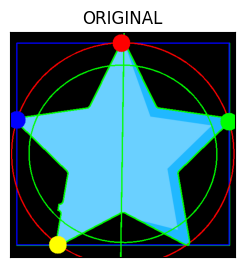

In [199]:
leftmost = tuple(cnt[cnt[:, :, 0].argmin()][0])
rightmost = tuple(cnt[cnt[:, :, 0].argmax()][0])
topmost = tuple(cnt[cnt[:, :, 1].argmin()][0])
bottommost = tuple(cnt[cnt[:, :, 1].argmax()][0])
print(leftmost, rightmost, topmost, bottommost)

# ccircle the extreme points
img = cv.circle(img, leftmost, 20, (0, 0, 255), -1)
img = cv.circle(img, rightmost, 20, (0, 255, 0), -1)
img = cv.circle(img, topmost, 20, (255, 0, 0), -1)
img = cv.circle(img, bottommost, 20, (255, 255, 0), -1)

plt.subplot(121), plt.imshow(img), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.show()

### Contours : More Functions

#### 1. Convexity Defects

Any deviation of the object from this hull can be considered as convexity defect. OpenCV provides a function cv2.convexityDefects() that helps to find all such deviations. Generally speaking, convex curves are the curves which are always bulged out, or at-least flat. And if it is bulged inside, it is called convexity defects. For example, in below image of hand, points in red color are convexity defects.

In [200]:
hull = cv.convexHull(cnt, returnPoints=False)
defects = cv.convexityDefects(cnt, hull)

##### Note
Remeber we have to pass returnPoints = False while finding convex hull, so that we can find convexity defects.

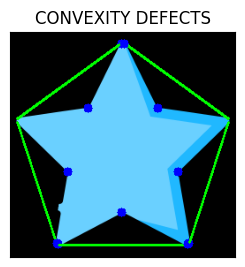

In [201]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/favourite.png')
# resize image
img = cv.resize(img, (0, 0), fx=0.5, fy=0.5)
assert img is not None, "file could not be read, check with os.path.exists()"
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
ret,thresh = cv.threshold(img_gray, 127, 255,0)
contours,hierarchy = cv.findContours(thresh,2,1)
cnt = contours[0]
hull = cv.convexHull(cnt,returnPoints = False)
defects = cv.convexityDefects(cnt,hull)
for i in range(defects.shape[0]):
    s,e,f,d = defects[i,0]
    start = tuple(cnt[s][0])
    end = tuple(cnt[e][0])
    far = tuple(cnt[f][0])
    cv.line(img,start,end,[0,255,0],2)
    cv.circle(img,far,5,[0,0,255],-1)

plt.subplot(121), plt.imshow(img), plt.title('CONVEXITY DEFECTS')
plt.xticks([]), plt.yticks([])
plt.show()

#### 2. Point Polygon Test

This function finds the shortest distance between a point in the image and a contour. It returns the distance which is negative when point is outside the contour, positive when point is inside and zero if point is on the contour.

For example, we can check the point (50,50) as follows:

In [202]:
dist = cv.pointPolygonTest(cnt, (50, 50), True)
print(dist)

-41.593268686170845


in the function, third argument is measureDist. If it is True, it finds the signed distance. If False, it finds whether the point is inside or outside or on the contour (it returns +1, -1, 0 respectively). By default, it is True.

#### 3. Match Shapes

OpenCV comes with a function cv2.matchShapes() which enables us to compare two shapes, or two contours and returns a metric showing the similarity. The lower the result, the better match it is. It is calculated based on the hu-moment values. Different measurement methods are explained in the docs.

0.0
0.0025743448700654703
1.7976931348623157e+308


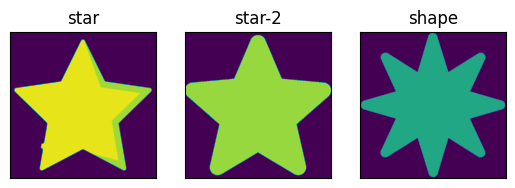

In [203]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img1 = cv.imread('images/favourite.png', cv.IMREAD_GRAYSCALE)
img2 = cv.imread('images/star-3.png', cv.IMREAD_GRAYSCALE)
img3 = cv.imread('images/shape.png', cv.IMREAD_GRAYSCALE)
assert img1 is not None, "Could not read the image."
assert img2 is not None, "Could not read the image."
assert img3 is not None, "Could not read the image."

ret, thresh = cv.threshold(img1, 127, 255, 0)
ret, thresh2 = cv.threshold(img2, 127, 255, 0)
ret, thresh3 = cv.threshold(img3, 127, 255, 0)

contours, hierarchy = cv.findContours(thresh, 2, 1)
cnt1 = contours[0]
contours, hierarchy = cv.findContours(thresh2, 2, 1)
cnt2 = contours[0]
contours, hierarchy = cv.findContours(thresh3, 2, 1)
cnt3 = contours[0]

ret = cv.matchShapes(cnt1, cnt1, 1, 0.0)
print(ret)

ret = cv.matchShapes(cnt1, cnt2, 1, 0.0)
print(ret)

ret = cv.matchShapes(cnt1, cnt3, 1, 0.0)
print(ret)

plt.subplot(131), plt.imshow(img1), plt.title('star')
plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img2), plt.title('star-2')
plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(img3), plt.title('shape')
plt.xticks([]), plt.yticks([])
plt.show()


##### Note
Hu-Moments are seven moments invariant to translation, rotation and scale. Usually the first 2 or 3 moments are enough to get a good classification.

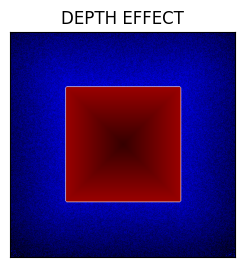

In [271]:
# Image depth using distance transform
# It represents the distance from all pixels to the white curve on it.
# All pixels inside curve is blue depending on the distance.
# Similarly outside points are red. Contour edges are marked with White.
# So problem is simple.
# Write a code to create such a representation of distance.

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = np.zeros((400, 400, 3), np.uint8)
img = cv.rectangle(img, (100, 100), (300, 300), (255, 255, 255), 3)
ret, thresh = cv.threshold(cv.cvtColor(img, cv.COLOR_BGR2GRAY), 127, 255, 0)
contours, hierarchy = cv.findContours(thresh, 2, 1)
cnt = contours[0]
hull = cv.convexHull(cnt, returnPoints=True)
# make the depth effects
blue = np.array([[[255, 0, 0]]], dtype=np.uint8)
red = np.array([[[0, 0, 255]]], dtype=np.uint8)
for i in range(400):
    for j in range(400):
        dist = cv.pointPolygonTest(hull, (i, j), True)
        blue[0, 0, 0] = 255 + dist - np.random.randint(250 + int(i/10), 350 + int(i/10))
        red[0, 0, 2] = 255 - dist - 100
        if dist > 0:
            img[i, j] = red
        elif dist < 0:
            img[i, j] = blue
        else:
            img[i, j] = [255, 255, 255]

plt.subplot(121), plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), plt.title('DEPTH EFFECT')
plt.xticks([]), plt.yticks([])
plt.show()

comparing 0 with 0 = 0.0
comparing 0 with 1 = 0.4791414746407521
comparing 0 with 2 = 0.5367553156145084
comparing 0 with 3 = 0.7520354842058921
comparing 0 with 4 = 0.08650648702692879
comparing 0 with 5 = 0.6554792741280057
comparing 0 with 6 = 1.0157785958503982
comparing 0 with 7 = 0.8493326227663328
comparing 0 with 8 = 0.2934556197783138
comparing 0 with 9 = 0.4407525825220502

comparing 1 with 0 = 0.4791414746407521
comparing 1 with 1 = 0.0
comparing 1 with 2 = 0.13846030304051316
comparing 1 with 3 = 0.3878344354793044
comparing 1 with 4 = 0.4353502477238731
comparing 1 with 5 = 0.21169017259111528
comparing 1 with 6 = 0.6741208572567834
comparing 1 with 7 = 0.43192719541441577
comparing 1 with 8 = 0.2046087904136759
comparing 1 with 9 = 0.05516774544929198

comparing 2 with 0 = 0.5367553156145084
comparing 2 with 1 = 0.13846030304051316
comparing 2 with 2 = 0.0
comparing 2 with 3 = 0.40476639072164666
comparing 2 with 4 = 0.5167924619988078
comparing 2 with 5 = 0.1972438666654

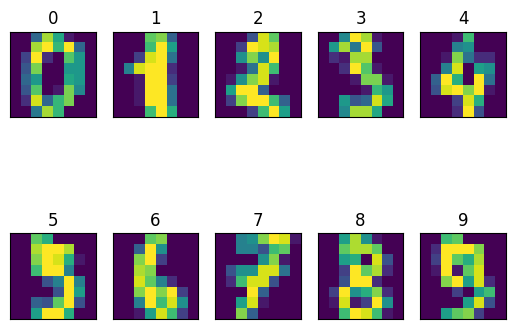

In [284]:
# comparing images of digits or letters using cv.matchShapes()

import cv2 as cv
from sklearn.datasets import load_digits
import numpy as np
import matplotlib.pyplot as plt

digits = load_digits()
rets, threshs = [], []
cnts = []
for i in range(10):
    # convert from scikit-learn to opencv
    img = np.uint8(digits.images[i]*255)
    ret, thresh = cv.threshold(img, 127, 255, 0)
    rets.append(ret)
    threshs.append(thresh)
    contours, hierarchy = cv.findContours(thresh, 2, 1)
    cnts.append(contours[0])

for i in range(10):
    for j in range(10):
        ret = cv.matchShapes(cnts[i], cnts[j], 1, 0.0)
        print("comparing {} with {} = {}".format(i, j, ret))
    print()

for i in range(10):
    plt.subplot(2, 5, i+1), plt.imshow(digits.images[i]), plt.title(i)
    plt.xticks([]), plt.yticks([])
plt.show()




### Contours Hierarchy

#### Theory

In the last few sections, we have drawn many things like circle, rectangle etc. But all these things were done by drawing individual contours. That means we need to find contours and hierarchy relations between them. But sometimes you may need to find all the contours in the image, process them and then find the hierarchy. But OpenCV provides a method findContours() which retrieves contours as well as the hierarchy.

#### What is Hierarchy?

Consider an example image shown in the figure below. There are some shapes inside a bigger shape, like a rectangle and a circle. We can explain this relationship in two ways.

    Top-to-Bottom : This is the hierarchy we have seen in all the previous images. Higher level object is always parent of lower level objects. Here, outermost rectangle is the parent and inner rectangle and circle are the children.
    Bottom-to-Top : This is exactly opposite of the above one. Here, the small v shapes are the parents and the big V shape is the child.

So each contour has its own information regarding what hierarchy it is, who is its child, who is its parent etc. OpenCV provides a function cv2.findContours() for this purpose. First argument is source image, second argument is contour retrieval mode, third argument is contour approximation method. And it outputs the contours and hierarchy. Contours is a Python list of all the contours in the image. Each individual contour is a Numpy array of (x,y) coordinates of boundary points of the object.

#### Hierarchy Representation in OpenCV

It is a 4 element array of integers. It has information about the image topology. We will see how to extract this information.

Each contour has its own information regarding what hierarchy it is, who is its child, who is its parent etc. OpenCV represents it as an array of four values : [Next, Previous, First_Child, Parent]

    Next denotes next contour at the same hierarchical level.
    Previous denotes previous contour at the same hierarchical level.
    First_Child denotes its first child contour.
    Parent denotes index of its parent contour.

If any of these is not available, for example if there is no child for a contour or there is no parent, that field is taken as -1. For example.

#### Contour Retrieval Modes

##### 1. RETR_LIST

This is the simplest of the four flags, and it simply retrieves all of the contours without any hierarchical relationships. So all the contours are stored in hierarchy as on level-0.

##### 2. RETR_EXTERNAL

If you use this flag, it returns only extreme outer flags. All child contours are left behind. We can say, under this law, Only the eldest in every family is taken care of. It doesn’t care about other members of the family :). In our image, it returns 4 contours.

##### 3. RETR_CCOMP

This flag retrieves all the contours and arranges them to a 2-level hierarchy. ie external contours of the object (ie its boundary) are placed in hierarchy-1. And the contours of holes inside object (if any) is placed in hierarchy-2. If any object inside it, its contour is placed again in hierarchy-1 only. And its hole in hierarchy-2 and so on.

Just consider the image of a “big white zero” on a black background. Outer circle of zero belongs to first hierarchy, and inner circle of zero belongs to second hierarchy.

##### 4. RETR_TREE

And this is the final guy, Mr.Perfect. It retrieves all the contours and creates a full family hierarchy list. It even tells, who is the grandpa, father, son, grandson and even beyond... :).




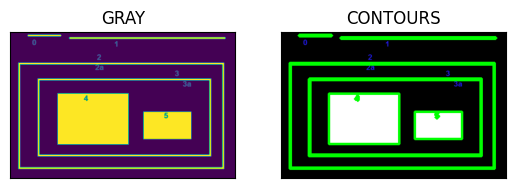

[[[15 -1  1 -1]
  [-1 -1  2  0]
  [-1 -1  3  1]
  [-1 -1  4  2]
  [10 -1  5  3]
  [ 6 -1 -1  4]
  [ 7  5 -1  4]
  [ 8  6 -1  4]
  [ 9  7 -1  4]
  [-1  8 -1  4]
  [-1  4 11  3]
  [12 -1 -1 10]
  [13 11 -1 10]
  [14 12 -1 10]
  [-1 13 -1 10]
  [16  0 -1 -1]
  [-1 15 -1 -1]]]


In [286]:
# Contour Hierarchy
# In some cases, we may need to find all the contours in the image,
# but only the outer contours are useful for us.
# In this case, we will use the hierarchy parameter.
# It contains information about the image topology.
# It has the following structure:
# [Next, Previous, First_Child, Parent]
# Next: index of the next contour at the same hierarchical level
# Previous: index of the previous contour at the same hierarchical level
# First_Child: index of the first child
# Parent: index of the parent

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/hierarchy.png')
assert img is not None, "Could not read the image."
imgray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(imgray, 127, 255, 0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

img = cv.drawContours(img, contours, -1, (0, 255, 0), 3)

plt.subplot(121), plt.imshow(imgray), plt.title('GRAY')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img), plt.title('CONTOURS')
plt.xticks([]), plt.yticks([])
plt.show()

print(hierarchy)

## Histograms in OpenCV

### Goal
In this chapter,

    We will learn to find and draw Histograms

### Theory

#### 1. Histograms - Introduction

You can consider histogram as a graph or plot, which gives you an overall idea about the intensity distribution of an image. It is a plot with pixel values (ranging from 0 to 255, not always) in X-axis and corresponding number of pixels in the image on Y-axis.

It is just another way of understanding the image. By looking at the histogram of an image, you get intuition about contrast, brightness, intensity distribution etc of that image. Almost all image processing tools today, provides features on histogram. Below is an image from Cambridge in Color website, shows different kind of images and their histograms.

#### 2. Histograms - OpenCV

OpenCV API has a function cv2.calcHist() to compute the histogram of an image. It is a tool that can help us to understand how the pixels in an image are distributed and it therefore provides us with a good indication of the contrast in an image. The function cv2.calcHist() takes the following parameters:

    images : it is the source image of type uint8 or float32. it should be given in square brackets, ie, "[img]".
    channels : it is also given in square brackets. It is the index of channel for which we calculate histogram. For example, if input is grayscale image, its value is [0]. For color image, you can pass [0], [1] or [2] to calculate histogram of blue, green or red channel respectively.
    mask : mask image. To find histogram of full image, it is given as "None". But if you want to find histogram of particular region of image, you have to create a mask image for that and give it as mask. (I will show an example later.)
    histSize : this represents our BIN count. Need to be given in square brackets. For full scale, we pass [256].
    ranges : this is our RANGE. Normally, it is [0,256].

So let’s start with a sample image. Simply load an image in grayscale mode and find its full histogram.

#### 3. Histogram Calculation in OpenCV

So now we use the function, cv2.calcHist() to find the histogram. Let’s familiarize with the function and its parameters :

    cv2.calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]])

    images : it is the source image of type uint8 or float32. it should be given in square brackets, ie, "[img]".
    channels : it is also given in square brackets. It is the index of channel for which we calculate histogram. For example, if input is grayscale image, its value is [0]. For color image, you can pass [0], [1] or [2] to calculate histogram of blue, green or red channel respectively.
    mask : mask image. To find histogram of full image, it is given as "None". But if you want to find histogram of particular region of image, you have to create a mask image for that and give it as mask. (I will show an example later.)
    histSize : this represents our BIN count. Need to be given in square brackets. For full scale, we pass [256].
    ranges : this is our RANGE. Normally, it is [0,256].

So let’s start with a sample image. Simply load an image in grayscale mode and find its full histogram.

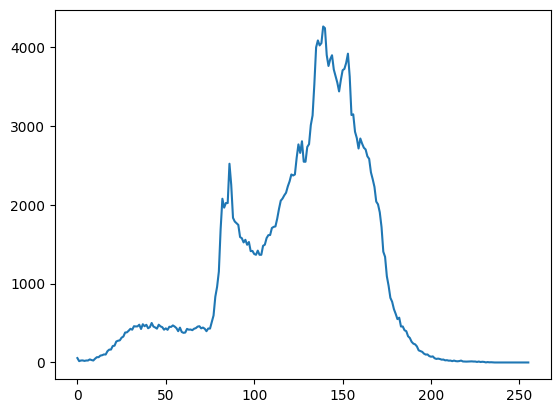

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
img = cv.imread('images/bendig_small.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."
hist = cv.calcHist([img], [0], None, [256], [0, 256])
plt.plot(hist)

#### 4. Histogram Calculation in Numpy

Numpy also provides you a function, np.histogram(). So instead of calcHist() function, you can try below line:

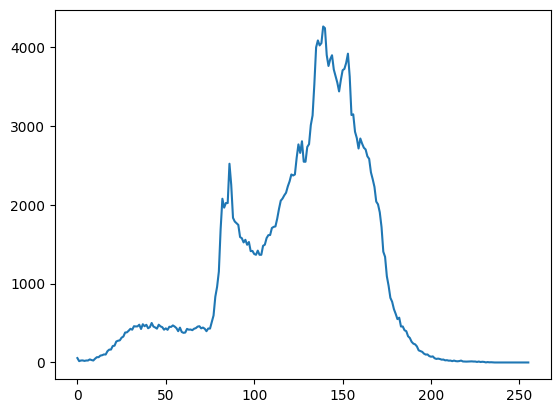

In [2]:
import numpy as np
hist, bins = np.histogram(img.ravel(), 256, [0, 256])
plt.plot(hist)

hist is same as we calculated before. But bins will have one extra bin, that is bin of 256. But we don’t need that. Upto 255, everything is fine. It is same as we analyzed in previous case.

##### Note
Numpy has another function, np.bincount() which is much faster than (around 10X) np.histogram(). So for one-dimensional histograms, you can better try that. OpenCV function is faster than (around 40X) than np.histogram(). So stick with OpenCV function.

#### 5. Plotting Histograms

We can plot histogram using Matplotlib library. matplotlib.pyplot.hist() function directly plots histogram for us. Bin size and number of bins are important considerations in addition to the usual arguments.

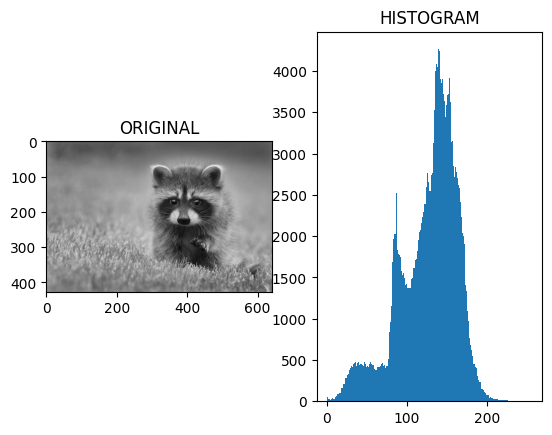

In [11]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

img = cv.imread('images/bendig_small.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."
plt.subplot(121), plt.imshow(img, 'gray'), plt.title('ORIGINAL')
plt.subplot(122), plt.hist(img.ravel(), 256, [0, 256]), plt.title('HISTOGRAM')
plt.show()


or we can use OpenCV function, cv2.calcHist() to find the histogram. But consider, only one channel at a time. For that, we need to specify channel = [i]. Where i is the channel number. For example, if input is grayscale image, its value is 0. For color image, you can pass [0], [1] or [2] to calculate histogram of blue, green or red channel respectively.

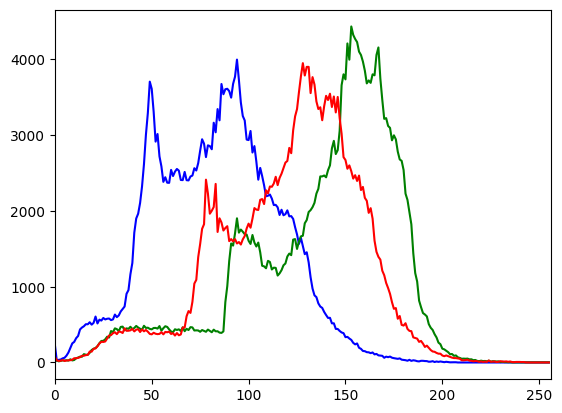

In [12]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."
color = ('b', 'g', 'r')
for i, col in enumerate(color):
    hist = cv.calcHist([img], [i], None, [256], [0, 256])
    plt.plot(hist, color=col)
    plt.xlim([0, 256])
plt.show()


You can detect from the above grapht theat, green has some higher values at higher pixel values than blue and red (obviously, as it is the grass color).

##### Using OpenCV

We can also use cv2.line() or cv2.polyline() to draw shapes on images. The below code draws a straight line of thickness 2 pixels from top-left corner to bottom-right corner of an image.

#### Applications of Mask
We will see few applications of mask here:

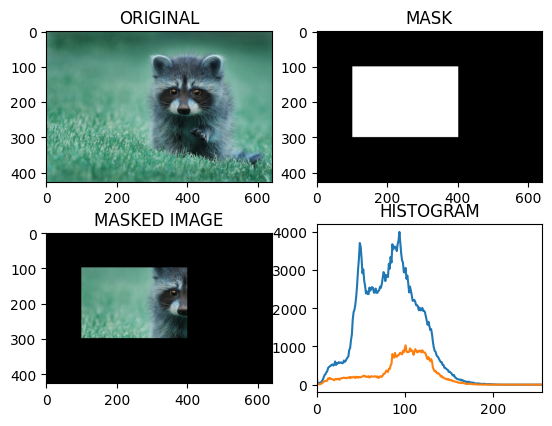

In [13]:
img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."

# create a mask
mask = np.zeros(img.shape[:2], np.uint8)
mask[100:300, 100:400] = 255
masked_img = cv.bitwise_and(img, img, mask=mask)

# calculate histogram with mask and without mask
# check third argument for mask
hist_full = cv.calcHist([img], [0], None, [256], [0, 256])
hist_mask = cv.calcHist([img], [0], mask, [256], [0, 256])

plt.subplot(221), plt.imshow(img, 'gray'), plt.title('ORIGINAL')
plt.subplot(222), plt.imshow(mask, 'gray'), plt.title('MASK')
plt.subplot(223), plt.imshow(masked_img, 'gray'), plt.title('MASKED IMAGE')
plt.subplot(224), plt.plot(hist_full), plt.plot(hist_mask), plt.title('HISTOGRAM')
plt.xlim([0, 256])
plt.show()

### Histogram Equalization

#### Theory

Consider an image whose pixel values are confined to some specific range of values only. For eg, brighter image will have all pixels confined to high values. But a good image will have pixels from all regions of the image. So you need to stretch this histogram to either ends and that is what Histogram Equalization does (in simple words). This normally improves the contrast of the image.


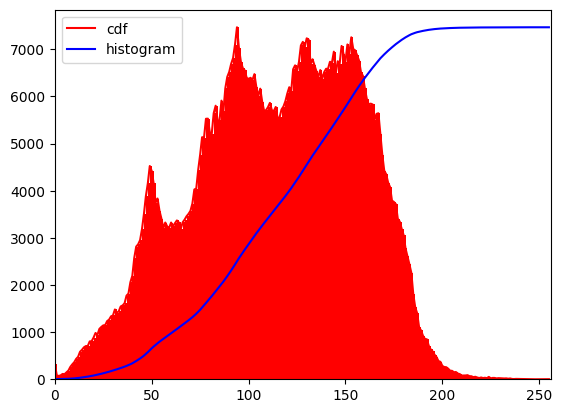

In [15]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."

hist, bins = np.histogram(img.ravel(), 256, [0, 256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()
plt.plot(cdf_normalized, color='b')
plt.hist(img.ravel(), 256, [0, 256], color='r')
plt.xlim([0, 256])
plt.legend(('cdf', 'histogram'), loc='upper left')
plt.show()

You can see histogram lies in brighter region. We need the full spectrum. For that, we need a transformation function which maps the input pixels in brighter region to output pixels in full region. That is what histogram equalization does.

Now we find the minimum histogram value (excluding 0) and apply the histogram equalization equation as given in wiki page. But I have used here, the masked array concept array from Numpy. For masked array, all operations are performed on non-masked elements. You can read more about it from Numpy docs on masked arrays.

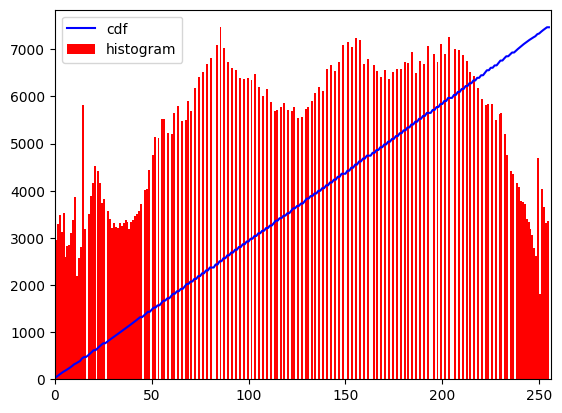

In [16]:
cdf_m = np.ma.masked_equal(cdf, 0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m, 0).astype('uint8')
img2 = cdf[img]

# calculate histogram with mask and without mask
hist, bins = np.histogram(img2.ravel(), 256, [0, 256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()
plt.plot(cdf_normalized, color='b')
plt.hist(img2.ravel(), 256, [0, 256], color='r')
plt.xlim([0, 256])
plt.legend(('cdf', 'histogram'), loc='upper left')
plt.show()

Another important feature is that, even if the image was a darker image (instead of a brighter one we used), after equalization we will get almost the same image as we got. Histogram equalization is good when histogram of the image is confined to a particular region. It won’t work good in places where there is large intensity variations where histogram covers a large region, ie both bright and dark pixels are present.

#### Histogram Equalization in OpenCV

OpenCV has a function to do this, cv2.equalizeHist(). Its input is just grayscale image and output is our histogram equalized image.

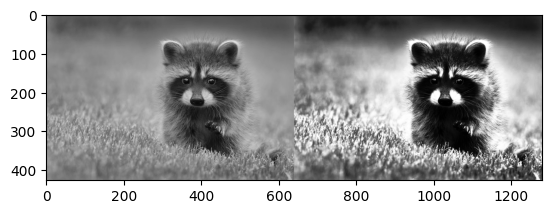

In [18]:
img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."
equ = cv.equalizeHist(cv.cvtColor(img, cv.COLOR_BGR2GRAY))
res = np.hstack((cv.cvtColor(img, cv.COLOR_BGR2GRAY), equ))
plt.imshow(res, cmap='gray')
plt.show()

So now you can take different images with different light conditions, equalize it. See the results.

Histogram equalization is good when histogram of the image is confined to a particular region. It won’t work good in places where there is large intensity variations where histogram covers a large region, ie both bright and dark pixels are present. Please check the wikipedia page for more details on this.

#### CLAHE (Contrast Limited Adaptive Histogram Equalization)

The first histogram equalization we just saw, considers the global contrast of the image. In many cases, it is not a good idea. Because it is possible that histogram may not cover whole range or it may be concentrated to a particular region. It is especially not a good idea when image has large variations in contrast. In that case, it is better to use adaptive histogram equalization. Here, image is divided into small blocks called “tiles” (tileSize is 8x8 by default in OpenCV). Then each of these blocks are histogram equalized as usual. So in a small area, histogram would confine to a small region (unless there is noise). If noise is there, it will be amplified. To avoid this, contrast limiting is applied. If any histogram bin is above the specified contrast limit (by default 40 in OpenCV), those pixels are clipped and distributed uniformly to other bins before applying histogram equalization. After equalization, to remove artifacts in tile borders, bilinear interpolation is applied.

Below code snippet shows how to apply CLAHE in OpenCV:

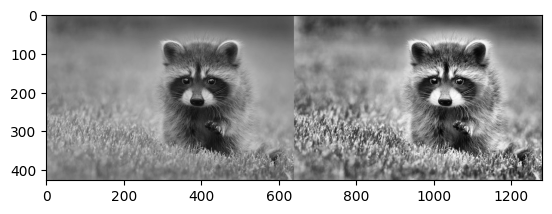

In [19]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."

# create a CLAHE object (Arguments are optional).
clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
cl1 = clahe.apply(cv.cvtColor(img, cv.COLOR_BGR2GRAY))

res = np.hstack((cv.cvtColor(img, cv.COLOR_BGR2GRAY), cl1))
plt.imshow(res, cmap='gray')
plt.show()

### 2D Histograms

#### Theory

In previous section, we discussed about histograms. It is nothing but a graph or plot, which gives you an overall idea about the intensity distribution of an image. It is a plot with pixel values (ranging from 0 to 255, not always) in X-axis and corresponding number of pixels in the image on Y-axis.

We normally use cv2.calcHist() to find the histogram of an image. Passing “images=[img]” gives the histogram of the image. But we can apply this method on individual channels of a color image as well. For example, if image is a color image, you can pass [0], [1] or [2] to calculate histogram of blue, green or red channel respectively.

#### 2D Histogram in OpenCV

It is quite simple and calculated using the same function, cv2.calcHist(). For color histograms, we need to convert the image from BGR to HSV. (Remember, for 1D histogram, we converted from BGR to Grayscale). For 2D histograms, its parameters will be modified as follows:

    channels = [0,1] because we need to process both H and S plane.
    bins = [180,256] 180 for H plane and 256 for S plane.
    range = [0,180,0,256] Hue value lies between 0 and 180 & Saturation lies between 0 and 256.



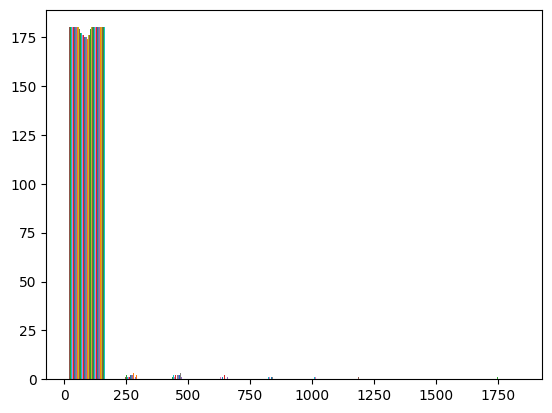

In [28]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

hist = cv.calcHist([hsv], [0, 1], None, [180, 256], [0, 180, 0, 256])
plt.hist(hist)
plt.show()

#### 2D Histogram in Numpy

Numpy also provides a specific function for this : np.histogram2d(). See the code below:

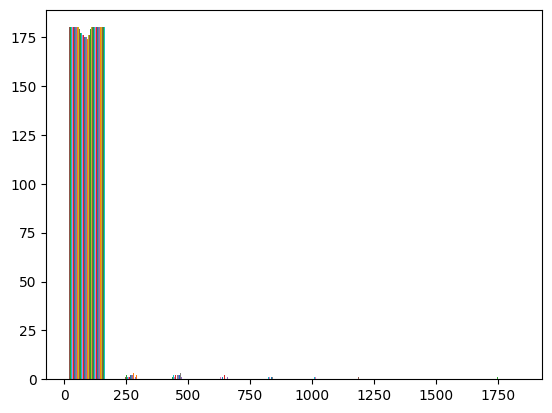

In [30]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

hist, xbins, ybins = np.histogram2d(hsv[:, :, 0].ravel(), hsv[:, :, 1].ravel(), [180, 256], [[0, 180], [0, 256]])
plt.hist(hist)
plt.show()

##### plotting 2D Histograms

###### Using cv2.imshow()

We can use cv2.imshow() function to plot 2D histogram with different color maps. It is customary to use different color maps to distinguish regions with low intensity values from regions with high intensity values. See the code below:

###### Using Matplotlib

We can also use Matplotlib to plot our 2D histogram:
the below is the input image and its color histogram plot.
X axis shows S (saturation) and Y axis shows H (hue).

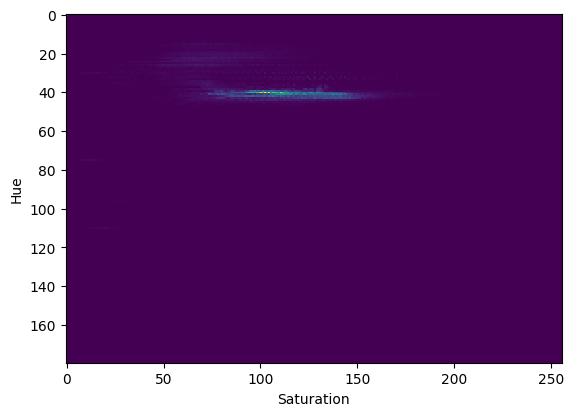

In [33]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg')
assert img is not None, "Could not read the image."
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
hist = cv.calcHist([hsv], [0, 1], None, [180, 256], [0, 180, 0, 256])

plt.imshow(hist, interpolation='nearest')
plt.xlabel('Saturation')
plt.ylabel('Hue')
plt.show()

### Histogram Backprojection

#### Theory

So what is histogram backprojection? In simple words, it is a way of recording how well the pixels of a given image fit the distribution of pixels in a histogram model. It was proposed by Michael J. Swain in 1991 and was used in color recognition task and later in texture segmentation and image retrieval.

For histogram model, we give a sample image as input and histogram is built for it. Similarly we need to find the histogram for our test image also. Then we apply backprojection function with this model we created. The result will be our histogram backprojection. Then we need to threshold the result to get our mask.

#### Algorithm in Numpy

1. First we need to calculate the histogram of source and template both. So we create two histograms for that.




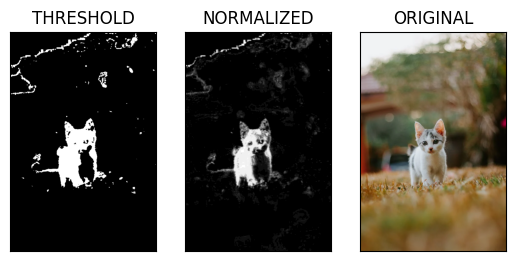

In [11]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

#roi is the object or region of object we need to find
roi = cv.imread('images/cat_little.png')
assert roi is not None, "Could not read the image."
hsv = cv.cvtColor(roi, cv.COLOR_BGR2HSV)

# target is the image we search in
target = cv.imread('images/cat.png')
assert target is not None, "Could not read the image."
hsvt = cv.cvtColor(target, cv.COLOR_BGR2HSV)

# Find the histograms using calcHist. Can be done with np.histogram2d also
M = cv.calcHist([hsv], [0, 1], None, [180, 256], [0, 180, 0, 256])
I = cv.calcHist([hsvt], [0, 1], None, [180, 256], [0, 180, 0, 256])

# Find the ratio avoid divide by zero
I[I == 0] = 1
R = M/I
h, s, v = cv.split(hsvt)
B = R[h.ravel(), s.ravel()]
B = np.minimum(B, 1)
B = B.reshape(hsvt.shape[:2])

disc = cv.getStructuringElement(cv.MORPH_ELLIPSE, (5, 5))
cv.filter2D(B, -1, disc, B)
B = np.uint8(B)
cv.normalize(B, B, 0, 255, cv.NORM_MINMAX)
ret, thresh = cv.threshold(B, 50, 255, 0)

plt.subplot(131), plt.imshow(thresh, cmap='gray'), plt.title('THRESHOLD')
plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(B, cmap='gray'), plt.title('NORMALIZED')
plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(cv.cvtColor(target, cv.COLOR_BGR2RGB)), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.show()

#### Histogram Backprojection in OpenCV

OpenCV provides an inbuilt function cv2.calcBackProject(). Its parameters are almost same as the cv2.calcHist() function. One of its parameter is histogram which is histogram of the object and we have to find it. Also, the object histogram should be normalized before passing on to the backproject function. It returns the probability image. Then we convolve this image with disc kernel. For that, cv2.filter2D() is used. Then we threshold it and find the contours. Please see the code below:

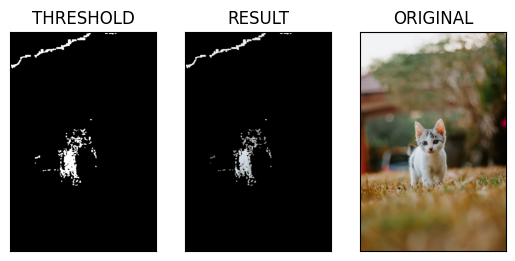

In [13]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

roi = cv.imread('images/cat_little.png')
assert roi is not None, "Could not read the image."
hsv = cv.cvtColor(roi, cv.COLOR_BGR2HSV)

target = cv.imread('images/cat.png')
assert target is not None, "Could not read the image."
hsvt = cv.cvtColor(target, cv.COLOR_BGR2HSV)

# calculating object histogram
roihist = cv.calcHist([hsv], [0, 1], None, [180, 256], [0, 180, 0, 256])

# normalize histogram and apply backprojection
cv.normalize(roihist, roihist, 0, 255, cv.NORM_MINMAX)
dst = cv.calcBackProject([hsvt], [0, 1], roihist, [0, 180, 0, 256], 1)

# Now convolute with circular disc
disc = cv.getStructuringElement(cv.MORPH_ELLIPSE, (5, 5))
cv.filter2D(dst, -1, disc, dst)

# threshold and binary AND
ret, thresh = cv.threshold(dst, 50, 255, 0)
thresh = cv.merge((thresh, thresh, thresh))
res = cv.bitwise_and(target, thresh)

plt.subplot(131), plt.imshow(thresh, cmap='gray'), plt.title('THRESHOLD')
plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(cv.cvtColor(res, cv.COLOR_BGR2RGB)), plt.title('RESULT')
plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(cv.cvtColor(target, cv.COLOR_BGR2RGB)), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.show()

## Fourier Transform

### Goal
In this section, we will

    Learn about Fourier Transform
    Learn how to find Discrete Fourier Transform (DFT)
    Learn to find Frequency Transform, Cosine Transform etc

### Theory

Fourier Transform is used to analyze the frequency characteristics of various filters. For images, 2D Discrete Fourier Transform (DFT) is used to find the frequency domain. A fast algorithm called Fast Fourier Transform (FFT) is used for calculation of DFT. Details about these can be found in any image processing or signal processing textbooks. For understanding purposes, we will see a simple sine function in our example.

For a sinusoidal signal, we can say frequency is the number of cycles in one second. So if In an image, high frequency corresponds to the areas of the image where there is a sudden change of intensity. Similarly, low frequency corresponds to areas of the image where there is a gradual change of intensity.

More intuitively, a low-pass filter allows low-frequency components to pass while blocking high-frequency components. That is, low-pass filters smooth the image. A high-pass filter allows the high-frequency components to pass while blocking low-frequency components. That is, high-pass filters sharpen the image.

#### Numpy

Numpy has an FFT package to do this. np.fft.fft2() provides us the frequency transform which will be a complex array. Its first argument is the input image, which is grayscale. Second argument is optional which decides the size of output array. If it is greater than size of input image, input image is padded with zeros before calculation of FFT. If it is less than input image, input image will be cropped. If no arguments passed, Output array size will be same as input.

Once you got the result, zero frequency component (DC component) will be at top left corner. If you want to bring it to center, you need to shift the result by N/2 in both the directions. This is simply done by the function, np.fft.fftshift(). (It is more easier to analyze). Once you found the frequency transform, you can find the magnitude spectrum.

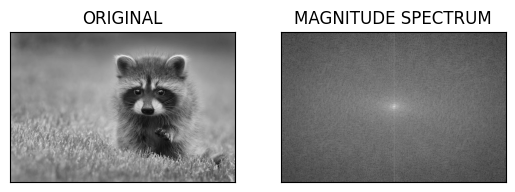

In [11]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
# avoid log(0)
fshift[fshift == 0] = 1
magnitude_spectrum = 20*np.log(np.abs(fshift))

plt.subplot(121), plt.imshow(img, cmap='gray'), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray'), plt.title('MAGNITUDE SPECTRUM')
plt.xticks([]), plt.yticks([])
plt.show()

See, You can see more whiter region at the center showing low frequency content is more.

So we found the frequency transform. Now we can do some operations in frequency domain, like high pass filtering and reconstruct the image, ie find inverse DFT. For that we simply remove the low frequencies by masking with a rectangular window of size 60x60. Then apply the inverse shift using np.fft.ifftshift() so that DC component again come at the top-left corner. Then find inverse FFT using np.ifft2() function. The result, again, will be a complex number. You can take its absolute value.

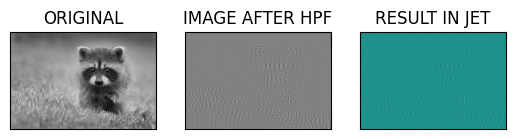

In [13]:
rows, cols = img.shape
crow, ccol = int(rows/2), int(cols/2)
fshift[crow-30:crow+30, ccol-30:ccol+30] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.real(img_back)

plt.subplot(131), plt.imshow(img, cmap='gray'), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img_back, cmap='gray'), plt.title('IMAGE AFTER HPF')
plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(img_back), plt.title('RESULT IN JET')
plt.xticks([]), plt.yticks([])
plt.show()



The result shows High Pass Filtering is an edge detection operation. This happens because high frequencies are mainly due to edges in an image. Above result is not much good, because we removed the low frequencies, but did nothing to high frequencies. So we lost our data. So we can do something in high frequencies also. For that we can use a concept called High Boost Filtering.

If you closely watch the result, especially the image in JET color, you can see some ringing artifacts. It is due to the fact that we removed some of the frequencies and is called ringing effect. We can remove this effect by applying a Gaussian Low Pass Filter to the image before applying Sobel (or any other) edge detection methods. This will remove the high frequency contents in the image (ie noise, edges) before applying edge detection. So this is how we can use frequency domain for filtering.

#### OpenCV

OpenCV provides the functions cv2.dft() and cv2.idft() for this. It returns the same result as previous, but with two channels. First channel will have the real part of the result and second channel will have the imaginary part of the result. The input image should be converted to np.float32 first. We will see how to do it.

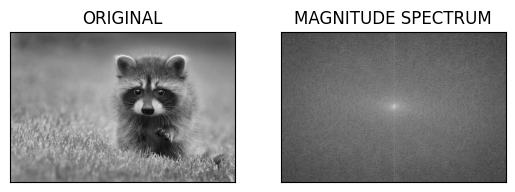

In [14]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/bendig_small.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."

dft = cv.dft(np.float32(img), flags=cv.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

magnitude_spectrum = 20*np.log(cv.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

plt.subplot(121), plt.imshow(img, cmap='gray'), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray'), plt.title('MAGNITUDE SPECTRUM')
plt.xticks([]), plt.yticks([])
plt.show()


##### Note
You can also use cv2.cartToPolar() which returns both magnitude and phase in a single shot, but I left that to you. Please check the docs for more details.

So, now we have to do inverse DFT. In previous session, we created a HPF, this time we will see how to remove high frequency contents in the image, ie we apply LPF to image and see how it looks like. It actually blurs the image. For this, we create a mask first with high value (1) at low frequencies, ie we pass the LF content, and 0 at HF region.

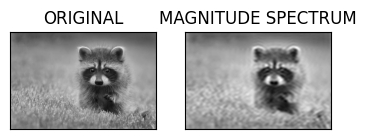

In [16]:
rows, cols = img.shape
crow, ccol = int(rows/2), int(cols/2)
# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows, cols, 2), np.uint8)
mask[crow-30:crow+30, ccol-30:ccol+30] = 1

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_back = cv.idft(f_ishift)
img_back = cv.magnitude(img_back[:, :, 0], img_back[:, :, 1])

plt.subplot(131), plt.imshow(img, cmap='gray'), plt.title('ORIGINAL')
plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img_back, cmap='gray'), plt.title('MAGNITUDE SPECTRUM')
plt.xticks([]), plt.yticks([])
plt.show()

### Performance Optimization of DFT

Preformance of DFT calculation is better for some array sizes. It is fastest when array size is power of two. The arrays whose size is a product of 2’s, 3’s, and 5’s are also processed quite efficiently. So if you are concerned about the performance of your code, you can modify the size of the array to any optimal size (by padding zeros) before finding DFT. For OpenCV, you have to manually pad zeros.

So how do we find this optimal size? OpenCV provides a function, cv2.getOptimalDFTSize() for this. It is applicable to both cv2.dft() and np.fft.fft2().

In [17]:
img = cv.imread('images/bendig_small.jpg', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."
rows, cols = img.shape
print(rows, cols)
nrows, ncols = cv.getOptimalDFTSize(rows), cv.getOptimalDFTSize(cols)
print(nrows, ncols)

427 640
432 640


See, the size (427, 640) is modified to (432, 640). Now let's pad it with zeros (for OpenCV) and find DFT calculation time. You can do it by creating a bigger array and put our image into it. Or you can use the function, cv2.copyMakeBorder(). Check the code below:

In [18]:
nimg = np.zeros((nrows, ncols))
nimg[:rows, :cols] = img
# or
right = ncols - cols
bottom = nrows - rows
bordertype = cv.BORDER_CONSTANT
nimg = cv.copyMakeBorder(img, 0, bottom, 0, right, bordertype, value=0)
# now we calculate the DFT preformance comparison of numpy function
%timeit np.fft.fft2(img)

6.61 ms ± 46.9 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [19]:
%timeit np.fft.fft2(img, [nrows, ncols])

3.25 ms ± 43.9 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [20]:
# now we calculate the DFT preformance comparison of opencv function
%timeit cv.dft(np.float32(img), flags=cv.DFT_COMPLEX_OUTPUT)

1.59 ms ± 5.37 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [21]:
%timeit cv.dft(np.float32(nimg), flags=cv.DFT_COMPLEX_OUTPUT)

838 µs ± 5.3 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In both libaries we knowtice that the time taken to calculate DFT for optimal size is less than the time taken to calculate DFT for non optimal size.

### Why Laplacian is a High Pass Filter?

why Laplacian is a high pass filter? why Sobel is a HPF? etc. The first answer is given in terms of a Fourier Transform. We know that Laplacian operator is a second order derivative operator. So if we apply Fourier Transform on it, we get the equation of the frequency representation of Laplacian as follows:

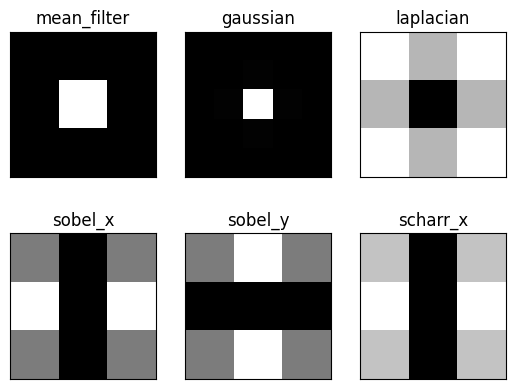

In [22]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

mean_filter = np.ones((3, 3))

x = cv.getGaussianKernel(5, 10)
gaussian = x*x.T

# different edge detecting filters
# scharr in x-direction
scharr = np.array([[-3, 0, 3],
                   [-10, 0, 10],
                   [-3, 0, 3]])

# sobel in x direction
sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

# sobel in y direction
sobel_y = np.array([[-1, -2, -1],
                    [0, 0, 0],
                    [1, 2, 1]])

# laplacian
laplacian = np.array([[0, 1, 0],
                      [1, -4, 1],
                      [0, 1, 0]])

filters = [mean_filter, gaussian, laplacian, sobel_x, sobel_y, scharr]
filter_name = ['mean_filter', 'gaussian', 'laplacian', 'sobel_x', 'sobel_y', 'scharr_x']

fft_filters = [np.fft.fft2(x) for x in filters]
fft_shift = [np.fft.fftshift(y) for y in fft_filters]
mag_spectrum = [np.log(np.abs(z)+1) for z in fft_shift]

for i in range(6):
    plt.subplot(2, 3, i+1), plt.imshow(mag_spectrum[i], cmap='gray')
    plt.title(filter_name[i]), plt.xticks([]), plt.yticks([])
plt.show()

From image, you can see what frequencies are present in Laplacian. It is clearly visible that high frequency components are present. So obviously it is a high pass filter.

### Template Matching

#### Theory

Template Matching is a method for searching and finding the location of a template image in a larger image. OpenCV comes with a function cv2.matchTemplate() for this purpose. It simply slides the template image over the input image (as in 2D convolution) and compares the template and patch of input image under the template image. Several comparison methods are implemented in OpenCV. (You can check docs for more details). It returns a grayscale image, where each pixel denotes how much does the neighbourhood of that pixel match with template.

If input image is of size (WxH) and template image is of size (wxh), output image will have a size of (W-w+1, H-h+1). Once you got the result, you can use cv2.minMaxLoc() function to find where is the maximum/minimum value. Take it as the top-left corner of rectangle and take (w,h) as width and height of the rectangle. That rectangle is your region of template.

#### Note
If you are using cv2.TM_SQDIFF as comparison method, minimum value gives the best match.

#### Template Matching in OpenCV

Here, as an example, we will search for a cat in an image. We will try all the comparison methods so that we can see how their results look like:

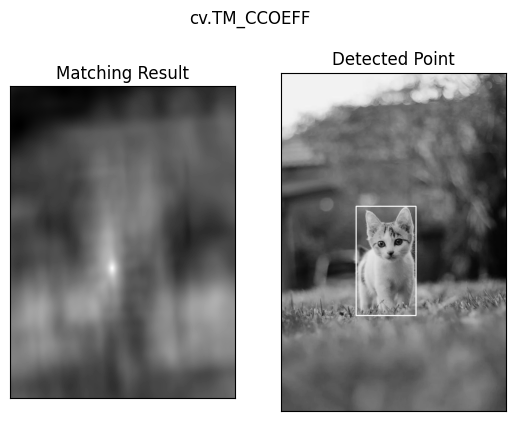

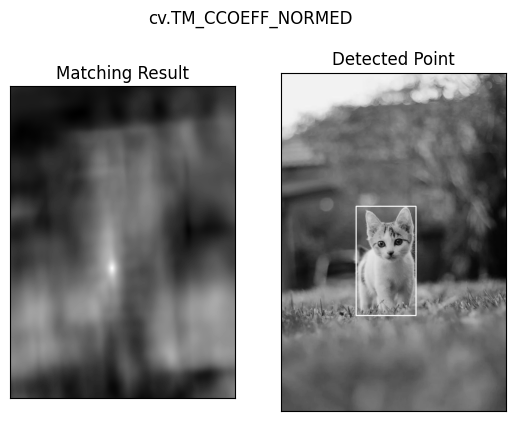

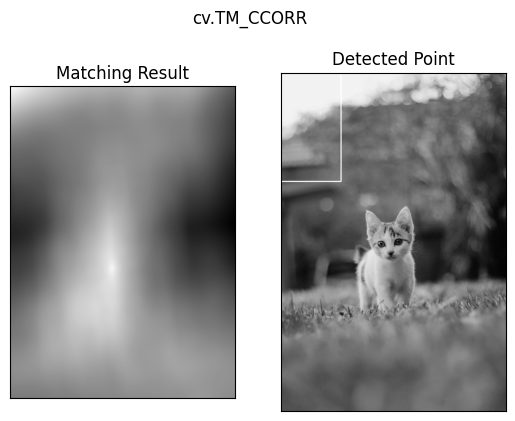

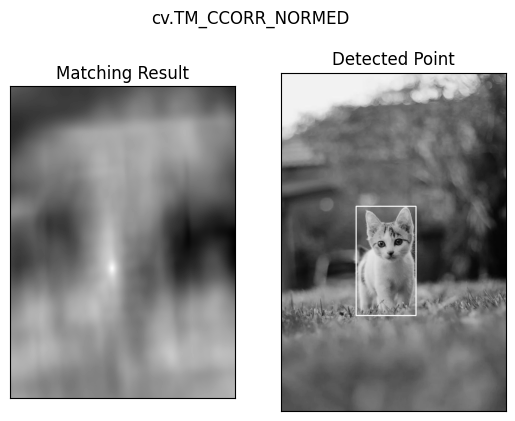

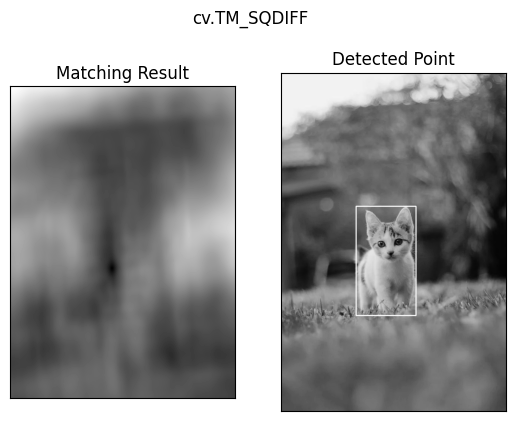

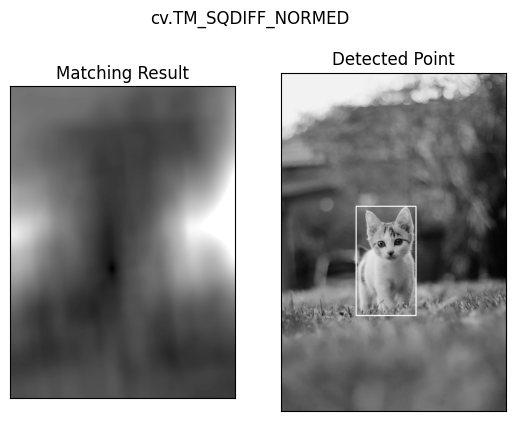

In [23]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/cat.png', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."
img2 = img.copy()
template = cv.imread('images/cat_little.png', cv.IMREAD_GRAYSCALE)
assert template is not None, "Could not read the image."
w, h = template.shape[::-1]

# all the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
           'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)

    # apply template matching
    res = cv.matchTemplate(img, template, method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

    # if the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc

    bottom_right = (top_left[0]+w, top_left[1]+h)
    cv.rectangle(img, top_left, bottom_right, 255, 2)
    
    plt.subplot(121), plt.imshow(res, cmap='gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(img, cmap='gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)
    plt.show()
    

You can see that the result using cv.TM_CCORR is not good as it is not giving the exact match. It just detects the white portion in the image. The result with cv.TM_SQDIFF also not good as it is giving minimum value wherever there is a match. It will be more clearer to you if you try all the comparison methods.

### Template Matching with Multiple Objects

In previous section, we searched image for cat, which occurs only once in the image. Suppose you are searching for an object which has multiple occurances, cv2.minMaxLoc() won’t give you all the locations. In that case, we will use thresholding.


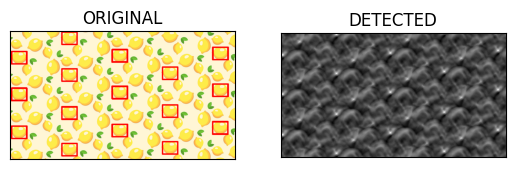

In [43]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_rgb = cv.imread('images/lemons.png')
assert img_rgb is not None, "Could not read the image."
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
template = cv.imread('images/lemon.png', cv.IMREAD_GRAYSCALE)
# reduce half of the size
template = cv.resize(template, (0, 0), fx=0.5, fy=0.5)
assert template is not None, "Could not read the image."
w, h = template.shape[::-1]

res = cv.matchTemplate(img_gray, template, cv.TM_CCOEFF_NORMED)
threshold = 0.8
loc = np.where(res >= threshold)
for pt in zip(*loc[::-1]):
    cv.rectangle(img_rgb, pt, (pt[0]+w, pt[1]+h), (0, 0, 255), 2)

plt.subplot(121), plt.imshow(cv.cvtColor(img_rgb, cv.COLOR_BGR2RGB))
plt.title('ORIGINAL'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(res, cmap='gray')
plt.title('DETECTED'), plt.xticks([]), plt.yticks([])
plt.show()

## Hough Line Transform 

### Goal

In this chapter,

    We will understand the concept of Hough Tranform.
    We will see how to use it detect lines in an image.
    We will see following functions : cv2.HoughLines(), cv2.HoughLinesP()

### Theory

#### What is Hough Transform?

Hough Transform is a popular technique to detect any shape, if you can represent that shape in mathematical form. It can detect the shape even if it is broken or distorted a little bit. We will see how it works for a line.

A line can be represented as $y = mx + c$ or in parametric form, as $\rho = x \cos \theta + y \sin \theta$ where $\rho$ is the perpendicular distance from origin to the line, and $\theta$ is the angle formed by this perpendicular line and horizontal axis measured in counter-clockwise ( That direction varies on how you represent the coordinate system. This representation is used in OpenCV).

So if you take every pair $(\rho, \theta)$ values and plot it on a plane, you will get a sinusoidal curve.

#### Hough Transform in OpenCV

Everything explained above is encapsulated in the OpenCV function, cv2.HoughLines(). It simply returns an array of $(\rho, \theta)$ values. $\rho$ is measured in pixels and $\theta$ is measured in radians. First parameter, Input image should be a binary image, so apply threshold or use canny edge detection before applying hough transform. Second and third parameters are $\rho$ and $\theta$ accuracies respectively. Fourth argument is the threshold, which means minimum vote it should get for it to be considered as a line. Remember, number of votes depend upon number of points on the line. So it represents the minimum length of line that should be detected.



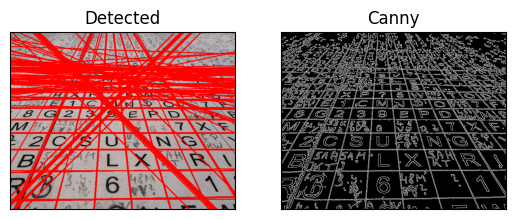

In [46]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/sudoku.jpg')
assert img is not None, "Could not read the image."
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
edges = cv.Canny(gray, 50, 150, apertureSize=3)

lines = cv.HoughLines(edges, 1, np.pi/180, 200)

for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    # x0, y0 is the intersection of the line with the first row
    x0 = a*rho
    y0 = b*rho
    # x1, y1 is the intersection of the line with the last row
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*a)
    # x2, y2 is the intersection of the line with the first column
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*a)
    cv.line(img, (x1, y1), (x2, y2), (0, 0, 255), 2)

plt.subplot(121), plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Detected'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(edges, cmap='gray')
plt.title('Canny'), plt.xticks([]), plt.yticks([])
plt.show()

#### Probabilistic Hough Transform

Sometimes, you may not want to detect all the lines in the image, but just the ones that are strong enough to be lines. In that case, use Probabilistic Hough Transform which is more efficient in that case. It returns line segments rather than the whole line. Each segment is represented by starting and ending points of that line.

It has two new arguments.

    minLineLength - Minimum length of line. Line segments shorter than this are rejected.
    maxLineGap - Maximum allowed gap between line segments to treat them as single line.

See the code below:

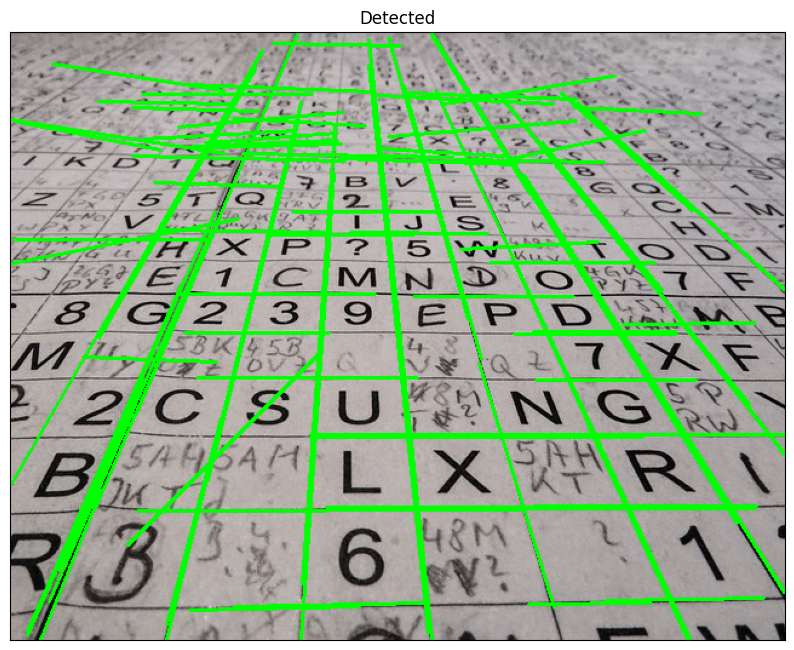

In [48]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/sudoku.jpg')
assert img is not None, "Could not read the image."
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
edges = cv.Canny(gray, 50, 150, apertureSize=3)
lines = cv.HoughLinesP(edges, 1, np.pi/180, 100, minLineLength=100, maxLineGap=10)
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv.line(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Detected'), plt.xticks([]), plt.yticks([])
plt.show()


### Hough Circle Transform

#### Theory

Like we used Hough Line Transform in Hough Line Transform, we can similarly use Hough Circle Transform in OpenCV. It returns the x,y coordinates and radius of the detected circle. See the OpenCV example below:


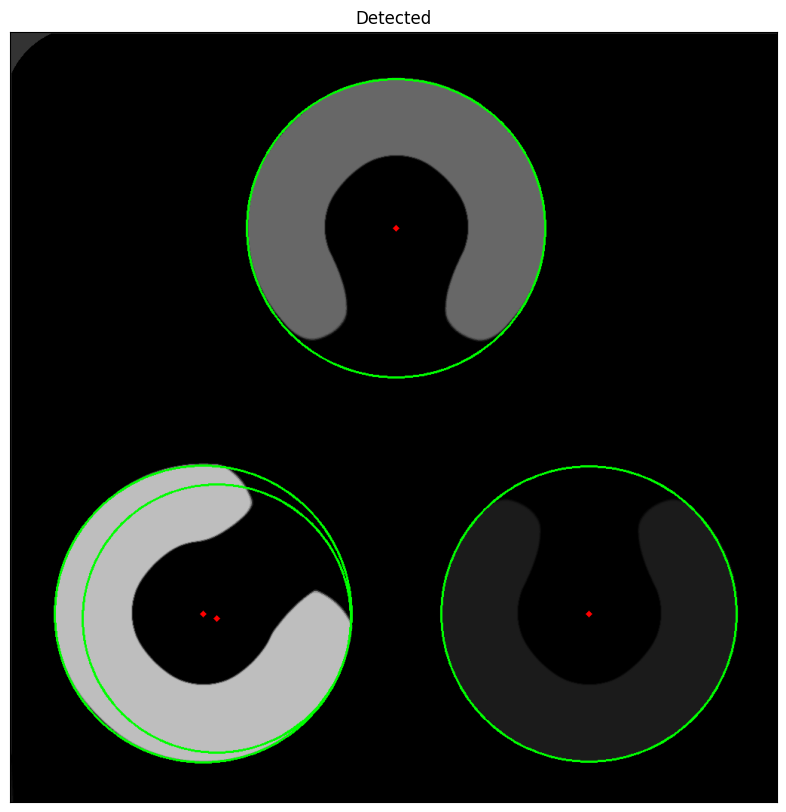

In [76]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/opencv_logo.png', cv.IMREAD_GRAYSCALE)
assert img is not None, "Could not read the image."
img = cv.medianBlur(img, 105)
cimg = cv.cvtColor(img, cv.COLOR_GRAY2BGR)

circles = cv.HoughCircles(img, cv.HOUGH_GRADIENT, 1, 20, param1=50, param2=50, minRadius=0, maxRadius=0)

circles = np.uint16(np.around(circles))
for i in circles[0, :]:
    # draw the outer circle
    cv.circle(cimg, (i[0], i[1]), i[2], (0, 255, 0), 2)
    # draw the center of the circle
    cv.circle(cimg, (i[0], i[1]), 2, (0, 0, 255), 3)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(cimg, cv.COLOR_BGR2RGB))
plt.title('Detected'), plt.xticks([]), plt.yticks([])
plt.show()

## Image Segmentation with Watershed Algorithm

### Goal

In this section,

    We will learn to use marker-based image segmentation using watershed algorithm

### Theory

Any grayscale image can be viewed as a topographic surface where high intensity denotes peaks and hills while low intensity denotes valleys. You start filling every isolated valleys (local minima) with different colored water (labels). As the water rises, depending upon the peaks (gradients) nearby, water from different valleys, obviously with different colors will start to merge. To avoid that, you build barriers in the locations where water merges. You continue the work of filling water and building barriers until all the peaks are under water. Then the barriers you created gives you the segmentation result. This is the "philosophy" behind watershed. You can visit the CMM webpage on watershed to understand it with the help of some animations.

But this approach gives you oversegmented result due to noise or any other irregularities in the image. So OpenCV implemented a marker-based watershed algorithm where you specify which are all valley points are to be merged and which are not. It is an interactive image segmentation. What we do is to give different labels for our object we know. Label the region which we are sure of being the foreground or object with one color (or intensity), label the region which we are sure of being background or non-object with another color and finally the region which we are not sure of anything, label it with 0. That is our marker. Then apply watershed algorithm. Then our marker will be updated with the labels we gave, and the boundaries of objects will have a value of -1.

#### Code

Below code segment shows an example where we can segment out the leaves from the image (shown below):

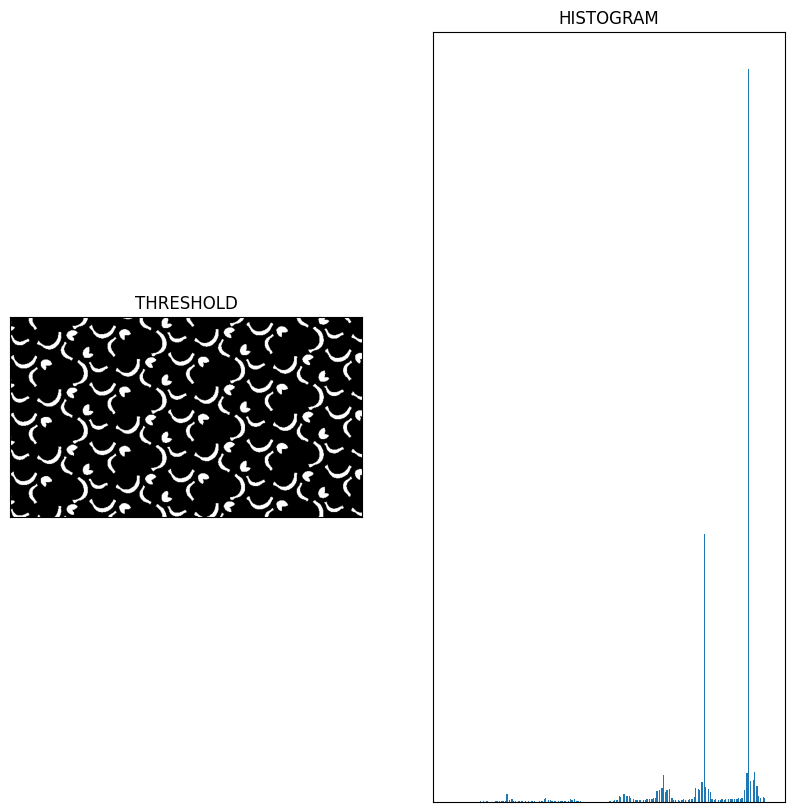

In [150]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/lemons.png')
assert img is not None, "Could not read the image."
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

ret, thresh = cv.threshold(gray, 0, 255, cv.THRESH_BINARY_INV+cv.THRESH_OTSU)


plt.figure(figsize=(10, 10))
plt.subplot(121), plt.imshow(thresh, cmap='gray')
plt.title('THRESHOLD'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.hist(gray.ravel(), 256)
plt.title('HISTOGRAM'), plt.xticks([]), plt.yticks([])
plt.show()

Now we need to remove any small holes in the object. For that we can use morphological opening. To remove any small white noises we can use morphological closing. So, now we know for sure that region near to center of objects are foreground and region much away from the object are background. Only region we are not sure is the boundaries, So we need to extract area of sure foreground in between area of sure background. It can be done by subtracting sure background from sure foreground.


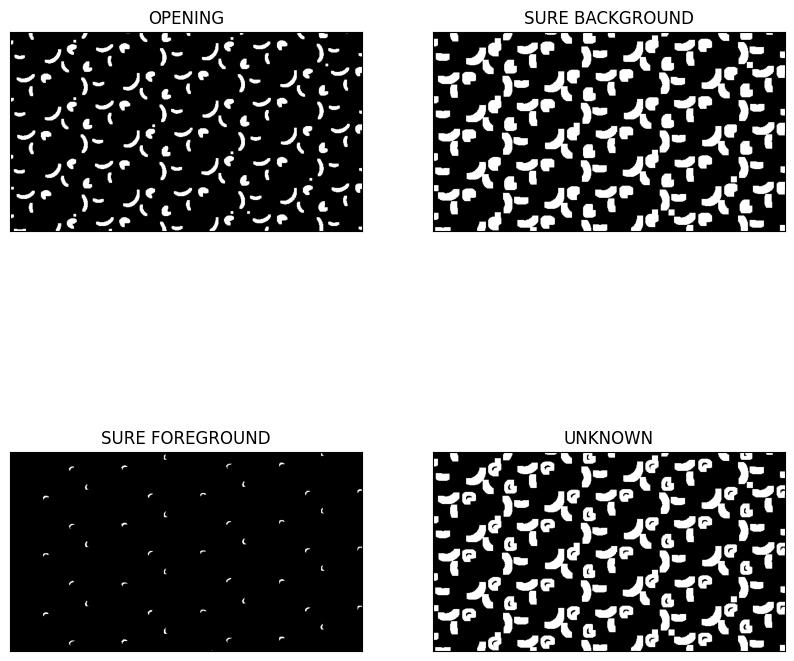

In [151]:
# noise removal
kernel = np.ones((3, 3), np.uint8)
opening = cv.morphologyEx(thresh, cv.MORPH_OPEN, kernel, iterations=2)

# sure background area
sure_bg = cv.dilate(opening, kernel, iterations=3)

# finding sure foreground area
dist_transform = cv.distanceTransform(opening, cv.DIST_L2, 5)
ret, sure_fg = cv.threshold(dist_transform, 0.7*dist_transform.max(), 255, 0)

# finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg, sure_fg)

plt.figure(figsize=(10, 10))
plt.subplot(221), plt.imshow(opening, cmap='gray')
plt.title('OPENING'), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(sure_bg, cmap='gray')
plt.title('SURE BACKGROUND'), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(sure_fg, cmap='gray')
plt.title('SURE FOREGROUND'), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(unknown, cmap='gray')
plt.title('UNKNOWN'), plt.xticks([]), plt.yticks([])
plt.show()

See the result. In the thresholded image, we get some regions of leaves which we are sure of leaves and they are detached now. (In some cases, you may be interested in only foreground segmentation, not in separating the mutually touching objects. In that case, you need to use another method based on distance transform). Now we know for sure which are region of leaves, which are background and all. So we create marker (it is an array of same size as that of original image, but with int32 datatype) and label the regions inside it. The regions we know for sure (whether foreground or background) are labelled with any positive integers, but different integers, and the area we don’t know for sure are just left as zero. For this we use cv2.connectedComponents(). It labels background of the image with 0, then other objects are labelled with integers starting from 1.

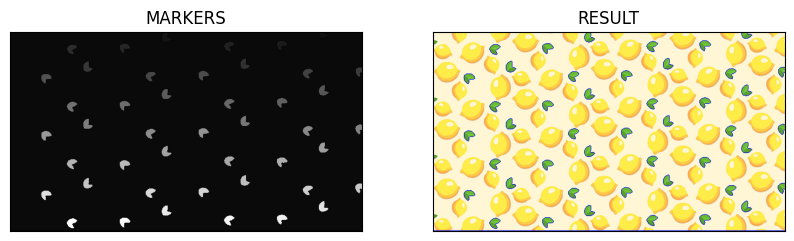

In [152]:
# marker labelling
ret, markers = cv.connectedComponents(sure_fg)

# add one to all labels so that sure background is not 0, but 1
markers = markers + 1

# now, mark the region of unknown with zero
markers[unknown == 255] = 0

markers = cv.watershed(img, markers)
img[markers == -1] = [255, 0, 0]

plt.figure(figsize=(10, 10))
plt.subplot(121), plt.imshow(markers, cmap='gray')
plt.title('MARKERS'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()


Now our marker is ready. It is time for final step, apply watershed. Then marker image will be modified. The boundary region will be marked with -1.

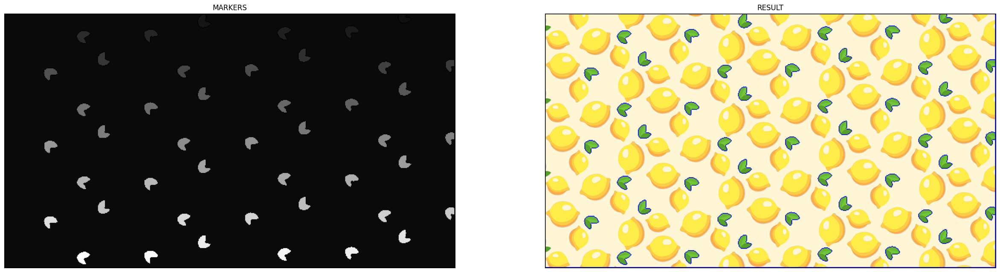

In [154]:
markers = cv.watershed(img, markers)
img[markers == -1] = [255, 0, 0]

plt.figure(figsize=(30, 30))
plt.subplot(121), plt.imshow(markers, cmap='gray')
plt.title('MARKERS'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()

## Interactive Foreground Extraction using GrabCut Algorithm

### Goal

In this section,

    We will learn to use grabcut algorithm to extract foreground in images
    We will see different functions like cv2.grabCut() etc.

### Theory

GrabCut algorithm was designed by Carsten Rother, Vladimir Kolmogorov & Andrew Blake from Microsoft Research Cambridge, UK. in their paper, "GrabCut": interactive foreground extraction using iterated graph cuts . An algorithm was needed for foreground extraction with minimal user interaction, and the result was GrabCut.

The algorithm used is similar to graph cut segmentation. But here user has to define the rectangle. Everything outside this rectangle will be taken as sure background (That is the reason why it is called GrabCut). Everything inside rectangle is unknown. Similarly our final foreground and background. After few iterations, algorithm automatically segments it into foreground and background. See the image below. First one is our input image. Second one is mask image which is manually created by the user. Third one is output image that gives us the segmented image. White patches denote the area which are sure foreground or foreground. Black patches denote the area which are sure background or background. Gray patches denote the area which are unknown by the algorithm. So our goal is to convert all the gray area to white area. In that case, we won’t touch or modify the white area. We will convert gray area to black area, so that we can modify it. Then mark it white again. This cycle continues until we are satisfied with the result.

#### Demo

Now we go for grabcut algorthm with OpenCV. OpenCV has the function, cv2.grabCut() for this. We will see its arguments first:

    img - Input image
    mask - It is a mask image where we specify which areas are background, foreground or probable background/foreground etc. It is done by the following flags, cv2.GC_BGD, cv2.GC_FGD, cv2.GC_PR_BGD, cv2.GC_PR_FGD, or simply pass 0,1,2,3 to image.
    rect - It is the coordinates of a rectangle which includes the foreground object in the format (x,y,w,h)
    bdgModel, fgdModel - These are arrays used by the algorithm internally. You just create two np.float64 type zero arrays of size (1,65).
    iterCount - Number of iterations the algorithm should run.
    mode - It should be cv2.GC_INIT_WITH_RECT or cv2.GC_INIT_WITH_MASK or combined which decides whether we are drawing rectangle or final touchup strokes.

First let’s see a simple demo of grabcut:


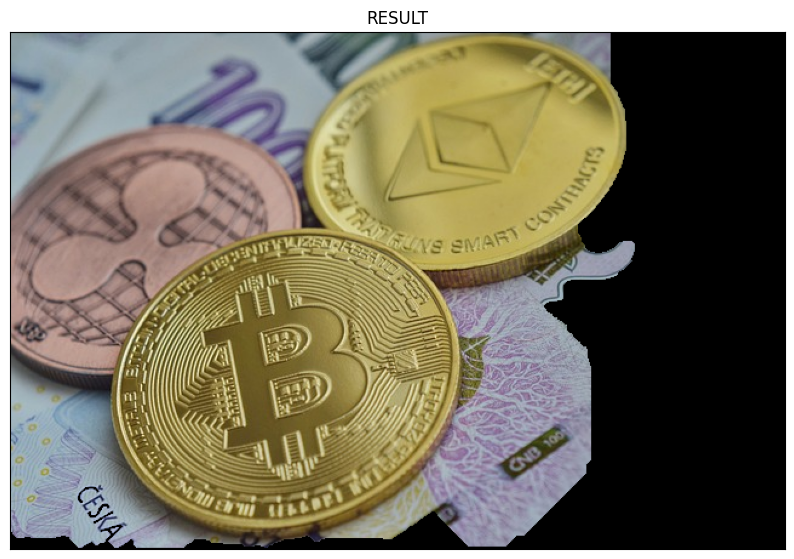

In [157]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/crypto.jpg')
assert img is not None, "Could not read the image."
mask = np.zeros(img.shape[:2], np.uint8)

bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

rect = (0, 0, 516, 426)
cv.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)

mask2 = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')
img = img*mask2[:, :, np.newaxis]

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()


some parts of the coin has disappeared. We need to bring them back. So we will give there a fine touchup with 1-pixel (sure foreground). At the same time, some unwanted background has come. We need to remove them. So we will give a touchup of 0-pixel (sure background). See the code below and result. 

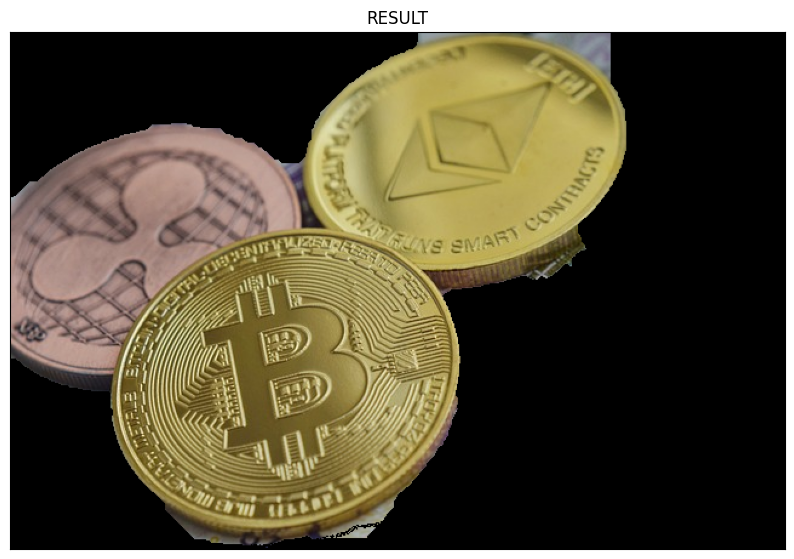

In [161]:
# newmask is the mask image I manually labelled
newmask = cv.imread('images/crypto.jpeg', cv.IMREAD_GRAYSCALE)
assert newmask is not None, "Could not read the image."

# whereever it is marked white (sure foreground), change mask=1
# whereever it is marked black (sure background), change mask=0
mask[newmask == 0] = 0
mask[newmask == 255] = 1

mask, bgdModel, fgdModel = cv.grabCut(img, mask, None, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_MASK)

mask = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')
img = img*mask[:, :, np.newaxis]

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()



So that's it. Here instead of initializing in rect mode, you can directly go into mask mode. Just mark the rectangle area in mask image with 2-pixel or 3-pixel (probable background/foreground). Then mark our sure_foreground with 1-pixel as we did in second example. Then directly apply the grabCut function with mask mode.

Select a ROI and then press SPACE or ENTER button!
Cancel the selection process by pressing c button!


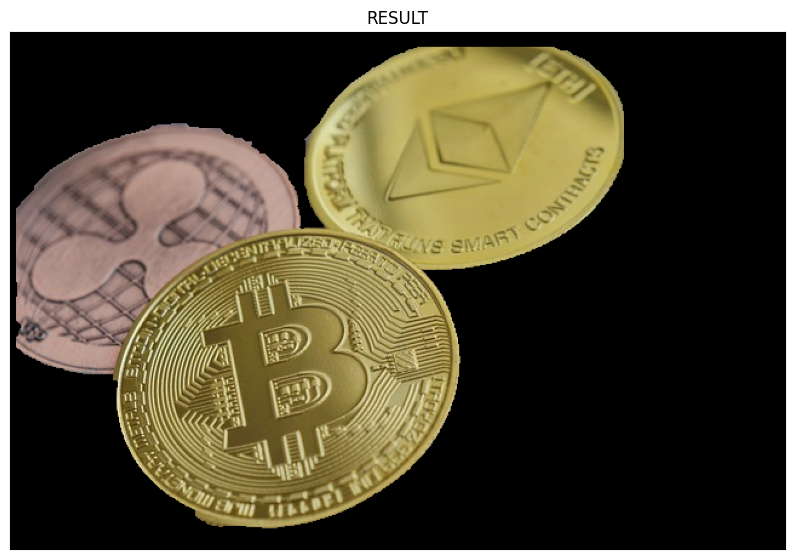

: 

In [168]:
# interactive grabcut
# let the user draw a rectangle and strokes on the image
# the rectangle will be the initial mask
# the strokes will be the new mask
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('images/crypto.jpg')
assert img is not None, "Could not read the image."
mask = np.zeros(img.shape[:2], np.uint8)
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

# ask the user to draw a rectangle
rect = cv.selectROI(img)

# run grabcut with the rectangle as the mask
cv.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)

# create a mask image with the rectangle as the mask
mask2 = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')

# apply the mask to the image
img = img*mask2[:, :, np.newaxis]

# ask the user to draw strokes
newmask = cv.imread('images/crypto.jpg', cv.IMREAD_GRAYSCALE)
assert newmask is not None, "Could not read the image."
# mouse drawing function black for background, white for foreground
drawing = False
mode = True
ix, iy = -1, -1
# mouse callback function
def draw_circle(event, x, y, flags, param):
    global ix, iy, drawing, mode
    if event == cv.EVENT_LBUTTONDOWN:
        drawing = True
        ix, iy = x, y
    elif event == cv.EVENT_MOUSEMOVE:
        if drawing:
            if mode:
                cv.line(newmask, (ix, iy), (x, y), 255, 5)
                cv.line(mask, (ix, iy), (x, y), cv.GC_FGD, 5)
            else:
                cv.line(newmask, (ix, iy), (x, y), 0, 5)
                cv.line(mask, (ix, iy), (x, y), cv.GC_BGD, 5)
            ix, iy = x, y
    elif event == cv.EVENT_LBUTTONUP:
        drawing = False
        if mode:
            cv.line(newmask, (ix, iy), (x, y), 255, 5)
            cv.line(mask, (ix, iy), (x, y), cv.GC_FGD, 5)
        else:
            cv.line(newmask, (ix, iy), (x, y), 0, 5)
            cv.line(mask, (ix, iy), (x, y), cv.GC_BGD, 5)

cv.namedWindow('image')
cv.setMouseCallback('image', draw_circle)

while True:
    #open the image and mask in two windows
    cv.imshow('image', newmask)
    cv.imshow('mask', img)
    k = cv.waitKey(1) & 0xFF
    if k == ord('m'):
        mode = not mode
    elif k == ord('r'):
        newmask[:] = 0
        mask[:] = 0
    elif k == ord('n'):
        break

cv.destroyAllWindows()

# run grabcut with the new mask
mask, bgdModel, fgdModel = cv.grabCut(img, mask, None, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_MASK)

# create a mask image with the new mask
mask = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')

# apply the mask to the image
img = img*mask[:, :, np.newaxis]
# show the result
plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()



## Understanding Features

### Goal

In this section,

    We will learn about features
    We will discuss about different features like SIFT, SURF etc.
    We will see SIFT for keypoint detection and BRIEF for keypoint description

### Explanation of Features

Features are basically the unique parts of an image which can be used to describe the image. They are unique, invariant to image scale and rotation, and fast to compute. They are used in many applications like image search, object tracking, video analysis etc.

#### Types of Features

There are many types of features. Some of them are:

    Edges
    Corners
    Blobs
    Ridges
    Valleys

Edges are sudden changes in image brightness. They encode information related to discontinuities in depth, surface orientation, albedo, and illumination. They are useful for finding structure in images and are very important in vision because they often correspond to the physical boundaries of objects in the world.

Corners are also called interest points or key points. They are the points whose local neighborhoods have some interesting properties. They are extremum of the function in all directions. They are invariant to image scale, rotation and illumination. They are important because they are better features to track and match than edges.

Blobs are regions in the image that have some unique properties. They are usually bright on dark or vice versa. They are useful for detecting regions in an image that differ in properties, such as color, illumination or texture. They are also useful for detecting noise.

Ridges are the elongated regions in an image. They are useful for finding the boundaries of objects.

Valleys are the regions which are lower than its surrounding. They are useful for finding boundaries of objects.

### Harris Corner Detector

#### Theory

Harris Corner Detector is a corner detection operator that is commonly used in computer vision algorithms to extract corners and infer features of an image. It was first introduced by Chris Harris and Mike Stephens in 1988 upon the improvement of Moravec's corner detector. This method is suitable for all grayscale images.

It basically finds the difference in intensity for a displacement of (u,v) in all directions. This is expressed as below:

$E(u,v) = \sum_{x,y} w(x,y)[I(x+u,y+v) - I(x,y)]^2$

where I(x,y) is the intensity of the image at point (x,y). This equation can be approximated using Taylor Expansion to the first order derivative as below:

$E(u,v) \approx \sum_{x,y} w(x,y)[I_x(x,y)u + I_y(x,y)v]^2$

where $I_x$ and $I_y$ are image derivatives in x and y directions respectively. This equation can be expressed in matrix form as below:

$E(u,v) \approx \begin{bmatrix} u & v \end{bmatrix} M \begin{bmatrix} u \\ v \end{bmatrix}$

where

$M = \sum_{x,y} w(x,y) \begin{bmatrix} I_x^2 & I_xI_y \\ I_xI_y & I_y^2 \end{bmatrix}$

Here, $I_x$ and $I_y$ are image derivatives in x and y directions respectively. So for each and every pixel in the image, these values are calculated and stored in a matrix M.

Then comes the main part. We have to maximize this function $E(u,v)$ for corner detection. That means, we have to maximize the second term. Applying some mathematical constraints (please refer any standard text books for more details), we get the final equation as:

$R = det(M) - k(trace(M))^2$

where

$det(M) = \lambda_1\lambda_2$
trace(M) = $\lambda_1 + \lambda_2$
$\lambda_1$ and $\lambda_2$ are the eigen values of M.

So for every pixel, we need to calculate the values of R. If the R is greater than a threshold value, it is considered as a corner. If it is between two threshold values, it is considered as an edge. If it is less than a value, it is considered as a non-interesting region.

#### Harris Corner Detection in OpenCV

OpenCV has the function cv2.cornerHarris() for this purpose. Its arguments are :

    img - Input image, it should be grayscale and float32 type.
    blockSize - It is the size of neighbourhood considered for corner detection
    ksize - Aperture parameter of Sobel derivative used.
    k - Harris detector free parameter in the equation.

See the code below:

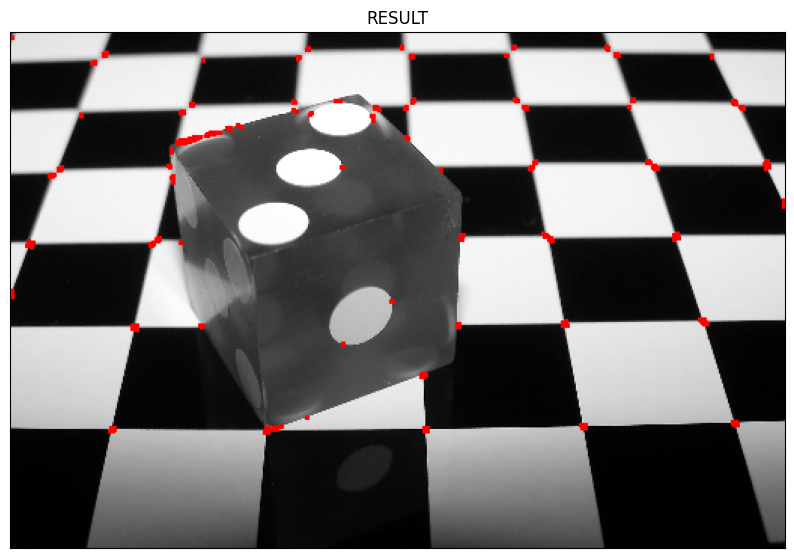

In [14]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

filename = 'images/chess.jpg'
img = cv.imread(filename)
assert img is not None, "Could not read the image."
# reduce the resolution if the image is too large
img = cv.resize(img, (0, 0), fx=0.2, fy=0.2)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# find Harris corners
gray = np.float32(gray)
dst = cv.cornerHarris(gray, 2, 3, 0.04)

# result is dilated for marking the corners, not important
dst = cv.dilate(dst, None)

# threshold for an optimal value, it may vary depending on the image
img[dst>0.01*dst.max()] = [0, 0, 255]

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()

#### Corner with SubPixel Accuracy

Sometimes, you may need to find the corners with maximum accuracy. OpenCV comes with a function cv2.cornerSubPix() which further refines the corners detected with sub-pixel accuracy. Below is an example. As usual, we need to find the harris corners first. Then we pass the centroids of these corners (There may be a bunch of pixels at a corner, we take their centroid) to refine them. Harris corners are marked in red pixels and refined corners are marked in green pixels. For this function, we have to define the criteria when to stop the iteration. We stop it after a specified number of iteration or a certain accuracy is achieved, whichever occurs first. We also need to define the size of neighbourhood it would search for corners.


/var/folders/2x/b5gtx1gx5rb7q6n60wjbv_s00000gn/T/ipykernel_12643/1606727600.py:28: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  res = np.int0(res)


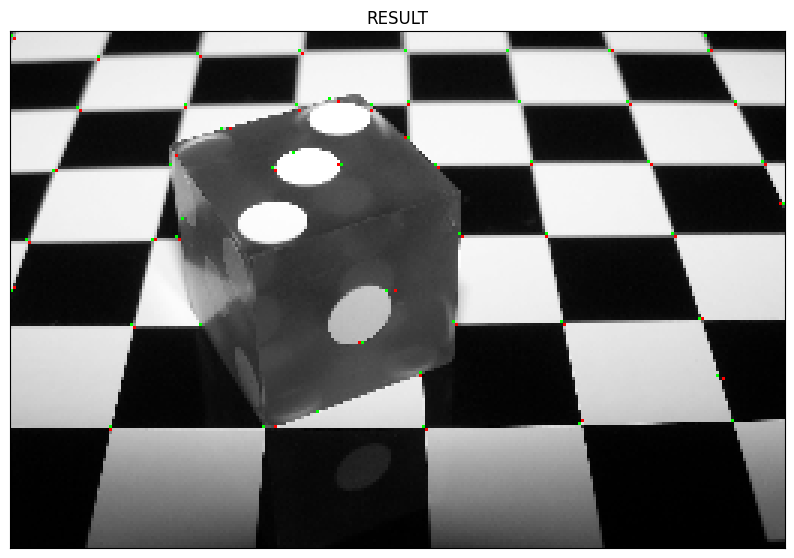

In [16]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

filename = 'images/chess.jpg'
img = cv.imread(filename)
assert img is not None, "Could not read the image."
# reduce the resolution if the image is too large
img = cv.resize(img, (0, 0), fx=0.1, fy=0.1)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# find Harris corners
gray = np.float32(gray)
dst = cv.cornerHarris(gray, 2, 3, 0.04)
dst = cv.dilate(dst, None)
ret, dst = cv.threshold(dst, 0.01*dst.max(), 255, 0)
dst = np.uint8(dst)

# find centroids
ret, labels, stats, centroids = cv.connectedComponentsWithStats(dst)

# define the criteria to stop and refine the corners
criteria = (cv.TERM_CRITERIA_EPS+cv.TERM_CRITERIA_MAX_ITER, 100, 0.001)
corners = cv.cornerSubPix(gray, np.float32(centroids), (5, 5), (-1, -1), criteria)

# now draw them
res = np.hstack((centroids, corners))
res = np.int0(res)
img[res[:, 1], res[:, 0]] = [0, 0, 255]
img[res[:, 3], res[:, 2]] = [0, 255, 0]

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()


### Shi-Tomasi Corner Detector & Good Features to Track

#### Theory

In last section, we saw Harris Corner Detector. Later in 1994, J. Shi and C. Tomasi made a small modification to it in their paper Good Features to Track which shows better results compared to Harris Corner Detector. The scoring function in Harris Corner Detector was given by:

$R = \lambda_1\lambda_2 - k(\lambda_1 + \lambda_2)^2$

Shi-Tomasi proposed:

$R = min(\lambda_1,\lambda_2)$

If it is greater than a threshold value, it is considered as a corner. If we plot it in $(\lambda_1,\lambda_2)$ space as we did in Harris Corner Detector, we get an image as below:

![haris_corner_detector.png](images/haris_corner_detector.png)

You can see only the points with minimum eigenvalue less than a threshold value (here I took 0.01) are depicted. Remaining are discarded. (Obviously, there may be some noise. We can later remove them with the help of dilation etc).

#### Code

OpenCV has a function, cv2.goodFeaturesToTrack(). It finds N strongest corners in the image by Shi-Tomasi method (or Harris Corner Detection, if you specify it). As usual, image should be a grayscale image. Then you specify number of corners you want to find. Then you specify the quality level, which is a value between 0-1, which denotes the minimum quality of corner below which everyone is rejected. Then we provide the minimum euclidean distance between corners detected.

With all these informations, the function finds corners in the image. All corners below quality level are rejected. Then it sorts the remaining corners based on quality in the descending order. Then function takes first strongest corner, throws away all the nearby corners in the range of minimum distance and returns N strongest corners.

In below example, we will try to find 25 best corners:

/var/folders/2x/b5gtx1gx5rb7q6n60wjbv_s00000gn/T/ipykernel_12643/355003597.py:13: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


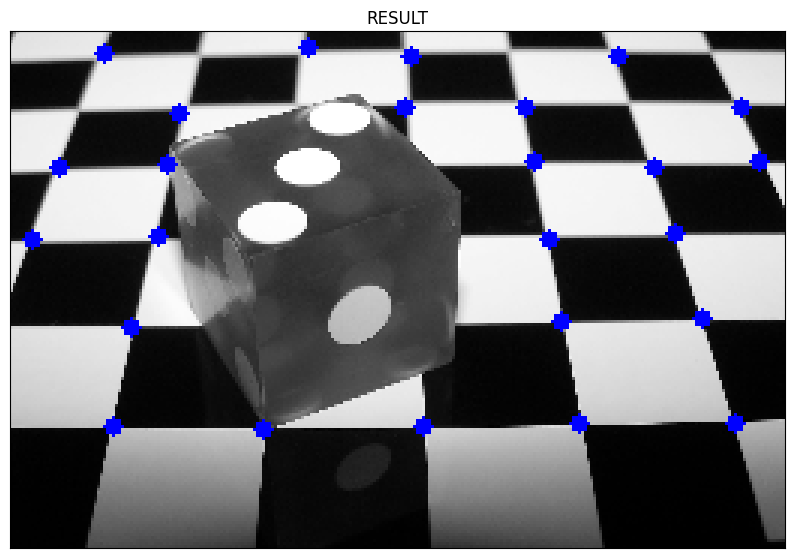

In [17]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

filename = 'images/chess.jpg'
img = cv.imread(filename)
assert img is not None, "Could not read the image."
# reduce the resolution if the image is too large
img = cv.resize(img, (0, 0), fx=0.1, fy=0.1)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

corners = cv.goodFeaturesToTrack(gray, 25, 0.01, 10)
corners = np.int0(corners)

for i in corners:
    x, y = i.ravel()
    cv.circle(img, (x, y), 3, 255, -1)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()

This function is more appropriate for tracking. We will see that in later chapters.

### SIFT (Scale-Invariant Feature Transform)

#### Theory

In last couple of sections, we saw some corner detectors like Harris etc. They are rotation-invariant, which means, even if the image is rotated, we can find the same corners. It is obvious because corners remain corners in rotated image also. But what about scaling? A corner may not be a corner if the image is scaled. So Harris corner is not scale invariant.

In 2004, D.Lowe, University of British Columbia, came up with a new algorithm, Scale Invariant Feature Transform (SIFT) in his paper, Distinctive Image Features from Scale-Invariant Keypoints, which extract keypoints and compute its descriptors. The good thing about SIFT is, they are invariant to image scaling, rotation, and translation, partially invariant to illumination changes and robust to local geometric distortion. In this chapter, we will discuss the remaining three properties, but illumination invariance will be discussed in coming chapters.

#### Scale-space Extrema Detection

In it, Laplacian of Gaussian is found for the image with various $\sigma$ values. LoG acts as a blob detector which detects blobs in various sizes due to change in $\sigma$. In short, $\sigma$ acts as a scaling parameter. For eg, in the above image, gaussian kernel with low $\sigma$ gives high value for small corner whereas guassian kernel with high $\sigma$ fits well for larger corner. So, we can find the local maxima across the scale and space which gives us a list of $(x,y,\sigma)$ values which means there is a potential keypoint at $(x,y)$ at $\sigma$ scale.

But this LoG is a little costly, so SIFT algorithm uses Difference of Gaussians which is an approximation of LoG. Difference of Gaussian is obtained as the difference of Gaussian blurring of an image with two different $\sigma$, let it be $\sigma$ and $k\sigma$. This process is done for different octaves of the image in Gaussian Pyramid. Each octave contains images that are twice reduced in size of the previous octave. This is done until the size of the image becomes less than the specified minimum size of the image.

Once this DoG is found, images are searched for local extrema over scale and space. For eg, one pixel in an image is compared with its 8 neighbours as well as 9 pixels in next scale and 9 pixels in previous scales. If it is a local extrema, it is a potential keypoint. It basically means that keypoint is best represented in that scale.

Regarding different parameters of SIFT constructor, we can read from OpenCV docs:

    nfeatures – The number of best features to retain. The features are ranked by their scores (measured in SIFT algorithm as the local contrast)
    nOctaveLayers – The number of layers in each octave. 3 is the value used in D. Lowe paper. The number of octaves is computed automatically from the image resolution.
    contrastThreshold – The contrast threshold used to filter out weak features in semi-uniform (low-contrast) regions. The larger the threshold, the less features are produced by the detector.
    edgeThreshold – The threshold used to filter out edge-like features. Note that the its meaning is different from the contrastThreshold, i.e. the larger the edgeThreshold, the less features are filtered out (more features are retained).
    sigma – The sigma of the Gaussian applied to the input image at the octave \#0. If your image is captured with a weak camera with soft lenses, you might want to reduce the number.

#### Keypoint Localization

Once potential keypoints locations are found, they have to be refined to get more accurate results. They used Taylor series expansion of scale space to get more accurate location of extrema, and if the intensity at this extrema is less than a threshold value (0.03 as per the paper), it is rejected. This threshold is called contrastThreshold in OpenCV.

DoG has higher response for edges, so edges also need to be removed. For this, a concept similar to Harris corner detector is used. They used a 2x2 Hessian matrix (H) to compute the pricipal curvature. We know from Harris corner detector that for edges, one eigen value is larger than the other. So here they used a simple function,

$Tr(H)^2 / Det(H) < \frac{(r+1)^2}{r}$

where r is a parameter which is empirically taken as 10.

#### Orientation Assignment

Now an orientation is assigned to each keypoint to achieve invariance to image rotation. A neigbourhood is taken around the keypoint location depending on the scale, and the gradient magnitude and direction is calculated in that region. An orientation histogram with 36 bins covering 360 degrees is created. (It is weighted by gradient magnitude and gaussian-weighted circular window with $\sigma$ equal to 1.5 times the scale of keypoint.)

It is smoothed with a gaussian of $\sigma$ equal to 1.5 times the scale of keypoint. The highest peak in the histogram is taken and any peak above 80% of it is also considered to calculate the orientation. It creates keypoints with same location and scale, but different directions. It contribute to the stability of matching.

#### Keypoint Descriptor

Now keypoint descriptor is created. A 16x16 neighbourhood around the keypoint is taken. It is divided into 16 sub-blocks of 4x4 size. For each sub-block, 8 bin orientation histogram is created. So a total of 128 bin values are available. It is represented as a vector to form keypoint descriptor. In addition to this, several measures are taken to achieve robustness against illumination changes, rotation etc.

#### Keypoint Matching

Keypoints between two images are matched by identifying their nearest neighbours. But in some cases, the second closest-match may be very near to the first. It may happen due to noise or some other reasons. In that case, ratio of closest-distance to second-closest distance is taken. If it is greater than 0.8, they are rejected. It eliminaters around 90% of false matches while discards only 5% correct matches, as per the paper.

#### SIFT in OpenCV

OpenCV provides all the necessary functions to implement SIFT algorithm. We will see one by one.




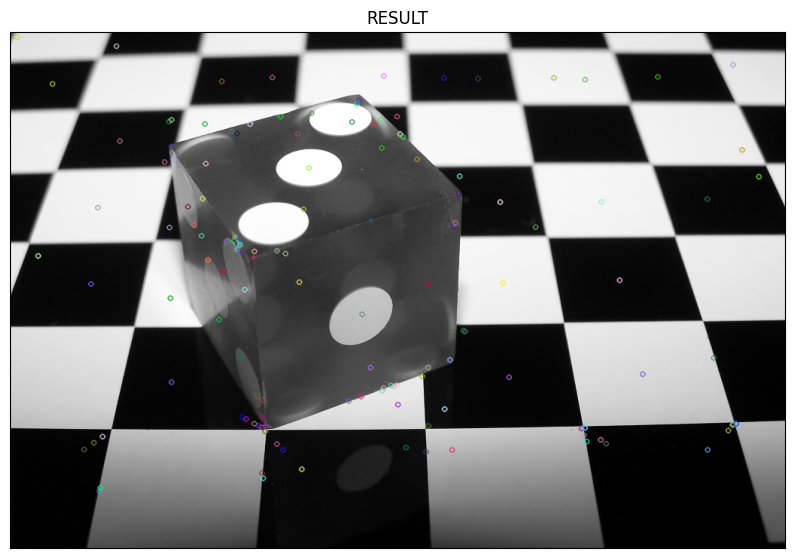

In [24]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

filename = 'images/chess.jpg'
img = cv.imread(filename)
img = cv.resize(img, (0, 0), fx=0.4, fy=0.4)
assert img is not None, "Could not read the image."
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

sift = cv.SIFT_create()
kp = sift.detect(gray, None)

img = cv.drawKeypoints(gray, kp, img)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()

sift.detect() function finds the keypoint in the images. You can pass a mask if you want to search only a part of image. Each keypoint is a special structure which has many attributes like its $(x,y)$ coordinates, size of the meaningful neighbourhood, angle which specifies its orientation, response that specifies strength of keypoints etc.

OpenCV provides a function, cv2.drawKeypoints() which draws the small circles on the locations of keypoints. If you pass a flag, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS to it, it will draw a circle with size of keypoint and it will even show its orientation. See below example.



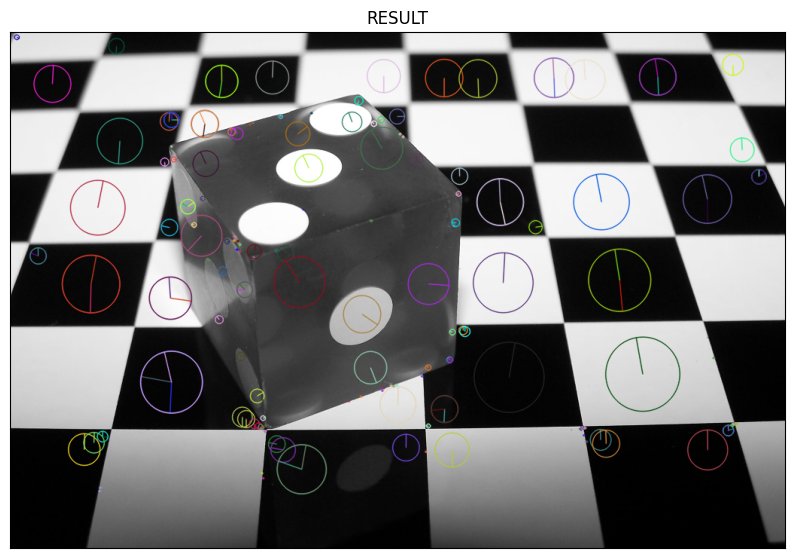

In [25]:
img = cv.drawKeypoints(gray, kp, img, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()

Now to calculate the descriptor, OpenCV provides two methods.

    Since you already found keypoints, you can call sift.compute() which computes the descriptors from the keypoints we have found.
    If you didn’t find keypoints, directly find keypoints and descriptors in a single step with the function, sift.detectAndCompute().


In [27]:
sift = cv.SIFT_create()
kp, des = sift.detectAndCompute(gray, None)
print(kp)
print(des)

(< cv2.KeyPoint 0x1495e7a20>, < cv2.KeyPoint 0x149662eb0>, < cv2.KeyPoint 0x149662b50>, < cv2.KeyPoint 0x149663360>, < cv2.KeyPoint 0x149662c10>, < cv2.KeyPoint 0x149663870>, < cv2.KeyPoint 0x1496627f0>, < cv2.KeyPoint 0x149662580>, < cv2.KeyPoint 0x149663180>, < cv2.KeyPoint 0x149663120>, < cv2.KeyPoint 0x1496625e0>, < cv2.KeyPoint 0x1496636c0>, < cv2.KeyPoint 0x149662cd0>, < cv2.KeyPoint 0x149803de0>, < cv2.KeyPoint 0x149803db0>, < cv2.KeyPoint 0x149803cc0>, < cv2.KeyPoint 0x149802a30>, < cv2.KeyPoint 0x149803570>, < cv2.KeyPoint 0x149802fa0>, < cv2.KeyPoint 0x149803bd0>, < cv2.KeyPoint 0x149803a20>, < cv2.KeyPoint 0x149802b80>, < cv2.KeyPoint 0x149802520>, < cv2.KeyPoint 0x149801ec0>, < cv2.KeyPoint 0x149802af0>, < cv2.KeyPoint 0x149802df0>, < cv2.KeyPoint 0x149803b10>, < cv2.KeyPoint 0x149803030>, < cv2.KeyPoint 0x149802a90>, < cv2.KeyPoint 0x149802a60>, < cv2.KeyPoint 0x149802ac0>, < cv2.KeyPoint 0x149802fd0>, < cv2.KeyPoint 0x1498026d0>, < cv2.KeyPoint 0x149803060>, < cv2.KeyPoin

Here kp will be a list of keypoints and des is a numpy array of shape Number_of_Keypoints×128. Each row in it corresponds to a keypoint descriptor.

### SURF (Speeded-Up Robust Features)

#### Theory

SURF is a patented local feature detector and descriptor. It can be used for tasks such as object recognition, image registration, classification or 3D reconstruction. It is partly inspired by the human visual system where two important faculties viz. the ability to quickly recognise small similar patterns, and the ability to identify objects among clutters by focusing only on discriminatory features play an important role. It can be used where SIFT was used, but SURF is several times faster than SIFT.

SURF uses a blob detector algorithm which identifies regions of interest in the image. These regions are then described by the Haar wavelet response around it. SURF uses a similar measuring technique to SIFT keeping the speed issue in mind. But SURF uses 2D Haar wavelet response instead of SIFT which uses 1D Gaussian function.

#### SURF in OpenCV

OpenCV provides SURF functionalities just like SIFT. You initiate a SURF object with some optional conditions like 64/128-dim descriptors, Upright/Normal SURF etc. Then as we did in SIFT, we can detect and compute keypoints.

In [3]:
## in opencv 4.8.0 and for patent issues, SURF wont work
import cv2 as cv
img = cv.imread('images/chess.jpg')
assert img is not None, "Could not read the image."

surf = cv.xfeatures2d.SURF_create(400)
kp, des = surf.detectAndCompute(gray, None)
print(len(kp))
## we will get over 400 keypoints
## lets reduce it

print (surf.getHessianThreshold())

surf.setHessianThreshold(50000)

kp, des = surf.detectAndCompute(gray, None)

print(len(kp))
## it will be less than before

img = cv.drawKeypoints(gray, kp, img, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()

# Now apply U-SURF so that it wont find the orientation
print (surf.getUpright())

surf.setUpright(True)

kp = surf.detect(gray, None)
img = cv.drawKeypoints(gray, kp, img, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()

## finally we will check the descriptor size and change it to 128

print (surf.descriptorSize())

surf.setExtended(True)

kp, des = surf.detectAndCompute(gray, None)

print(surf.descriptorSize())

print(des.shape)

AttributeError: module 'cv2.xfeatures2d' has no attribute 'SURF_create'

### FAST Algorithm for Corner Detection

#### Theory

We saw several feature detectors and many of them are really good. But when looking from a real-time application point of view, they are not fast enough. One best example would be SLAM (Simultaneous Localization and Mapping) mobile robot which have limited computational resources. So in this section, we will look into a fast and efficient algorithm proposed by Edward Rosten and Tom Drummond in their paper “Machine learning for high-speed corner detection” in 2006 (Later revised it in 2010). It is called FAST (Features from Accelerated Segment Test) algorithm.

##### Feature Detection using FAST

1. Select a pixel $p$ in the image which is to be identified as an interest point or not. Let its intensity be $I_p$.

2. Select appropriate threshold value $t$.

3. Consider a circle of 16 pixels around the pixel under test.

4. Now the pixel $p$ is a corner if there exists a set of n contiguous pixels in the circle (of 16 pixels) which are all brighter than $I_p + t$, or all darker than $I_p − t$. (Shown as white dash lines in the above image). n was chosen to be 12.

5. A high-speed test was proposed to exclude a large number of non-corners. This test examines only the four pixels at 1, 9, 5 and 13 (First it checks whether $I_9 > I_p + t$ or not. If true, it checks whether $I_5 > I_p + t$ or not. If true, it checks $I_13 > I_p + t$ or not. If true, then p is a corner. If any one of them is false, then p is not a corner). If $I_9 > I_p + t$ is false, then $I_5 < I_p − t$. If $I_5 < I_p − t$ is false, then $I_13 < I_p − t$. If $I_13 < I_p − t$ is false, then p is not a corner.

First 3 points are addresed with machine learning approach and last point is addressed using non-maximal suppression.

##### Machine Learning a Corner Detector

1. Select a set of images for training. Preferably images of the same scene in different conditions, like different lightings, different view angles etc. For example, if you want to detect corners in an outdoor environment, take images of the same scene in sunny, cloudy, rainy days etc. Then in each image, select pixels which are corners and store their $(x,y)$ coordinates.

2. Run FAST algorithm in every image to find feature points.

3. For each feature point found, store its $(x,y)$ coordinates and pixel values in 16x16 patch around the feature point.

4. Now for each pixel in this 16x16 patch, check if it is one of the following states :
    
        a. Brighter than $I_p + t$ (mark it as 1)
    
        b. Darker than $I_p − t$ (mark it as −1)
    
        c. Neither above two (mark it as 0)

5. Depending upon the states, the feature vector P is subdivided into 3 subsets, $P_d$, $P_b$ and $P_u$ which contains pixels marked as −1, 1 and 0 respectively. For example, if there are 8 pixels in a 16x16 patch which are brighter than $I_p + t$, then $P_b$ will have 8 entries. Similarly for $P_d$ and $P_u$.

6. Define a new boolean variable $K_p$ which is 1 if $|P_d| > 2$ or $|P_b| > 2$ (where $|P_d|$ means the number of elements in $P_d$ and so on). It means that if there are more than 2 dark or bright pixels in the 16x16 patch around the feature point, it is not likely to be a corner. So mark it as 1, means it is not a corner. Else mark it as 0, means it is a corner.

7. Use the ID3 algorithm to learn a decision tree classifier using the feature vector P and the variable $K_p$.

8. This is recursively applied to all the training data. Finally, a decision tree is obtained which can be used to classify new feature points into corners and non-corners.

##### Non-maximal Suppression

Even after applying the above algorithm, we get a lot of feature points which are adjacent to each other. This is redundant and we can reduce it by applying non-maximal suppression. It is done as follows:

1. Compute the score function $V = min(V_1,V_2)$ where $V_1$ and $V_2$ are the values of $K_p$ for the two pixels adjacent to the corner pixel under test.

2. Consider two adjacent keypoints $p$ and $q$ where $p$ is the corner pixel under test and $q$ is one of its adjacent pixels. If $V_p > V_q$, then $q$ is removed from the set of interest points.

3. This is applied to all the pixels in the image.

#### FAST in OpenCV

It is called as any other feature detector in OpenCV. For this, we have a function, cv2.FastFeatureDetector(). It provides a lot of useful features. Like whether to use non-maximal suppression or not, whether to detect corners or not, etc. Another important feature is that, it can be applied for multi-scale image contents. By varying the threshold and type of threshold, we can get different results. Below is a simple code snippet which shows its usage for different features.











Threshold:  10
nonmaxSuppression:  True
neighborhood:  2
Total Keypoints with nonmaxSuppression:  1068


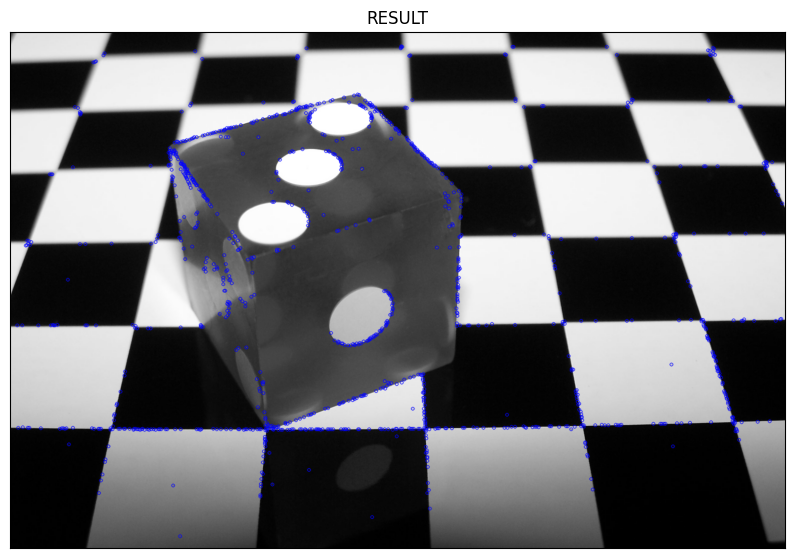

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

filename = 'images/chess.jpg'
img = cv.imread(filename, cv.IMREAD_GRAYSCALE)
img = cv.resize(img, (0, 0), fx=0.6, fy=0.6)
assert img is not None, "Could not read the image."

# Initiate FAST detector
fast = cv.FastFeatureDetector_create()

# find and draw the keypoints
kp = fast.detect(img, None)
img2 = cv.drawKeypoints(img, kp, None, color=(255, 0, 0))

# Print all default params
print("Threshold: ", fast.getThreshold())
print("nonmaxSuppression: ", fast.getNonmaxSuppression())
print("neighborhood: ", fast.getType())
print("Total Keypoints with nonmaxSuppression: ", len(kp))

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()


### BRIEF (Binary Robust Independent Elementary Features)

#### Theory

We know SIFT uses 128-dim vector for descriptors. Since it is using floating point numbers, it takes 512 bytes. It is a large vector and takes more time for matching. We can compress it to 256 bytes with the help of PCA, but still it is not fast enough for real-time applications. So authors came up with another algorithm, BRIEF which is simple, faster and efficient also. As the name suggests, it uses binary strings of intensity comparisons between pair of points in the image patch, and this is efficient to compute also. But it is not scale-invariant. So again, it is better to use it with scale-invariant features like SIFT.

BRIEF is a feature descriptor. It takes input as grayscale image and outputs a binary string (descriptor) of dimension N. It finds $N$ out of $n_d$ possible tests which are most discriminative. (Here $n_d$ is the number of possible comparisons. See below). The result is a binary string of N dimensions. One important point is that it should be rotation invariant. So it computes gradients with respect to a random point $p$ and compares them to other $n_d$ points in the patch with random orientation $\theta$.

In short, BRIEF is a faster method feature descriptor calculation and matching. It also provides high recognition rate unless there is large in-plane rotation.

#### STAR(CenSurE) in OpenCV

STAR is a feature detector derived from CenSurE (Center Surround Extremas) detector. It is basically a blob detector and it detects features based on the determinant of Hessian matrix. It is rotation and scale invariant. It is also faster than SIFT and SURF. It is also called as CenSurE sometimes. It is available in OpenCV.

#### BRIEF in OpenCV

Below is a simple code snippet which shows its usage for different features.

In [14]:
## BRIEF opencv function is patented and not available in opencv 4.8.0s
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

filename = 'images/chess.jpg'
img = cv.imread(filename, cv.IMREAD_GRAYSCALE)
img = cv.resize(img, (0, 0), fx=0.6, fy=0.6)

# Initiate FAST detector
fast = cv.FastFeatureDetector_create()

# Initiate BRIEF extractor
brief = cv.xfeatures2d.BriefDescriptorExtractor_create()

# find the keypoints with FAST
kp = fast.detect(img, None)

# compute the descriptors with BRIEF
kp, des = brief.compute(img, kp)

# the fuction brief.getDescriptorSize() gives the $n_d$ size used in bytes
# By default it is 32 bytes.
print(brief.descriptorSize())
print(des.shape)

AttributeError: module 'cv2.xfeatures2d' has no attribute 'BriefDescriptorExtractor_create'

### ORB (Oriented FAST and Rotated BRIEF)

#### Theory

ORB is basically a fusion of FAST keypoint detector and BRIEF descriptor with many modifications to enhance the performance. First it use FAST to find keypoints, then apply Harris corner measure to find top N points among them. It also use pyramid to produce multiscale-features. But one problem is that, FAST doesn’t compute the orientation. So what about rotation invariance? Authors came up with following modification.

It computes the intensity weighted centroid of the patch with located corner at center. The direction of the vector from this corner point to centroid gives the orientation. To improve the rotation invariance, moments are computed with x and y which should be in a circular region of radius r, where r is the size of the patch.

Another advantage of ORB is that it uses less memory. It use less than 256 bytes to store a descriptor. There is also provision for hand crafted features and other First-Order and Second-order derivatives.

#### ORB in OpenCV

OpenCV has the function, cv2.ORB() for this. By default, it uses the following parameters for initialization.

    nFeatures = 500
    scaleFactor = 1.2
    nLevels = 8
    edgeThreshold = 31
    firstLevel = 0
    WTA_K = 2
    scoreType = ORB::HARRIS_SCORE
    patchSize = 31
    fastThreshold = 20

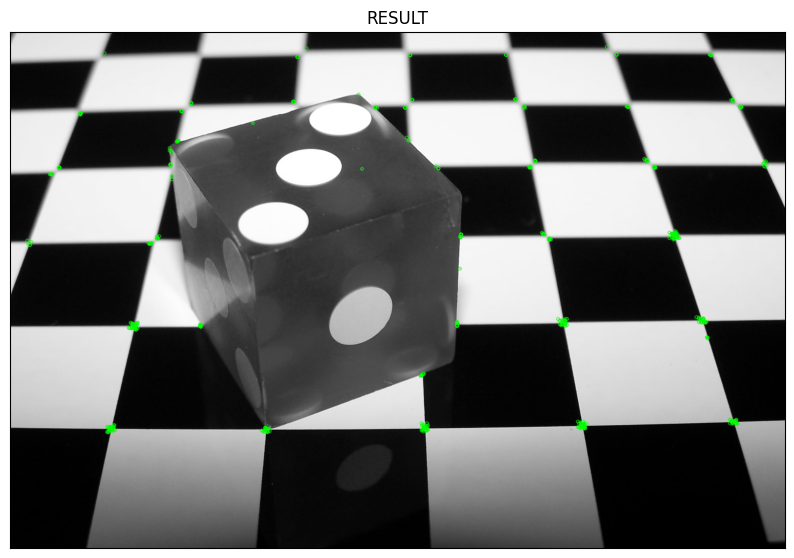

In [16]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

filename = 'images/chess.jpg'
img = cv.imread(filename, cv.IMREAD_GRAYSCALE)
img = cv.resize(img, (0, 0), fx=0.6, fy=0.6)

# Initiate ORB detector
orb = cv.ORB_create()

# find the keypoints with ORB
kp = orb.detect(img, None)

# compute the descriptors with ORB
kp, des = orb.compute(img, kp)

# draw only keypoints location, not size and orientation
img2 = cv.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=0)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()

### Feature Matching

#### Brute-Force Matcher

Brute-Force matcher is simple. It takes the descriptor of one feature in first set and is matched with all other features in second set using some distance calculation. And the closest one is returned.

For BF matcher, first we have to create the BFMatcher object using cv2.BFMatcher(). It takes two optional params. First one is normType. It specifies the distance measurement to be used. By default, it is cv2.NORM_L2. It is good for SIFT, SURF etc (cv2.NORM_L1 is also there). For binary string based descriptors like ORB, BRIEF, BRISK etc, cv2.NORM_HAMMING should be used, which used Hamming distance as measurement. If ORB is using WTA_K == 3 or 4, cv2.NORM_HAMMING2 should be used.

Second param is boolean variable, crossCheck which is false by default. If it is true, Matcher returns only those matches with value (i,j) such that i-th descriptor in set A has j-th descriptor in set B as the best match and vice-versa. That is, the two features in both sets should match each other. It provides consistant result, and is a good alternative to ratio test proposed by D.Lowe in SIFT paper.

Once it is created, two important methods are BFMatcher.match() and BFMatcher.knnMatch(). First one returns the best match. Second method returns k best matches where k is specified by the user. It may be useful when we need to do additional work on that.

As usual, we need to use cv2.drawMatches() to draw the matched keypoints.

#### Brute-Force Matching with ORB Descriptors

Here, we will see a simple example on how to match features between two images. In this case, I have a queryImage and a trainImage. We will try to find the queryImage in trainImage using feature matching. (In some applications, we have to find where a particular object is located in a larger image. For example, in a robot finding the navigation path, you have to find a particular object). For that, we use feature matching. But we have to find the features first. Then we use Brute-Force matcher with Hamming distance to find the matching features.

See the code below:

(Text(0.5, 1.0, 'RESULT'), ([], []), ([], []))

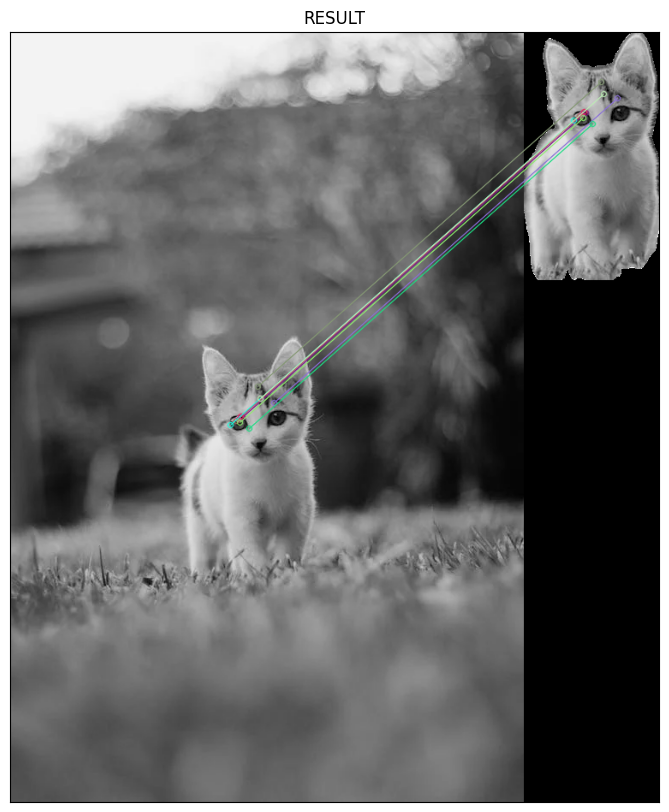

In [21]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img1 = cv.imread('images/cat.webp', cv.IMREAD_GRAYSCALE)
img2 = cv.imread('images/cat_little.png', cv.IMREAD_GRAYSCALE)
assert img1 is not None, "Could not read the image."
assert img2 is not None, "Could not read the image."

# Initiate ORB detector
orb = cv.ORB_create()

# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Next we create a BFMatcher object with distance measurement cv.NORM_HAMMING
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)

# Match descriptors
matches = bf.match(des1, des2)

# Sort them in the order of their distance
matches = sorted(matches, key=lambda x:x.distance)

# Draw first 10 matches
img3 = cv.drawMatches(img1, kp1, img2, kp2, matches[:10], None, flags=2)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img3, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])



#### What is this Matcher Object?

The result of matches = bf.match(des1,des2) line is a list of DMatch objects. This DMatch object has following attributes:

    DMatch.distance - Distance between descriptors. The lower, the better it is.
    DMatch.trainIdx - Index of the descriptor in train descriptors
    DMatch.queryIdx - Index of the descriptor in query descriptors
    DMatch.imgIdx - Index of the train image.

#### Brute-Force Matching with SIFT Descriptors and Ratio Test

Here, we will see a simple example on how to match features between two images. In this case, I have a queryImage and a trainImage. We will try to find the queryImage in trainImage using feature matching. (In some applications, we have to find where a particular object is located in a larger image. For example, in a robot finding the navigation path, you have to find a particular object). For that, we use feature matching. But we have to find the features first. Then we use Brute-Force matcher with SIFT descriptors and ratio test to find the matching features.

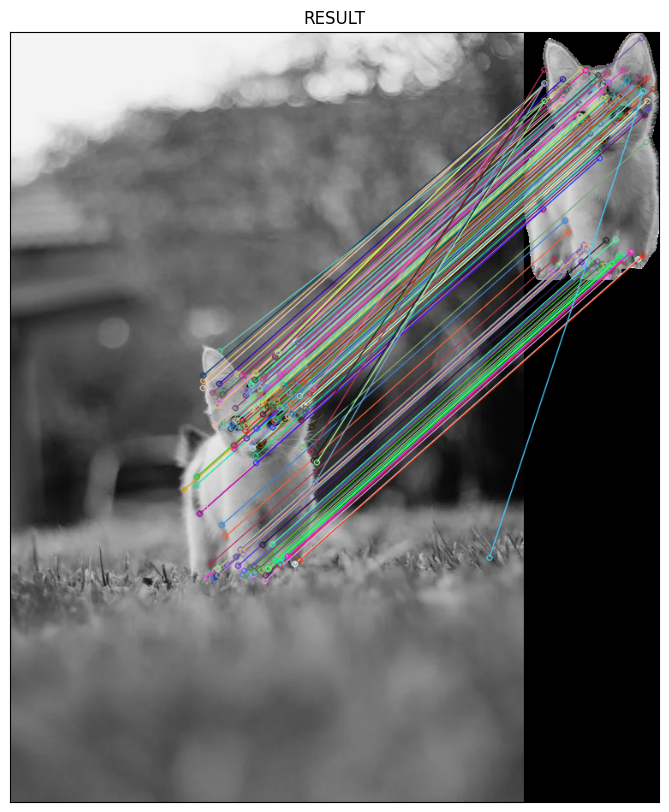

In [22]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img1 = cv.imread('images/cat.webp', cv.IMREAD_GRAYSCALE)
img2 = cv.imread('images/cat_little.png', cv.IMREAD_GRAYSCALE)
assert img1 is not None, "Could not read the image."
assert img2 is not None, "Could not read the image."

# Initiate SIFT detector
sift = cv.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# BFMatcher with default params
bf = cv.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test
good = []
for m, n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])

# cv.drawMatchesKnn expects list of lists as matches
img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2, good, None, flags=2)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img3, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()


#### FLANN based Matcher

FLANN stands for Fast Library for Approximate Nearest Neighbors. It contains a collection of algorithms optimized for fast nearest neighbor search in large datasets and for high dimensional features. It works faster than BFMatcher for large datasets. We will see the second example with FLANN based matcher.

For FLANN based matcher, we need to pass two dictionaries which specifies the algorithm to be used, its related parameters etc. First one is IndexParams. For various algorithms, the information to be passed is explained in FLANN docs. As a summary, for algorithms like SIFT, SURF etc. you can pass following:

    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

While using ORB, you can pass the following. The commented values are recommended as per the docs, but it didn’t provide required results in some cases. Other values worked fine. :

    index_params= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 6, # 12
                   key_size = 12,     # 20
                   multi_probe_level = 1) #2

Second dictionary is the SearchParams. It specifies the number of times the trees in the index should be recursively traversed. Higher values gives better precision, but also takes more time. If you want to change the value, pass search_params = dict(checks=100).

For better results, algorithm parameters should be tuned according to the dataset. So this modified code gives us better results for ORB.

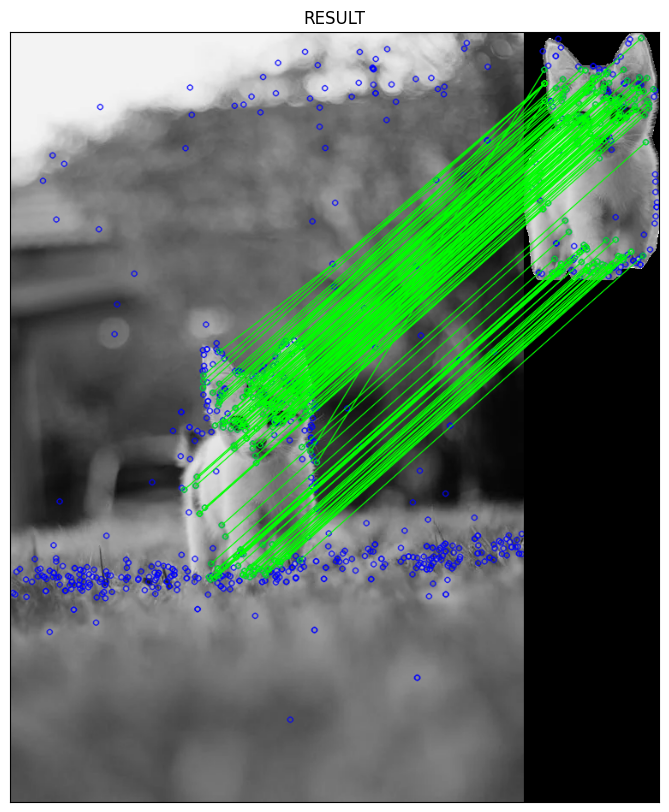

In [23]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img1 = cv.imread('images/cat.webp', cv.IMREAD_GRAYSCALE)
img2 = cv.imread('images/cat_little.png', cv.IMREAD_GRAYSCALE)

# Initiate SIFT detector
sift = cv.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

# Initiate Flann Matcher
flann = cv.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(des1, des2, k=2)

# Need to draw only good matches, so create a mask
matchesMask = [[0, 0] for i in range(len(matches))]

# ratio test as per Lowe's paper
for i, (m, n) in enumerate(matches):
    if m.distance < 0.7*n.distance:
        matchesMask[i] = [1, 0]

draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), matchesMask=matchesMask, flags=0)

img3 = cv.drawMatchesKnn(img1, kp1, img2, kp2, matches, None, **draw_params)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img3, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()

#### Feature Matching + Homography to find Objects

We used a queryImage, found some feature points in it, we We used a queryImage, found some feature points in it, we took another trainImage, found the features in that image too and we found the best matches among them. In short, we found locations of some parts of an object in another cluttered image. This information is sufficient to find the object exactly on the trainImage.

For that, we can use a function from calib3d module, ie cv2.findHomography(). If we pass the set of points from both the images, it will find the perpective transformation of that object. Then we can use cv2.perspectiveTransform() to find the object. It needs atleast four correct points to find the transformation.

We have seen that there can be some possible errors while matching which may affect the result. To solve this problem, algorithm uses RANSAC or LEAST_MEDIAN (which can be decided by the flags). So good matches which provide correct estimation are called inliers and remaining are called outliers. cv2.findHomography() returns a mask which specifies the inlier and outlier points.

See the code below:


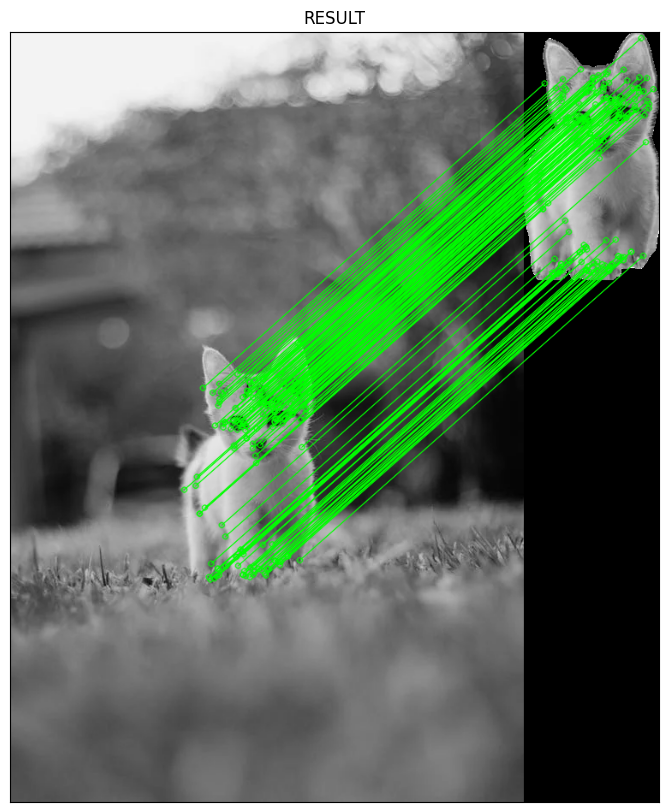

In [24]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

MIN_MATCH_COUNT = 10

img1 = cv.imread('images/cat.webp', cv.IMREAD_GRAYSCALE)
img2 = cv.imread('images/cat_little.png', cv.IMREAD_GRAYSCALE)

# Initiate SIFT detector
sift = cv.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

# Initiate Flann Matcher
flann = cv.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(des1, des2, k=2)

# store all the good matches as per Lowe's ratio test
good = []
for m, n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)

if len(good) > MIN_MATCH_COUNT:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
    
    M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC, 5.0)
    matchesMask = mask.ravel().tolist()
    
    h, w = img1.shape
    pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)
    dst = cv.perspectiveTransform(pts, M)
    
    img2 = cv.polylines(img2, [np.int32(dst)], True, 255, 3, cv.LINE_AA)

else:
    print("Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT))
    matchesMask = None

draw_params = dict(matchColor=(0, 255, 0), singlePointColor=None, matchesMask=matchesMask, flags=2)

img3 = cv.drawMatches(img1, kp1, img2, kp2, good, None, **draw_params)

plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(img3, cv.COLOR_BGR2RGB))
plt.title('RESULT'), plt.xticks([]), plt.yticks([])
plt.show()
